In [118]:
%load_ext autoreload
%autoreload 2

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

from utils import mnist, plot_graphs, plot_mnist, to_onehot
from collections import defaultdict
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
mnist_tanh = transforms.Compose([
             transforms.ToTensor(),
             transforms.Normalize((0.5,), (0.5,)),
           ])

In [3]:
with torch.cuda.device(0):
    lr = 2e-4
    z_dim = 2
    batch_size = 50
    num_classes = 10
    train_loader, valid_loader, test_loader = mnist(valid=10000, transform=mnist_tanh)
    fixed_z = torch.randn((batch_size, 2))
    fixed_z_labels = to_onehot(torch.tensor(list(range(10))).repeat((5)), 10)
    fixed_data, fixed_labels = next(iter(test_loader))
    fixed_data = fixed_data.view(-1, 28 * 28)
    fixed_labels = torch.eye(10)[fixed_labels]
    
    batch_zeros = torch.zeros((batch_size, 1))
    batch_ones = torch.ones((batch_size, 1))

## Задание 1. Обучить две версии CAAE — "честную" и "нечестную", преобразовать с их помощью исходные данные в латентное представление и обучить 3 классификатора — один на исходных данных и два на полученных из разных CAAE. Сравнить качество классификации.

### "Fair" CAAE

In [4]:
# encoder

class Encoder(nn.Module):
    
    def __init__(self):
        super(Encoder, self).__init__()
        self.linear1 = nn.Linear(28 * 28, 512)
        self.linear2 = nn.Linear(512, 256)
        self.linear3 = nn.Linear(256, z_dim)
        
    def forward(self, x):
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = self.linear3(x)
        
        return x

In [5]:
# decoder

class Decoder(nn.Module):
    
    def __init__(self):
        super(Decoder, self).__init__()
        self.linear1 = nn.Linear(z_dim + num_classes, 256)
        self.linear2 = nn.Linear(256, 512)
        self.linear3 = nn.Linear(512, 28 * 28)
        
    def forward(self, x, y):
        x = F.relu(self.linear1(torch.cat((x, y), 1)))
        x = F.relu(self.linear2(x))
        x = F.tanh(self.linear3(x))
        
        return x

In [6]:
# discriminator

class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        self.linear1 = nn.Linear(z_dim + num_classes, 256)
        self.linear2 = nn.Linear(256, 512)
        self.linear3 = nn.Linear(512, 1)
        
    def forward(self, x, y):
        x = F.relu(self.linear1(torch.cat((x, y), 1)))
        x = F.relu(self.linear2(x))
        x = F.sigmoid(self.linear3(x))
        
        return x

In [7]:
# constructing the model

with torch.cuda.device(0):
    enc, dec, disc = Encoder(), Decoder(), Discriminator()      
    
    enc_opt = optim.Adam(enc.parameters(), lr=lr)
    dec_opt = optim.Adam(dec.parameters(), lr=lr)
    disc_opt = optim.Adam(disc.parameters(), lr=lr)
    
    train_log = {'E': [], 'AE': [], 'D': []}
    test_log = {'E': [], 'AE': [], 'D': []}

In [8]:
def train(epoch, enc, dec, disc, log=None):
    with torch.cuda.device(0):
        train_size = len(train_loader.sampler)
        for batch_idx, (data, labels) in enumerate(train_loader):
            
            enc.zero_grad()
            disc.zero_grad()
            
            # pre-processing the data
            data = data.view(-1, 28 * 28)
            y_oh = torch.eye(num_classes)[labels]
            
            z_labels = to_onehot(np.random.randint(0, num_classes, (batch_size)), num_classes)
            
            # training the discriminator
            true_pred = disc(torch.randn(batch_size, z_dim), z_labels)
            fake_pred = disc(enc(data), y_oh)
            
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
            disc_loss = 0.5 * (fake_loss + true_loss)
            
            disc_loss.backward()
            disc_opt.step()
            
            ################
            enc.zero_grad()
            dec.zero_grad()
            disc.zero_grad()
            
            # training the autoencoder         
            encoded = enc(data)
            decoded = dec(encoded, y_oh)
            
            fake_pred = disc(encoded, y_oh)
            
            enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
            ae_loss = F.mse_loss(decoded, data)
            loss = ae_loss + enc_loss
            loss.backward()
            enc_opt.step()
            dec_opt.step()
            
            if batch_idx % 500 == 0:
                line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                    epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
                losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss.item(), ae_loss.item(), disc_loss.item())
                print(line + losses)
            
        else:
            batch_idx += 1
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss.item(), ae_loss.item(), disc_loss.item())
            print(line + losses)
            log['E'].append(enc_loss.item())
            log['AE'].append(ae_loss.item())
            log['D'].append(disc_loss.item())

In [9]:
def test(enc, dec, disc, loader, epoch, log=None):
    with torch.cuda.device(0):
        test_size = len(loader)
        with torch.no_grad():
            for data, labels in loader:
                data = data.view(-1, 28 * 28)
                y_oh = torch.eye(10)[labels]
                z_labels = to_onehot(np.random.randint(0, num_classes, (batch_size)), num_classes)
                
                encoded = enc(data)
                decoded = dec(encoded, y_oh)

                true_pred = disc(torch.randn(batch_size, z_dim), z_labels)
                fake_pred = disc(encoded, y_oh)

                fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
                true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()
                disc_loss = 0.5 * (fake_loss + true_loss)
                
                enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()
                ae_loss = F.mse_loss(decoded, data).item()     
                
            disc_loss /= test_size
            enc_loss /= test_size
            ae_loss /= test_size
        
        with torch.no_grad():
            ae_data = dec(enc(fixed_data), fixed_labels).data.numpy()
            fixed_gen = dec(fixed_z, fixed_z_labels).data.numpy()
            plot_mnist(fixed_data.reshape(-1, 1, 28, 28), (5, num_classes), 'Dataset numbers')
            plot_mnist(ae_data.reshape(-1, 1, 28, 28), (5, num_classes), 'Reconstructed numbers')
            plot_mnist(fixed_gen.reshape(-1, 1, 28, 28), (5, num_classes), 'Conditionally generated numbers')
                
    report = 'Test losses. E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss, ae_loss, disc_loss)
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses E: 0.4738, AE: 0.9267, D: 0.7251
Train Epoch: 1 [25000/50000 (50%)]	Losses E: 0.6804, AE: 0.2071, D: 0.6958
Train Epoch: 1 [50000/50000 (100%)]	Losses E: 0.6912, AE: 0.1978, D: 0.6933


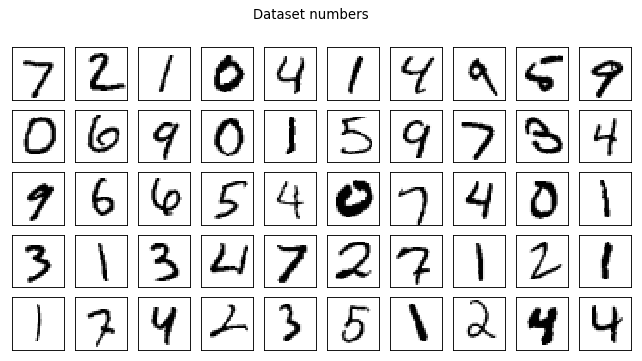

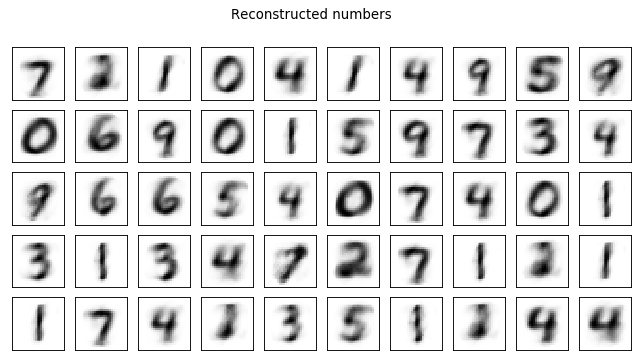

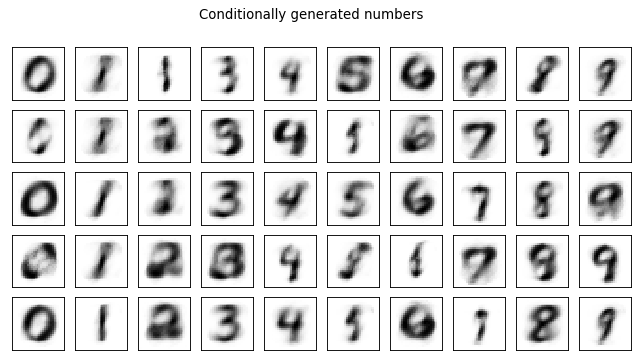

Test losses. E: 0.0035, AE: 0.0009, D: 0.0035
Train Epoch: 2 [0/50000 (0%)]	Losses E: 0.6913, AE: 0.1828, D: 0.6933
Train Epoch: 2 [25000/50000 (50%)]	Losses E: 0.6891, AE: 0.1660, D: 0.6938
Train Epoch: 2 [50000/50000 (100%)]	Losses E: 0.6922, AE: 0.1533, D: 0.6931


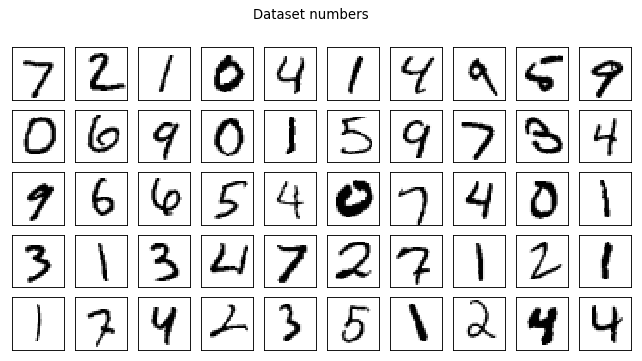

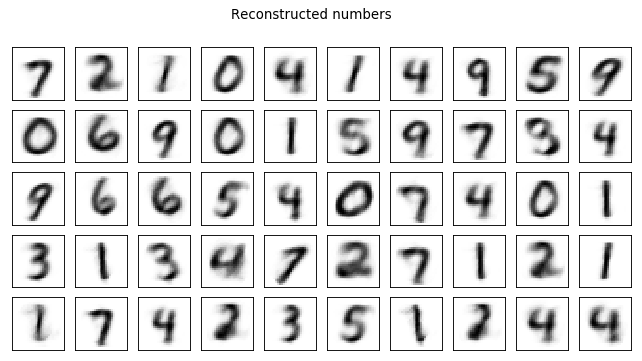

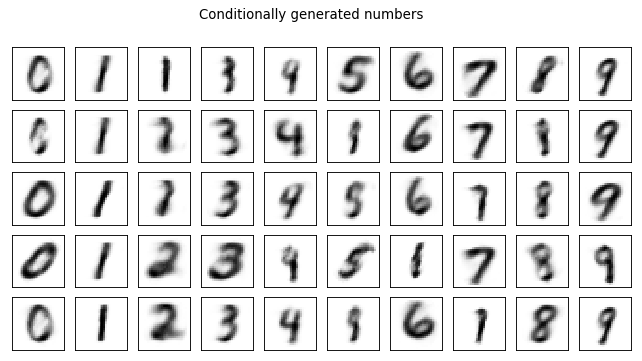

Test losses. E: 0.0035, AE: 0.0008, D: 0.0035
Train Epoch: 3 [0/50000 (0%)]	Losses E: 0.6917, AE: 0.1602, D: 0.6936
Train Epoch: 3 [25000/50000 (50%)]	Losses E: 0.6926, AE: 0.1621, D: 0.6929
Train Epoch: 3 [50000/50000 (100%)]	Losses E: 0.6926, AE: 0.1429, D: 0.6932


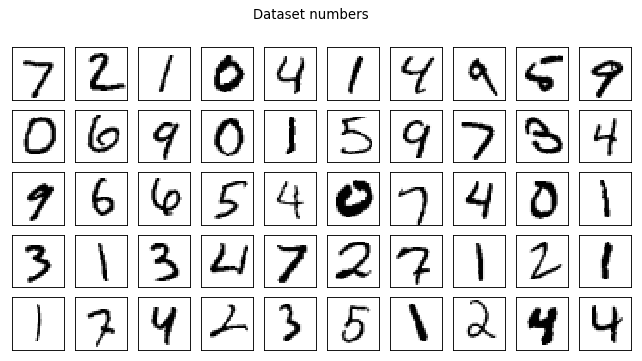

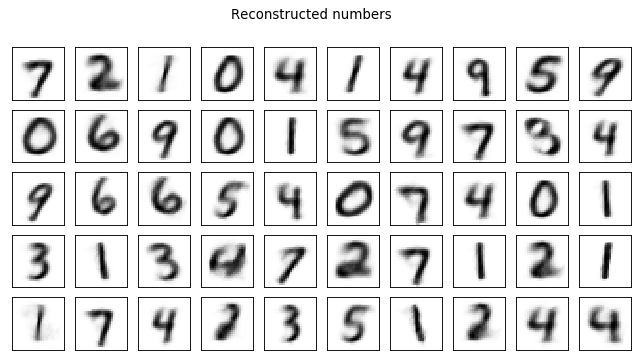

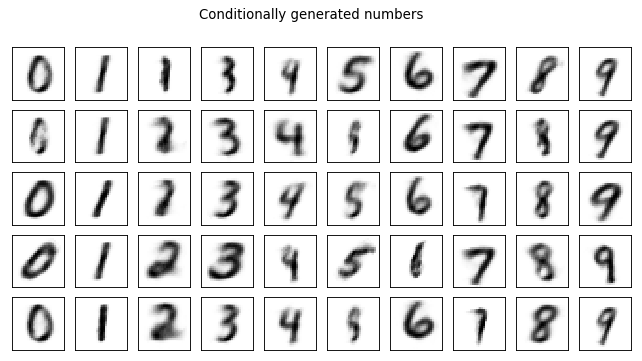

Test losses. E: 0.0035, AE: 0.0007, D: 0.0035
Train Epoch: 4 [0/50000 (0%)]	Losses E: 0.6930, AE: 0.1554, D: 0.6928
Train Epoch: 4 [25000/50000 (50%)]	Losses E: 0.6925, AE: 0.1569, D: 0.6931
Train Epoch: 4 [50000/50000 (100%)]	Losses E: 0.6928, AE: 0.1341, D: 0.6931


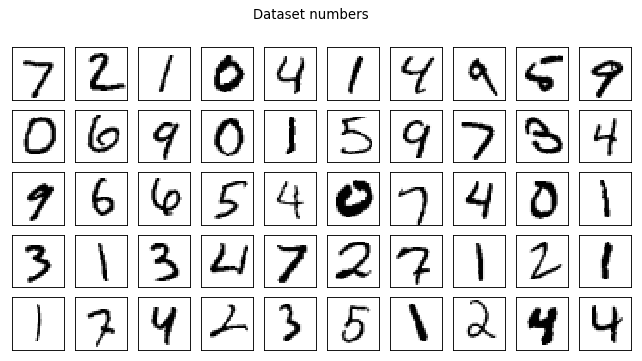

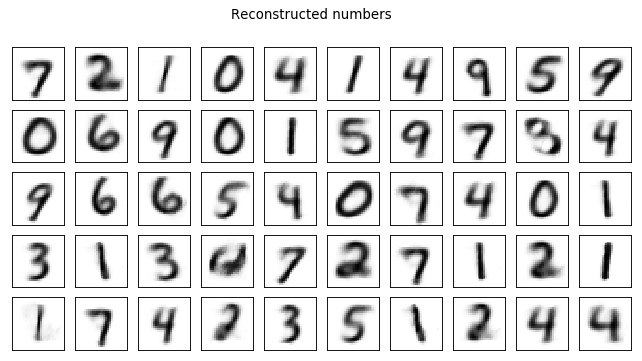

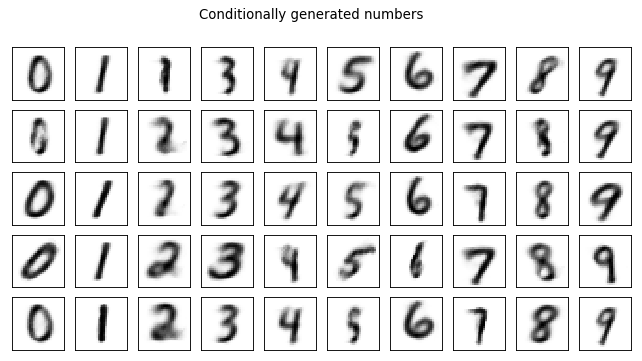

Test losses. E: 0.0035, AE: 0.0008, D: 0.0035
Train Epoch: 5 [0/50000 (0%)]	Losses E: 0.6928, AE: 0.1554, D: 0.6929
Train Epoch: 5 [25000/50000 (50%)]	Losses E: 0.6732, AE: 0.1347, D: 0.6946
Train Epoch: 5 [50000/50000 (100%)]	Losses E: 0.6641, AE: 0.1551, D: 0.6953


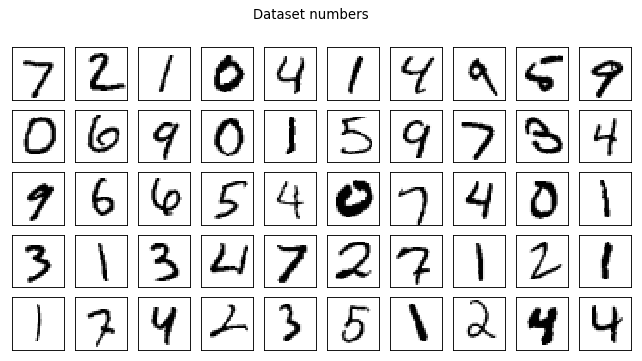

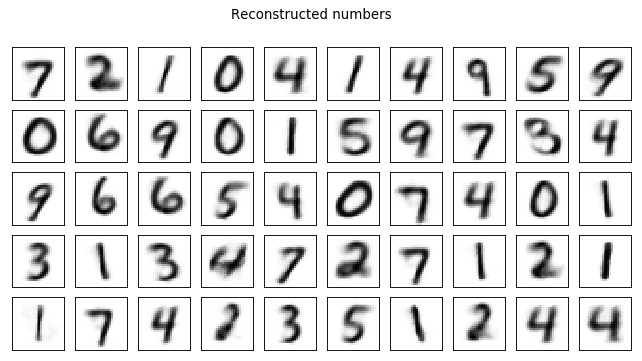

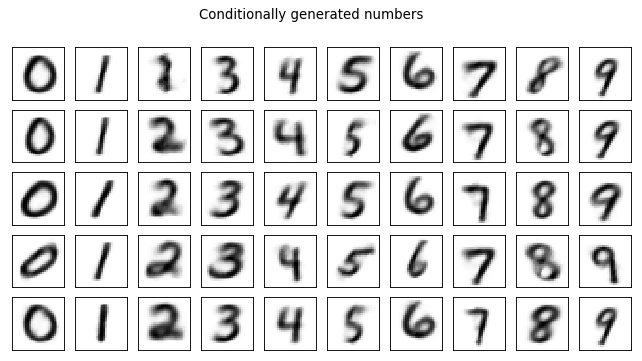

Test losses. E: 0.0033, AE: 0.0007, D: 0.0035
Train Epoch: 6 [0/50000 (0%)]	Losses E: 0.6653, AE: 0.1519, D: 0.6952
Train Epoch: 6 [25000/50000 (50%)]	Losses E: 0.6637, AE: 0.1492, D: 0.6934
Train Epoch: 6 [50000/50000 (100%)]	Losses E: 0.6793, AE: 0.1367, D: 0.6929


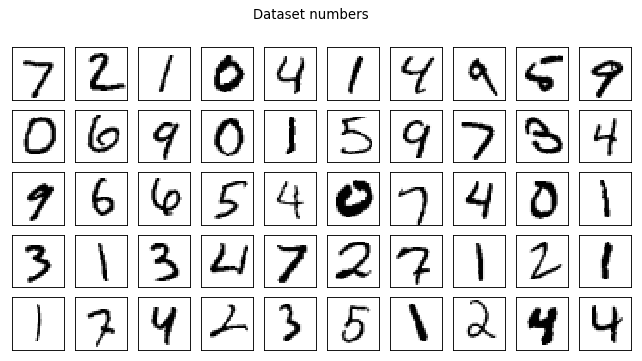

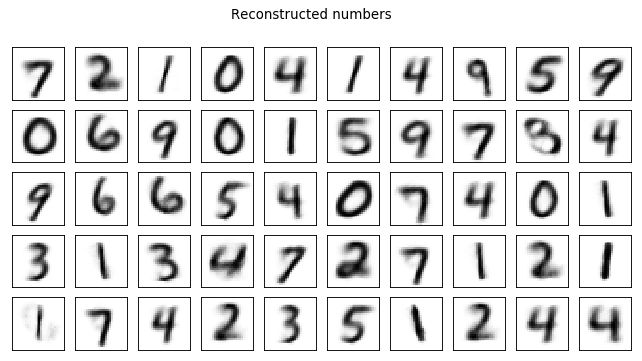

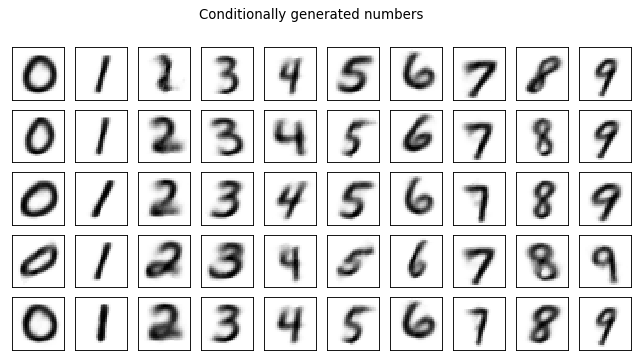

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 7 [0/50000 (0%)]	Losses E: 0.6751, AE: 0.1448, D: 0.6933
Train Epoch: 7 [25000/50000 (50%)]	Losses E: 0.6730, AE: 0.1352, D: 0.6947
Train Epoch: 7 [50000/50000 (100%)]	Losses E: 0.6780, AE: 0.1429, D: 0.6914


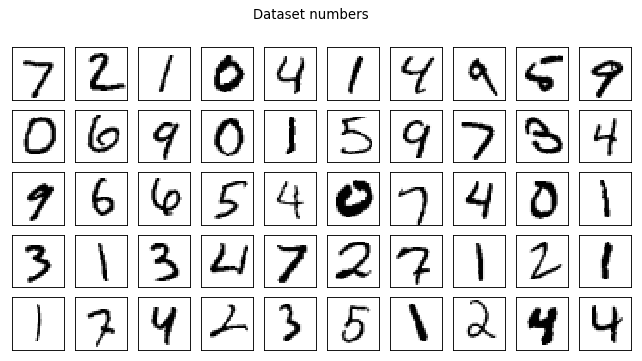

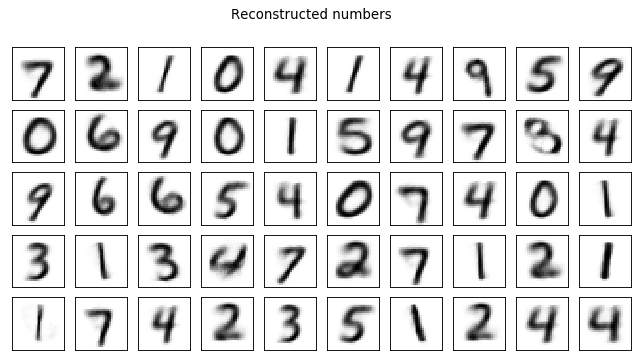

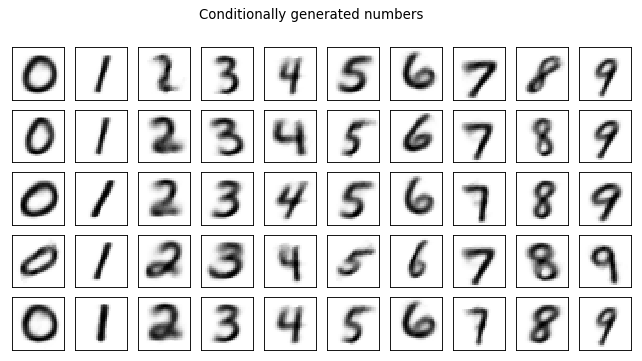

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 8 [0/50000 (0%)]	Losses E: 0.6806, AE: 0.1386, D: 0.6918
Train Epoch: 8 [25000/50000 (50%)]	Losses E: 0.6699, AE: 0.1573, D: 0.6944
Train Epoch: 8 [50000/50000 (100%)]	Losses E: 0.6737, AE: 0.1387, D: 0.6923


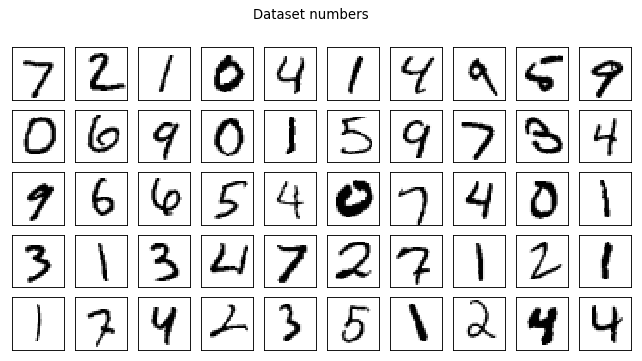

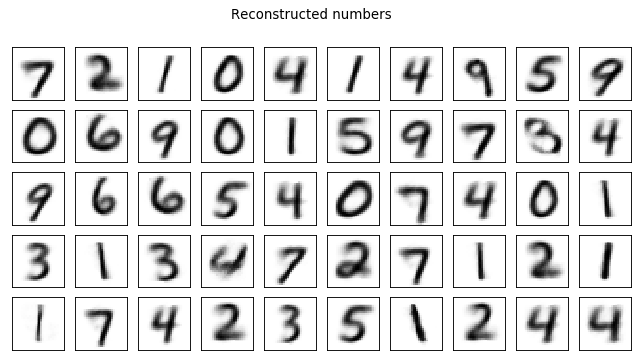

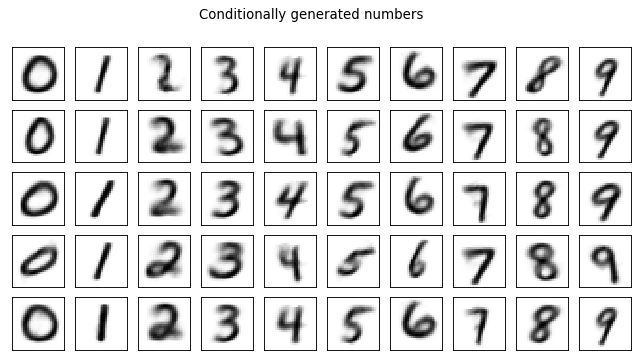

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 9 [0/50000 (0%)]	Losses E: 0.6746, AE: 0.1456, D: 0.6927
Train Epoch: 9 [25000/50000 (50%)]	Losses E: 0.6751, AE: 0.1400, D: 0.6914
Train Epoch: 9 [50000/50000 (100%)]	Losses E: 0.6786, AE: 0.1343, D: 0.6942


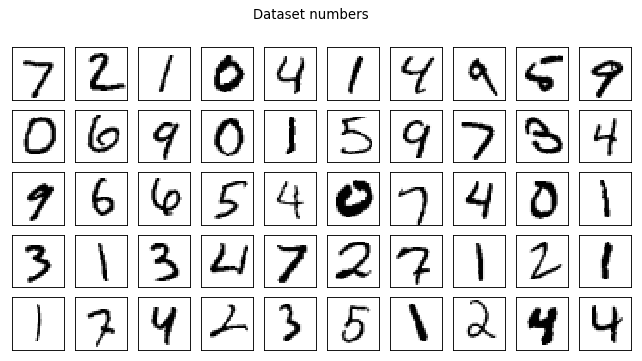

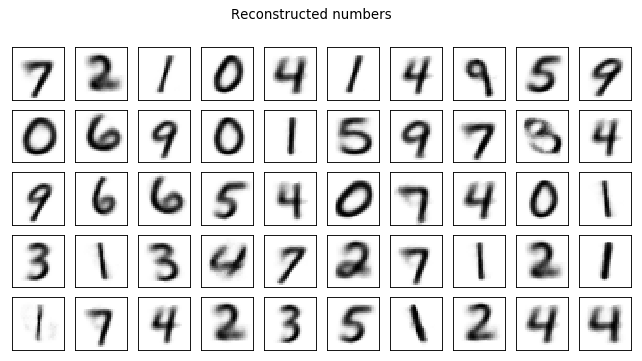

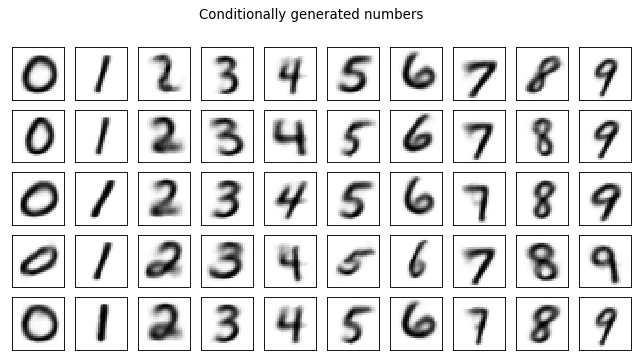

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 10 [0/50000 (0%)]	Losses E: 0.6802, AE: 0.1226, D: 0.6930
Train Epoch: 10 [25000/50000 (50%)]	Losses E: 0.6795, AE: 0.1416, D: 0.6914
Train Epoch: 10 [50000/50000 (100%)]	Losses E: 0.6784, AE: 0.1146, D: 0.6942


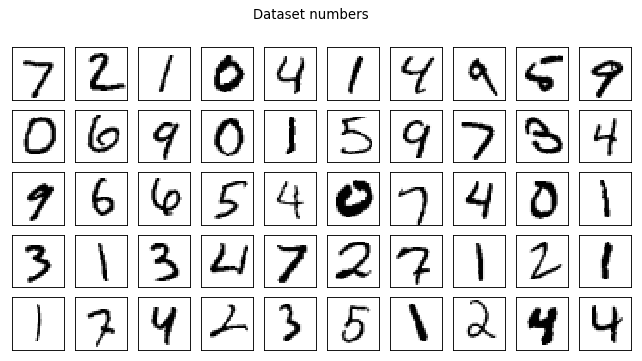

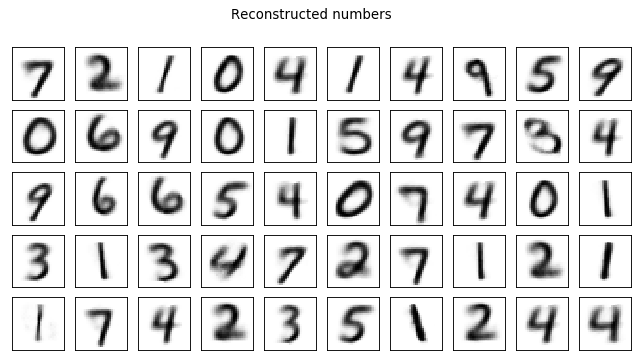

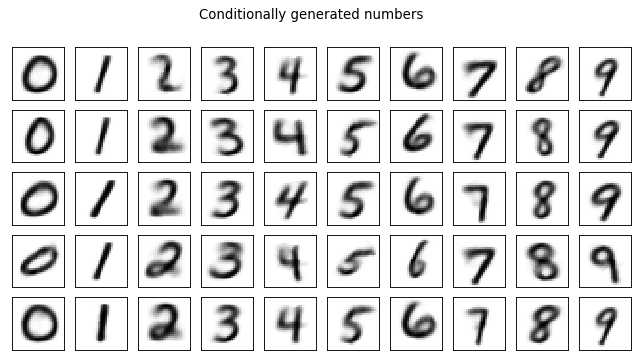

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 11 [0/50000 (0%)]	Losses E: 0.6808, AE: 0.1272, D: 0.6924
Train Epoch: 11 [25000/50000 (50%)]	Losses E: 0.6755, AE: 0.1403, D: 0.6936
Train Epoch: 11 [50000/50000 (100%)]	Losses E: 0.6769, AE: 0.1349, D: 0.6907


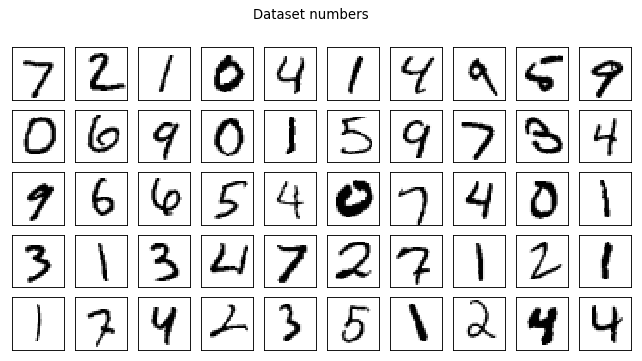

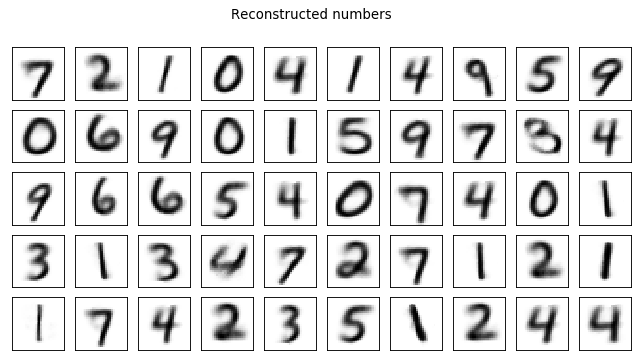

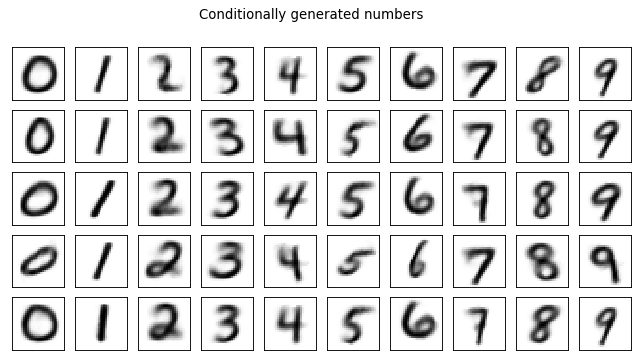

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 12 [0/50000 (0%)]	Losses E: 0.6694, AE: 0.1323, D: 0.6954
Train Epoch: 12 [25000/50000 (50%)]	Losses E: 0.6796, AE: 0.1490, D: 0.6933
Train Epoch: 12 [50000/50000 (100%)]	Losses E: 0.6833, AE: 0.1354, D: 0.6936


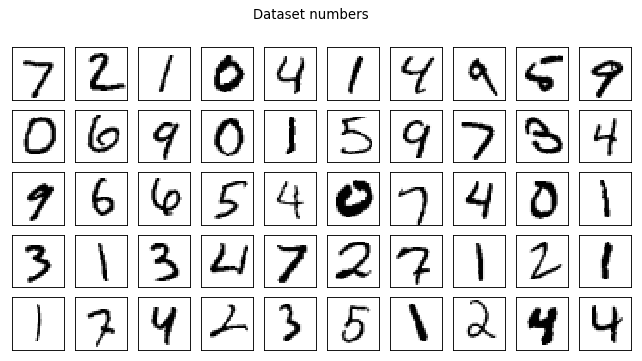

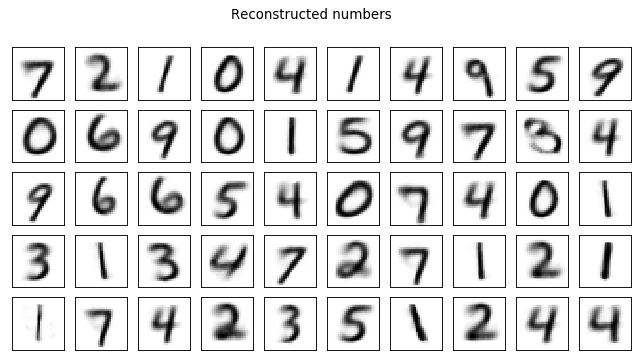

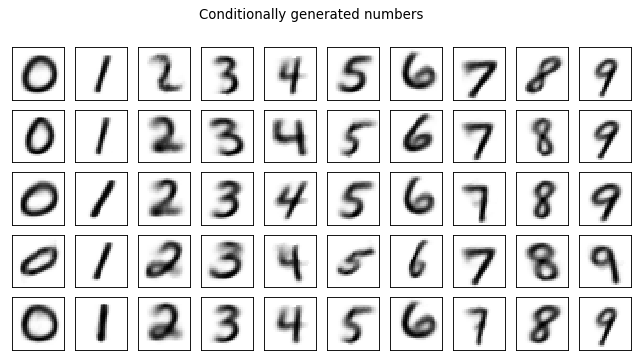

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 13 [0/50000 (0%)]	Losses E: 0.6858, AE: 0.1369, D: 0.6931
Train Epoch: 13 [25000/50000 (50%)]	Losses E: 0.6809, AE: 0.1438, D: 0.6929
Train Epoch: 13 [50000/50000 (100%)]	Losses E: 0.6788, AE: 0.1258, D: 0.6939


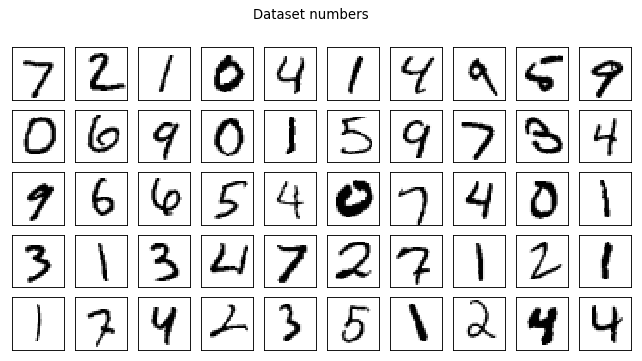

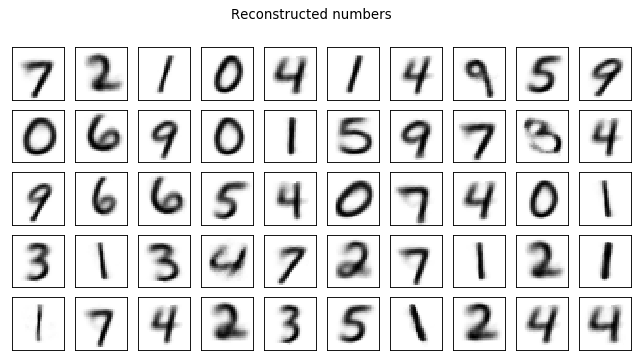

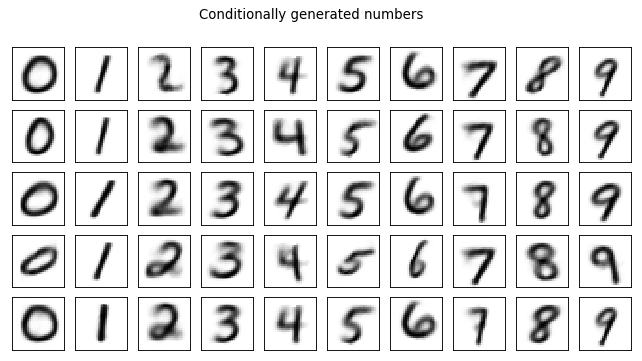

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 14 [0/50000 (0%)]	Losses E: 0.6774, AE: 0.1428, D: 0.6942
Train Epoch: 14 [25000/50000 (50%)]	Losses E: 0.6787, AE: 0.1154, D: 0.6935
Train Epoch: 14 [50000/50000 (100%)]	Losses E: 0.6830, AE: 0.1491, D: 0.6927


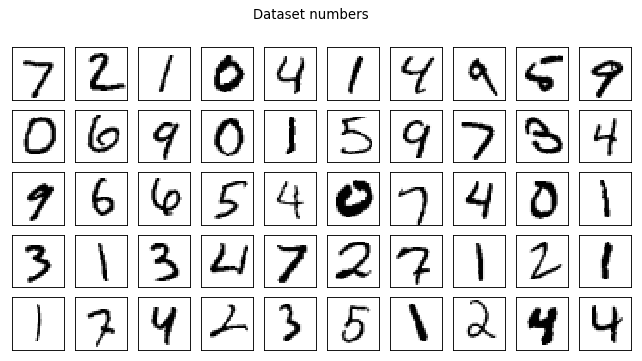

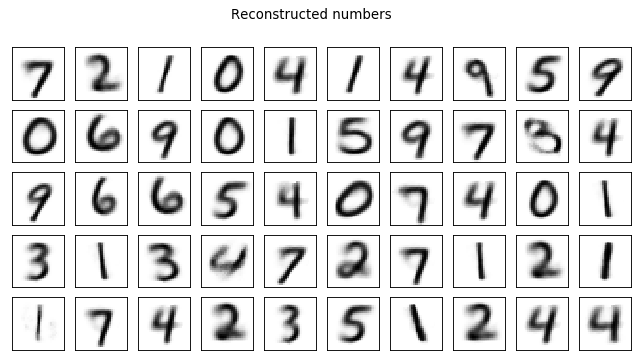

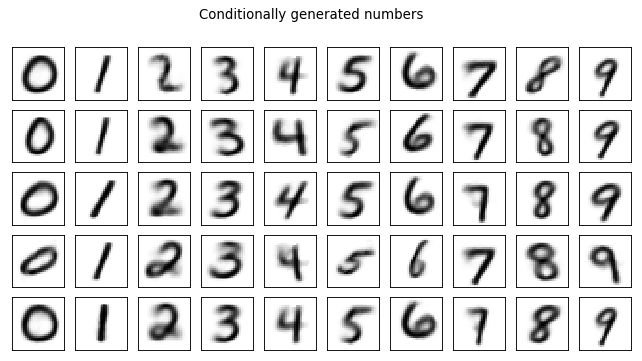

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 15 [0/50000 (0%)]	Losses E: 0.6849, AE: 0.1316, D: 0.6917
Train Epoch: 15 [25000/50000 (50%)]	Losses E: 0.6777, AE: 0.1415, D: 0.6955
Train Epoch: 15 [50000/50000 (100%)]	Losses E: 0.6796, AE: 0.1373, D: 0.6921


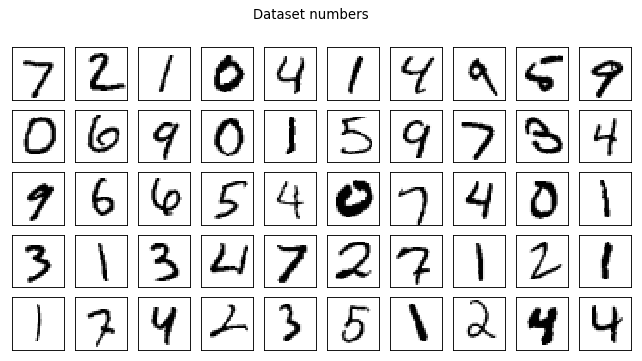

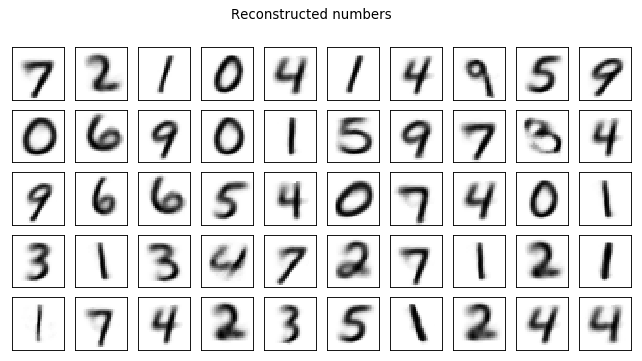

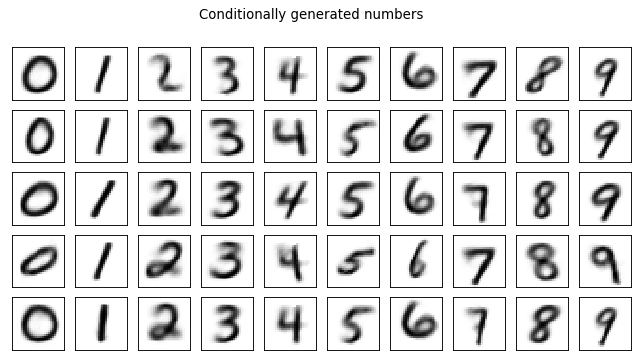

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 16 [0/50000 (0%)]	Losses E: 0.6787, AE: 0.1363, D: 0.6926
Train Epoch: 16 [25000/50000 (50%)]	Losses E: 0.6832, AE: 0.1256, D: 0.6916
Train Epoch: 16 [50000/50000 (100%)]	Losses E: 0.6790, AE: 0.1234, D: 0.6919


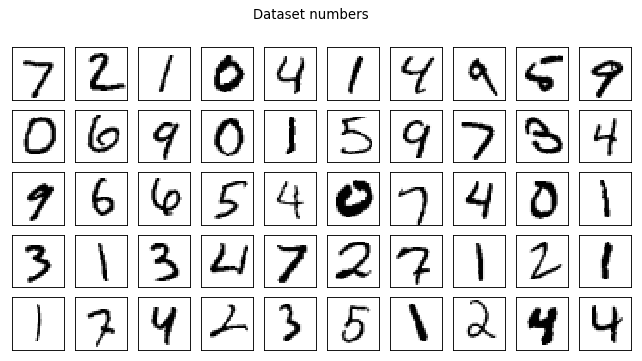

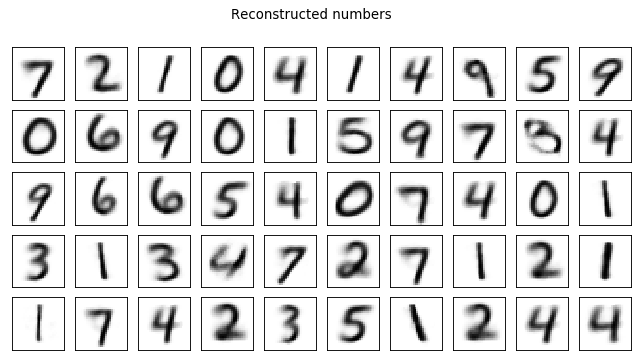

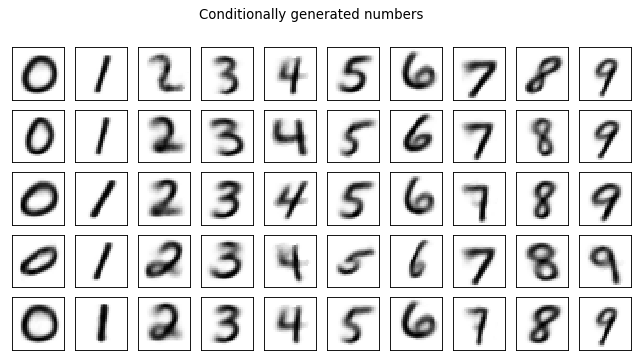

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 17 [0/50000 (0%)]	Losses E: 0.6791, AE: 0.1185, D: 0.6917
Train Epoch: 17 [25000/50000 (50%)]	Losses E: 0.6822, AE: 0.1177, D: 0.6947
Train Epoch: 17 [50000/50000 (100%)]	Losses E: 0.6823, AE: 0.1426, D: 0.6920


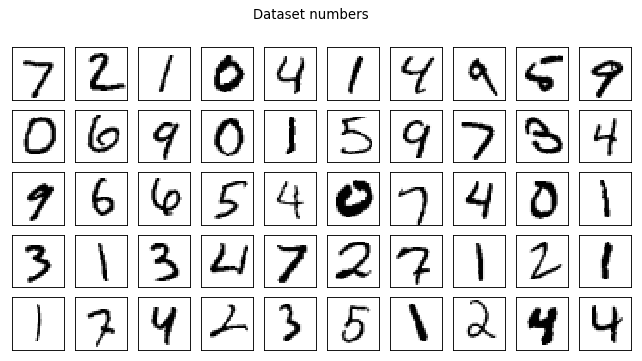

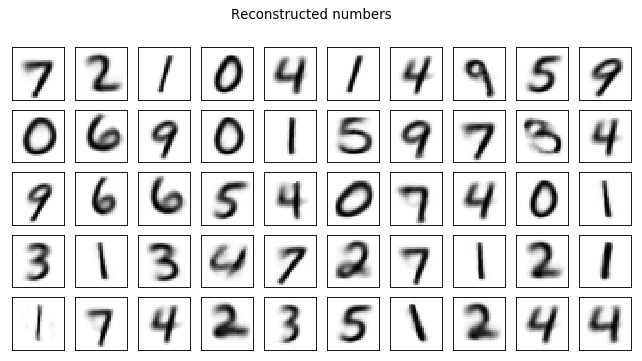

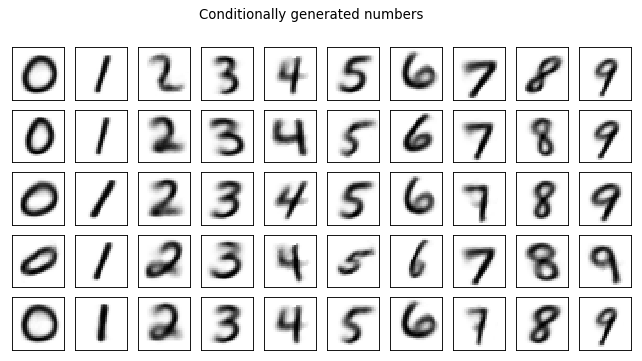

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 18 [0/50000 (0%)]	Losses E: 0.6845, AE: 0.1128, D: 0.6902
Train Epoch: 18 [25000/50000 (50%)]	Losses E: 0.6774, AE: 0.1411, D: 0.6959
Train Epoch: 18 [50000/50000 (100%)]	Losses E: 0.6768, AE: 0.1305, D: 0.6910


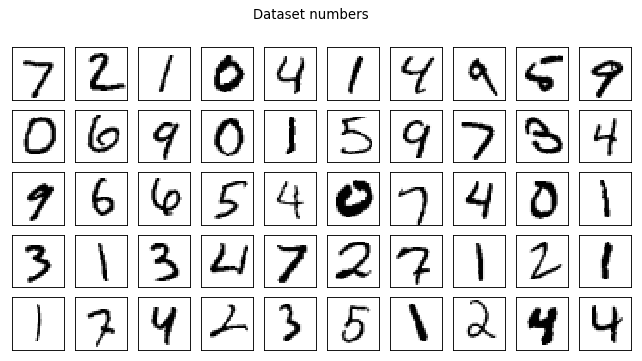

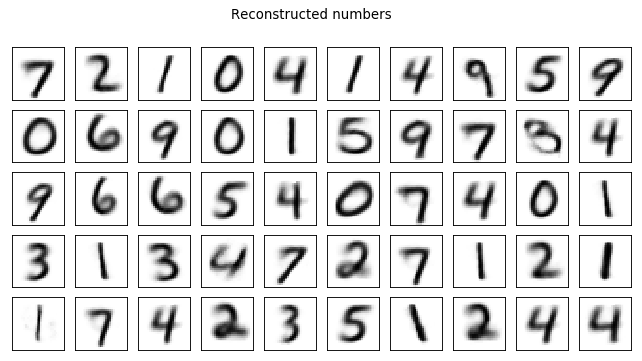

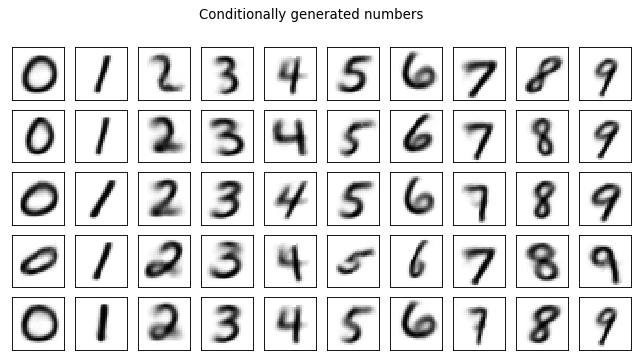

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 19 [0/50000 (0%)]	Losses E: 0.6746, AE: 0.1390, D: 0.6954
Train Epoch: 19 [25000/50000 (50%)]	Losses E: 0.6834, AE: 0.1505, D: 0.6935
Train Epoch: 19 [50000/50000 (100%)]	Losses E: 0.6665, AE: 0.1183, D: 0.6910


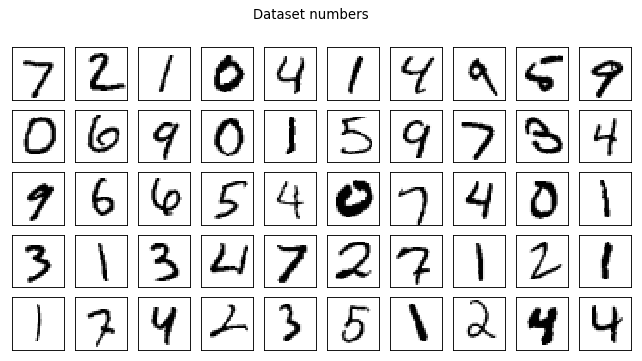

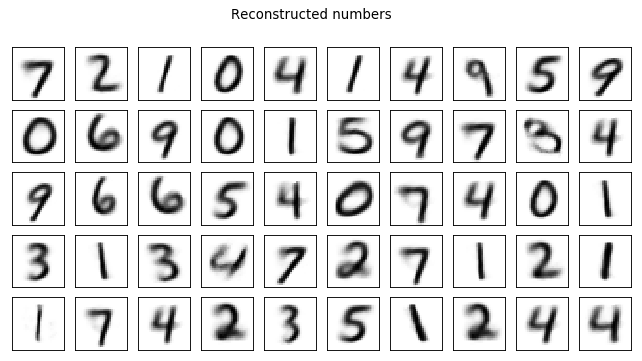

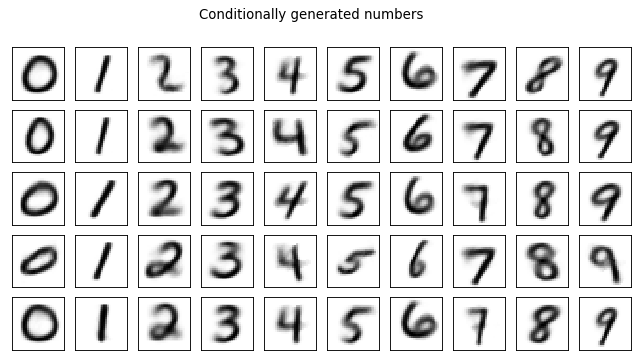

Test losses. E: 0.0033, AE: 0.0006, D: 0.0035
Train Epoch: 20 [0/50000 (0%)]	Losses E: 0.6618, AE: 0.1451, D: 0.6958
Train Epoch: 20 [25000/50000 (50%)]	Losses E: 0.6800, AE: 0.1474, D: 0.6943
Train Epoch: 20 [50000/50000 (100%)]	Losses E: 0.6841, AE: 0.1344, D: 0.6932


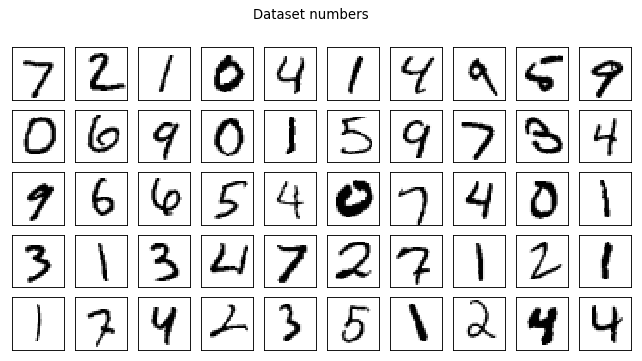

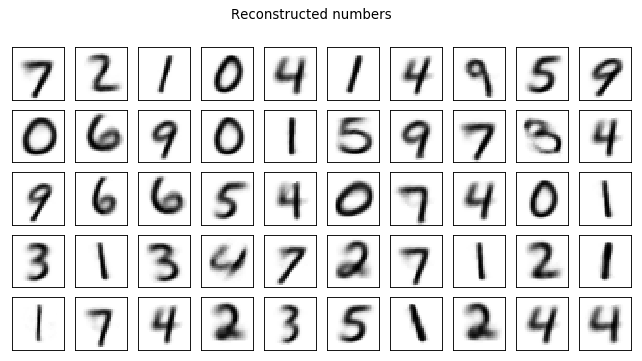

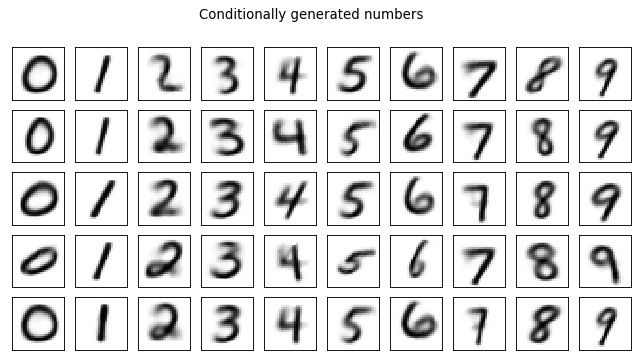

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 21 [0/50000 (0%)]	Losses E: 0.6839, AE: 0.1284, D: 0.6920
Train Epoch: 21 [25000/50000 (50%)]	Losses E: 0.6864, AE: 0.1370, D: 0.6910
Train Epoch: 21 [50000/50000 (100%)]	Losses E: 0.6835, AE: 0.1301, D: 0.6926


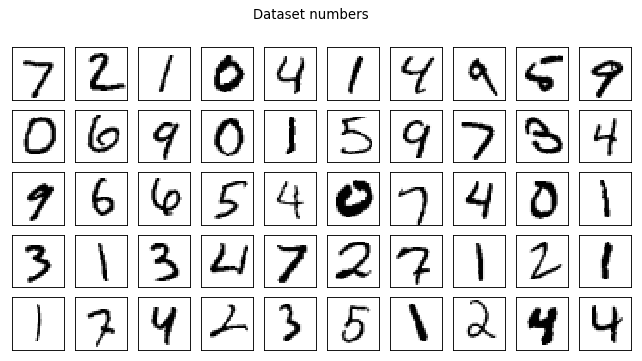

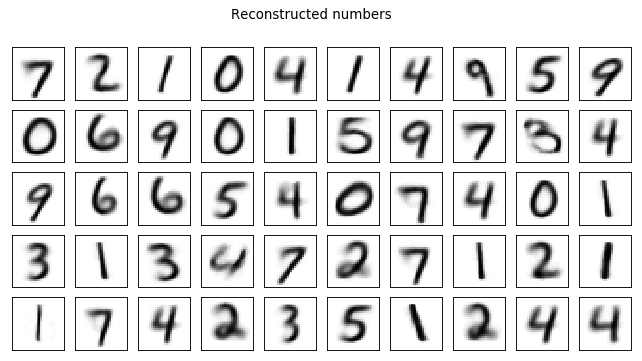

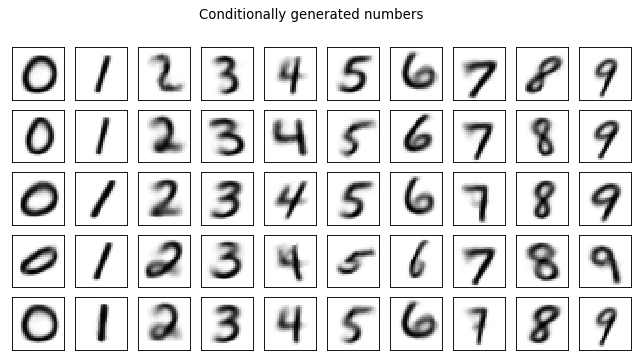

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 22 [0/50000 (0%)]	Losses E: 0.6821, AE: 0.1460, D: 0.6922
Train Epoch: 22 [25000/50000 (50%)]	Losses E: 0.6816, AE: 0.1329, D: 0.6921
Train Epoch: 22 [50000/50000 (100%)]	Losses E: 0.6837, AE: 0.1245, D: 0.6931


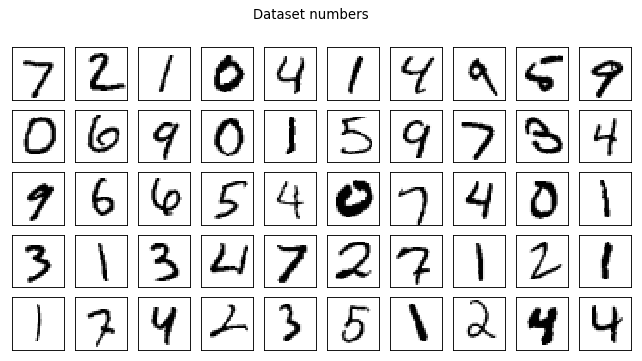

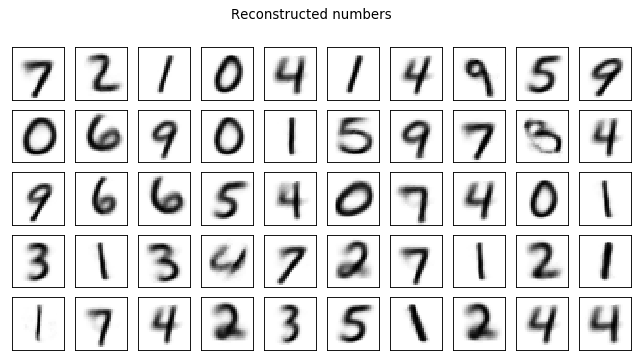

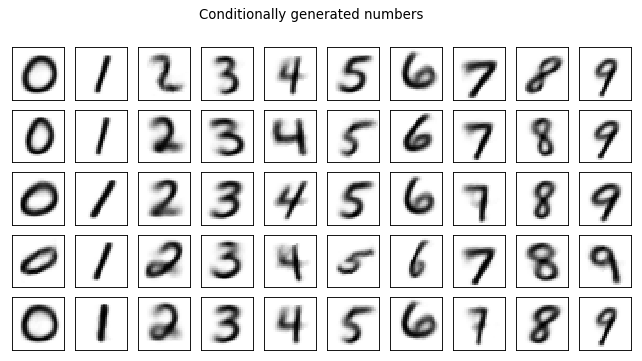

Test losses. E: 0.0034, AE: 0.0008, D: 0.0035
Train Epoch: 23 [0/50000 (0%)]	Losses E: 0.6843, AE: 0.1378, D: 0.6928
Train Epoch: 23 [25000/50000 (50%)]	Losses E: 0.6803, AE: 0.1258, D: 0.6911
Train Epoch: 23 [50000/50000 (100%)]	Losses E: 0.6826, AE: 0.1234, D: 0.6915


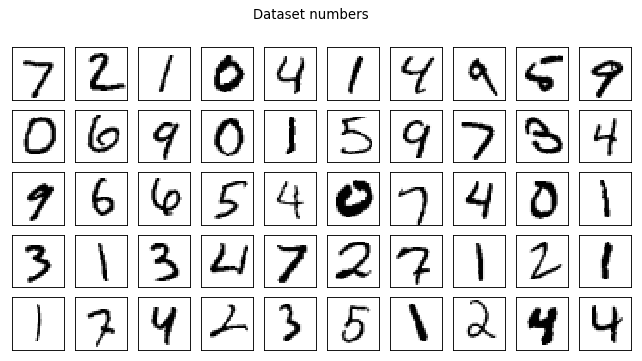

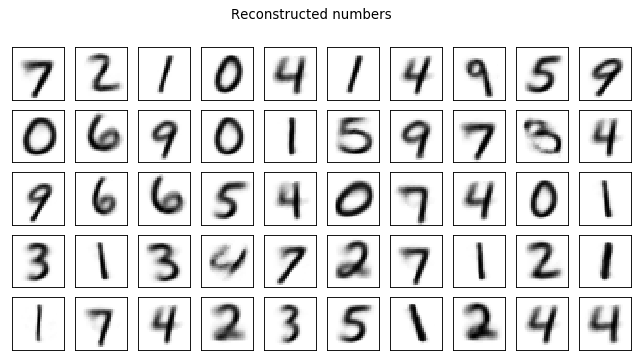

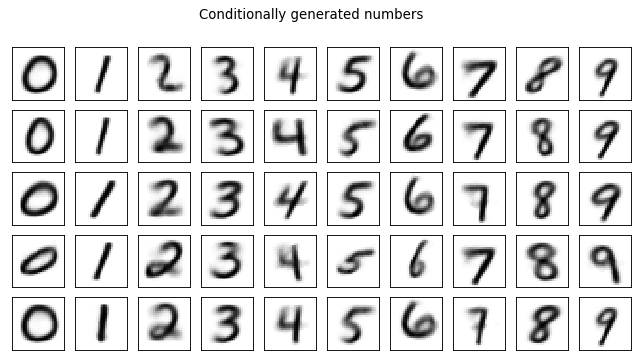

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 24 [0/50000 (0%)]	Losses E: 0.6828, AE: 0.1389, D: 0.6925
Train Epoch: 24 [25000/50000 (50%)]	Losses E: 0.6832, AE: 0.1433, D: 0.6927
Train Epoch: 24 [50000/50000 (100%)]	Losses E: 0.6800, AE: 0.1327, D: 0.6923


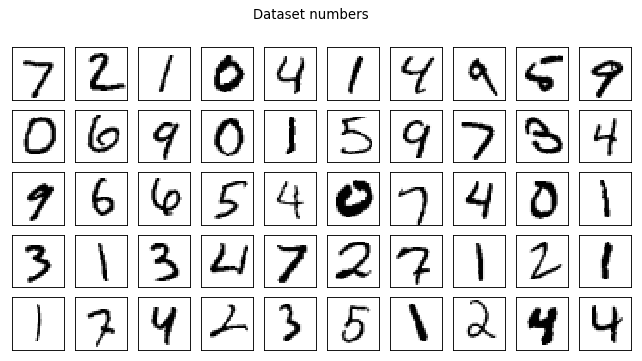

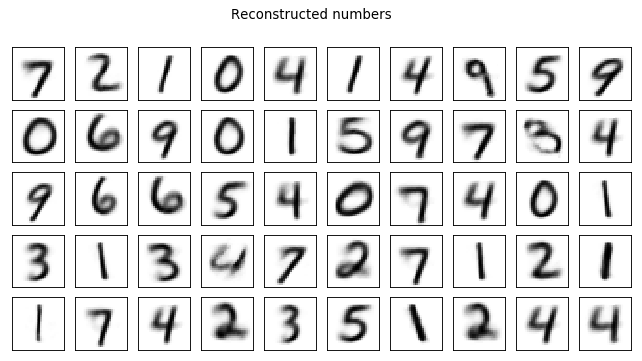

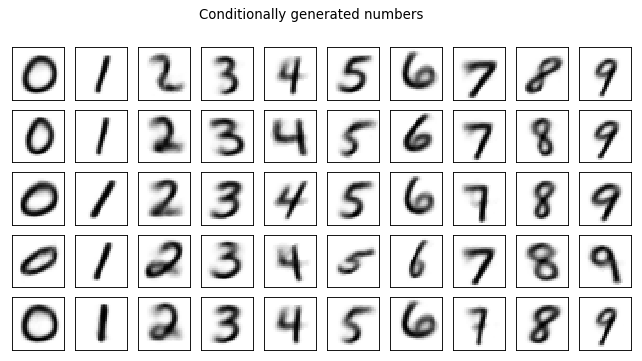

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 25 [0/50000 (0%)]	Losses E: 0.6773, AE: 0.1340, D: 0.6936
Train Epoch: 25 [25000/50000 (50%)]	Losses E: 0.6788, AE: 0.1371, D: 0.6940
Train Epoch: 25 [50000/50000 (100%)]	Losses E: 0.6803, AE: 0.1407, D: 0.6926


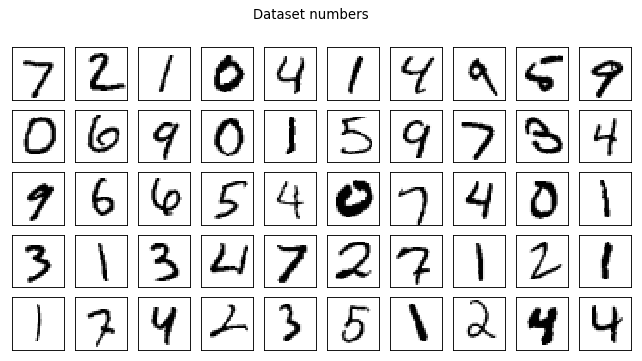

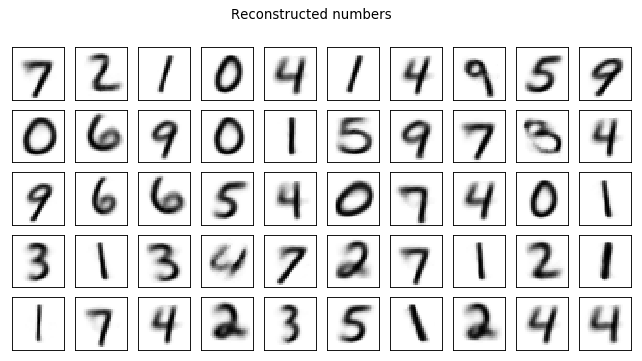

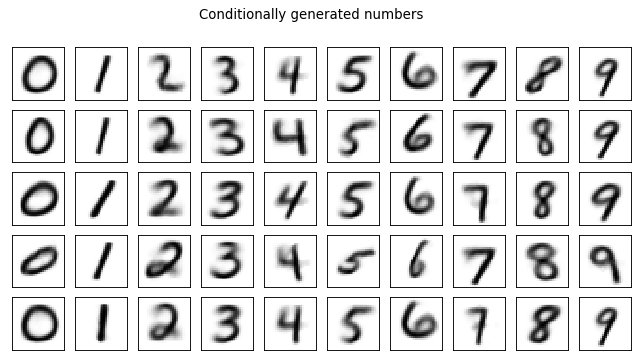

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 26 [0/50000 (0%)]	Losses E: 0.6835, AE: 0.1075, D: 0.6906
Train Epoch: 26 [25000/50000 (50%)]	Losses E: 0.6777, AE: 0.1385, D: 0.6931
Train Epoch: 26 [50000/50000 (100%)]	Losses E: 0.6799, AE: 0.1234, D: 0.6930


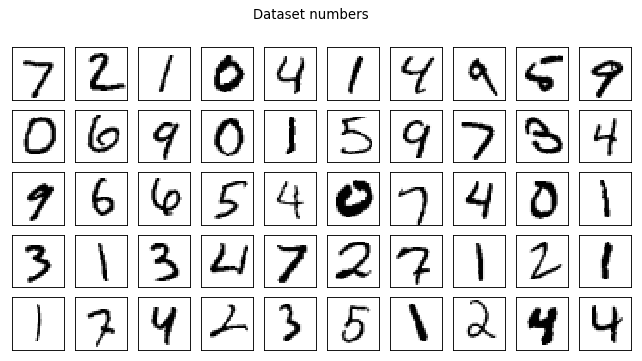

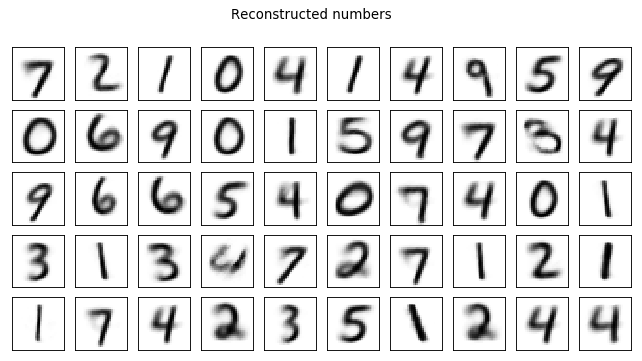

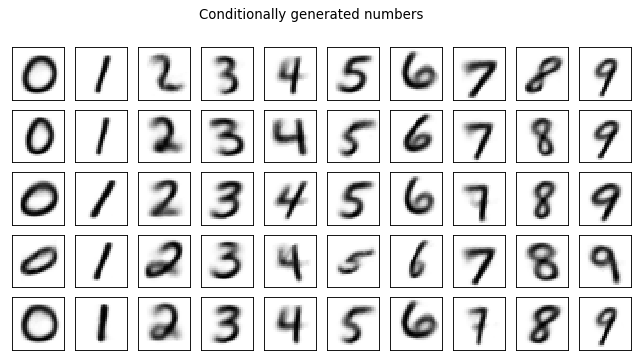

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 27 [0/50000 (0%)]	Losses E: 0.6794, AE: 0.1319, D: 0.6935
Train Epoch: 27 [25000/50000 (50%)]	Losses E: 0.6817, AE: 0.1373, D: 0.6924
Train Epoch: 27 [50000/50000 (100%)]	Losses E: 0.6855, AE: 0.1197, D: 0.6910


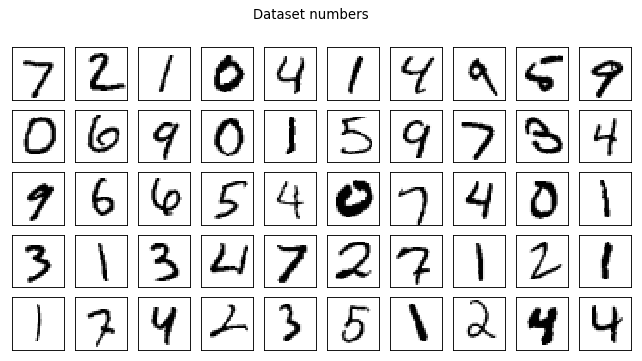

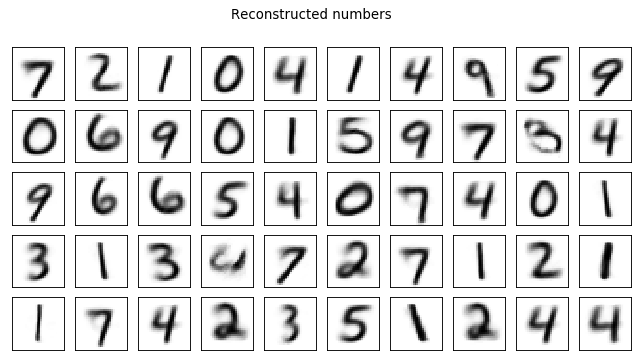

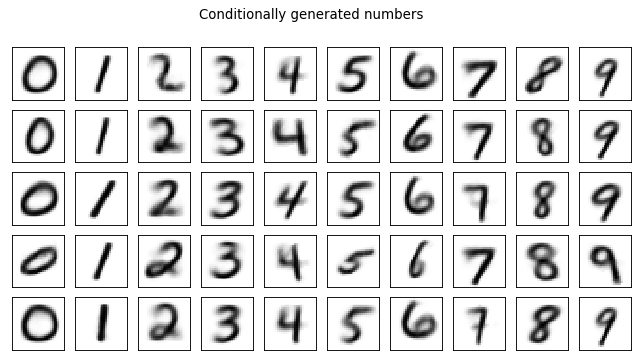

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 28 [0/50000 (0%)]	Losses E: 0.6842, AE: 0.1228, D: 0.6923
Train Epoch: 28 [25000/50000 (50%)]	Losses E: 0.6829, AE: 0.1354, D: 0.6937
Train Epoch: 28 [50000/50000 (100%)]	Losses E: 0.6772, AE: 0.1155, D: 0.6955


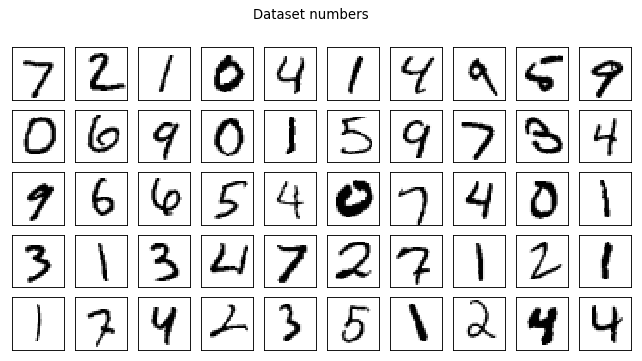

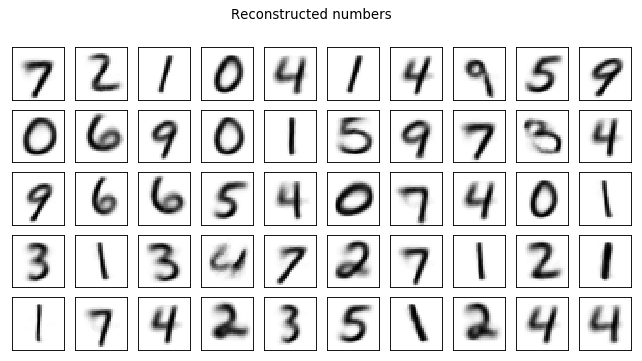

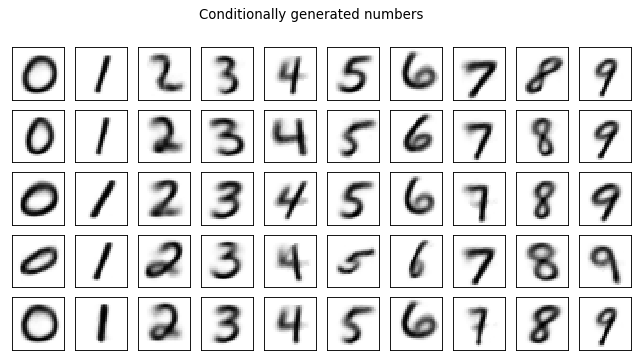

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 29 [0/50000 (0%)]	Losses E: 0.6805, AE: 0.1298, D: 0.6935
Train Epoch: 29 [25000/50000 (50%)]	Losses E: 0.6827, AE: 0.1257, D: 0.6929
Train Epoch: 29 [50000/50000 (100%)]	Losses E: 0.6777, AE: 0.1289, D: 0.6925


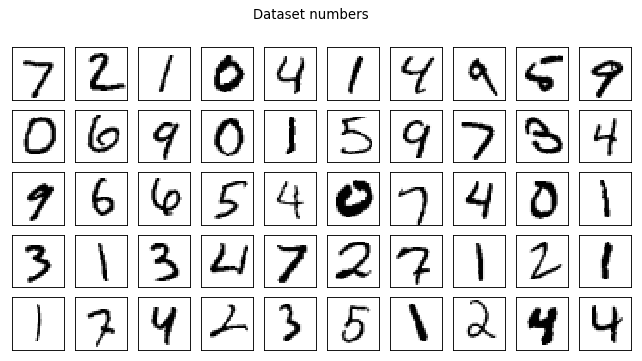

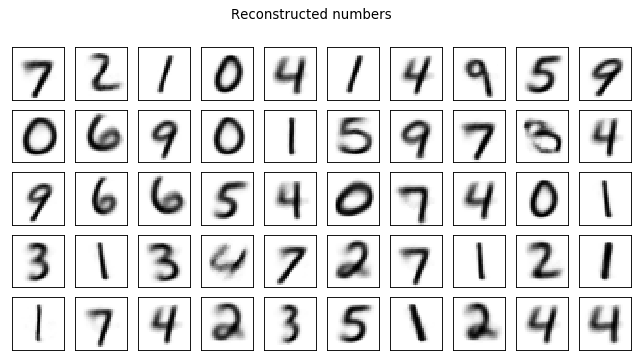

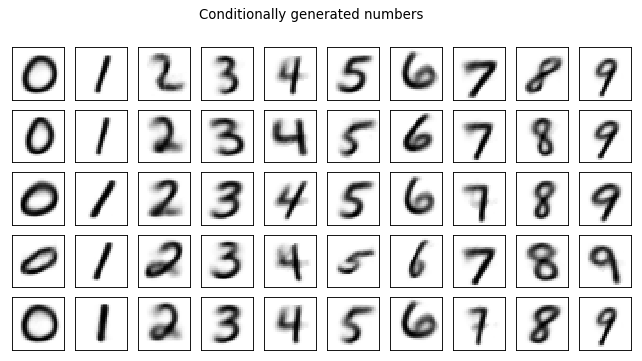

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 30 [0/50000 (0%)]	Losses E: 0.6794, AE: 0.1137, D: 0.6932
Train Epoch: 30 [25000/50000 (50%)]	Losses E: 0.6829, AE: 0.1207, D: 0.6935
Train Epoch: 30 [50000/50000 (100%)]	Losses E: 0.6852, AE: 0.1191, D: 0.6943


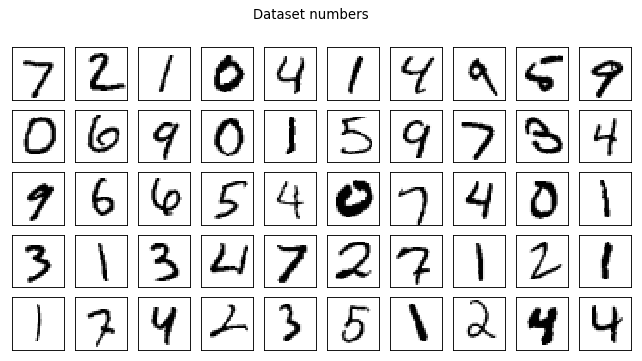

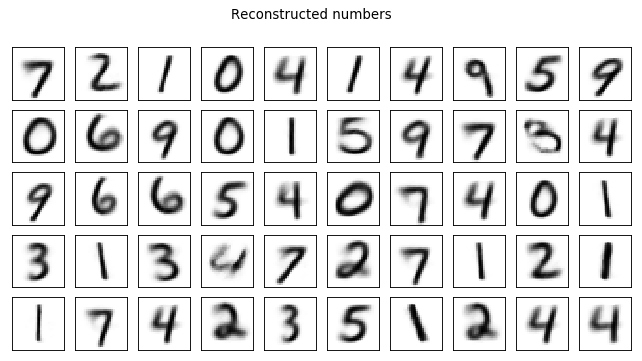

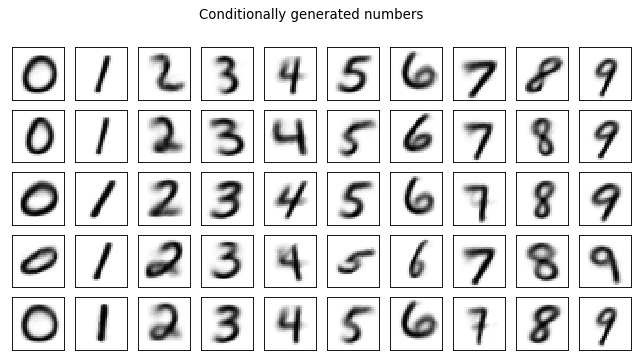

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035


In [10]:
with torch.cuda.device(0):
    for epoch in range(1, 31):
        enc.train()
        dec.train()
        disc.train()
        train(epoch, enc, dec, disc, train_log)
        enc.eval()
        dec.eval()
        disc.eval()
        test(enc, dec, disc, valid_loader, epoch, test_log)

### "Unfair" CAAE

In [19]:
# discriminator

class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        self.linear1 = nn.Linear(z_dim, 256)
        self.linear2 = nn.Linear(256, 512)
        self.linear3 = nn.Linear(512, 1)
        
    def forward(self, x):
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = F.sigmoid(self.linear3(x))
        
        return x

In [20]:
# constructing the model

with torch.cuda.device(0):
    enc_unf, dec_unf, disc_unf = Encoder(), Decoder(), Discriminator()      
    
    enc_opt = optim.Adam(enc_unf.parameters(), lr=lr)
    dec_opt = optim.Adam(dec_unf.parameters(), lr=lr)
    disc_opt = optim.Adam(disc_unf.parameters(), lr=lr)
    
    train_log = {'E_unf': [], 'AE_unf': [], 'D_unf': []}
    test_log = {'E_unf': [], 'AE_unf': [], 'D_unf': []}

In [21]:
def train(epoch, enc, dec, disc, log=None):
    with torch.cuda.device(0):
        train_size = len(train_loader.sampler)
        for batch_idx, (data, labels) in enumerate(train_loader):
            
            enc.zero_grad()
            disc.zero_grad()
            
            # pre-processing the data
            data = data.view(-1, 28 * 28)
            y_oh = torch.eye(num_classes)[labels]
            
            z_labels = to_onehot(np.random.randint(0, num_classes, (batch_size)), num_classes)
            
            # training the discriminator
            true_pred = disc(torch.randn(batch_size, z_dim))
            fake_pred = disc(enc(data))
            
            fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
            true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
            disc_loss = 0.5 * (fake_loss + true_loss)
            
            disc_loss.backward()
            disc_opt.step()
            
            ################
            enc.zero_grad()
            dec.zero_grad()
            disc.zero_grad()
            
            # training the autoencoder         
            encoded = enc(data)
            decoded = dec(encoded, y_oh)
            
            fake_pred = disc(encoded)
            
            enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
            ae_loss = F.mse_loss(decoded, data)
            loss = ae_loss + enc_loss
            loss.backward()
            enc_opt.step()
            dec_opt.step()
            
            if batch_idx % 500 == 0:
                line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                    epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
                losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss.item(), ae_loss.item(), disc_loss.item())
                print(line + losses)
            
        else:
            batch_idx += 1
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss.item(), ae_loss.item(), disc_loss.item())
            print(line + losses)
            log['E_unf'].append(enc_loss.item())
            log['AE_unf'].append(ae_loss.item())
            log['D_unf'].append(disc_loss.item())

In [22]:
def test(enc, dec, disc, loader, epoch, log=None):
    with torch.cuda.device(0):
        test_size = len(loader)
        with torch.no_grad():
            for data, labels in loader:
                data = data.view(-1, 28 * 28)
                y_oh = torch.eye(num_classes)[labels]
                z_labels = to_onehot(np.random.randint(0, num_classes, (batch_size)), num_classes)
                
                encoded = enc(data)
                decoded = dec(encoded, y_oh)

                true_pred = disc(torch.randn(batch_size, z_dim))
                fake_pred = disc(encoded)

                fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros).item()
                true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones).item()
                disc_loss = 0.5 * (fake_loss + true_loss)
                
                enc_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_ones).item()
                ae_loss = F.mse_loss(decoded, data).item()     
                
            disc_loss /= test_size
            enc_loss /= test_size
            ae_loss /= test_size
        
        with torch.no_grad():
            ae_data = dec(enc(fixed_data), fixed_labels).data.numpy()
            fixed_gen = dec(fixed_z, fixed_z_labels).data.numpy()
            plot_mnist(fixed_data.reshape(-1, 1, 28, 28), (5, num_classes), 'Dataset numbers')
            plot_mnist(ae_data.reshape(-1, 1, 28, 28), (5, num_classes), 'Reconstructed numbers')
            plot_mnist(fixed_gen.reshape(-1, 1, 28, 28), (5, num_classes), 'Conditionally generated numbers')
                
    report = 'Test losses. E: {:.4f}, AE: {:.4f}, D: {:.4f}'.format(enc_loss, ae_loss, disc_loss)
    print(report)

Train Epoch: 1 [0/50000 (0%)]	Losses E: 0.4849, AE: 0.9291, D: 0.7269
Train Epoch: 1 [25000/50000 (50%)]	Losses E: 0.6885, AE: 0.2106, D: 0.6943
Train Epoch: 1 [50000/50000 (100%)]	Losses E: 0.6922, AE: 0.1611, D: 0.6933


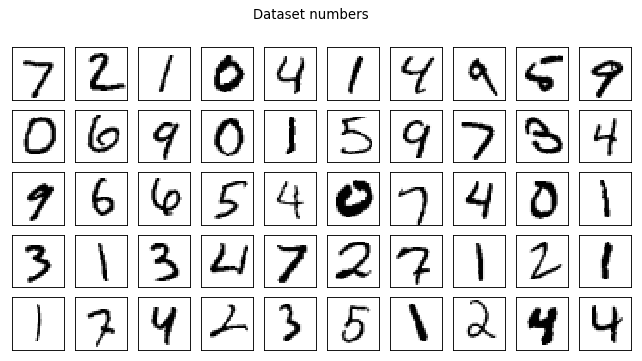

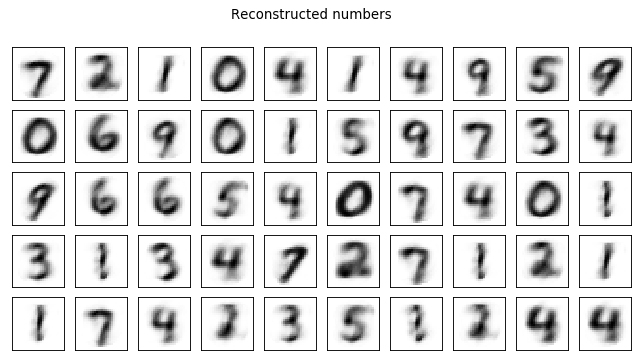

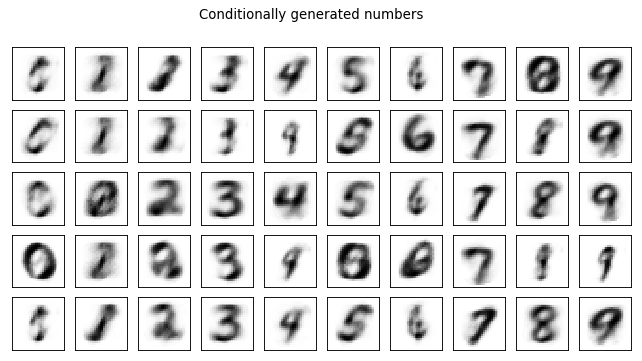

Test losses. E: 0.0035, AE: 0.0009, D: 0.0035
Train Epoch: 2 [0/50000 (0%)]	Losses E: 0.6923, AE: 0.1595, D: 0.6932
Train Epoch: 2 [25000/50000 (50%)]	Losses E: 0.6924, AE: 0.1657, D: 0.6932
Train Epoch: 2 [50000/50000 (100%)]	Losses E: 0.6924, AE: 0.1481, D: 0.6929


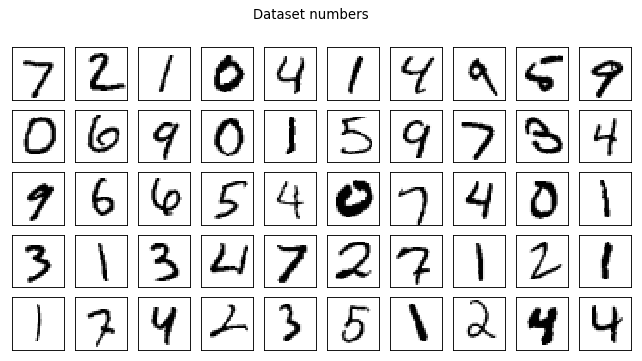

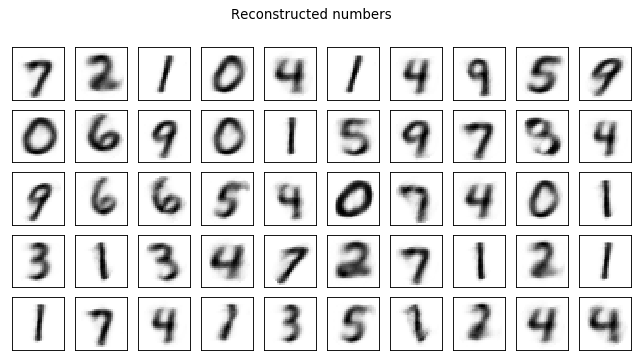

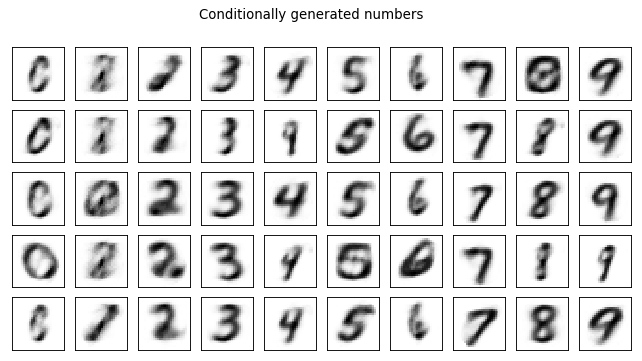

Test losses. E: 0.0035, AE: 0.0008, D: 0.0035
Train Epoch: 3 [0/50000 (0%)]	Losses E: 0.6922, AE: 0.1584, D: 0.6931
Train Epoch: 3 [25000/50000 (50%)]	Losses E: 0.6893, AE: 0.1382, D: 0.6931
Train Epoch: 3 [50000/50000 (100%)]	Losses E: 0.6781, AE: 0.1405, D: 0.6943


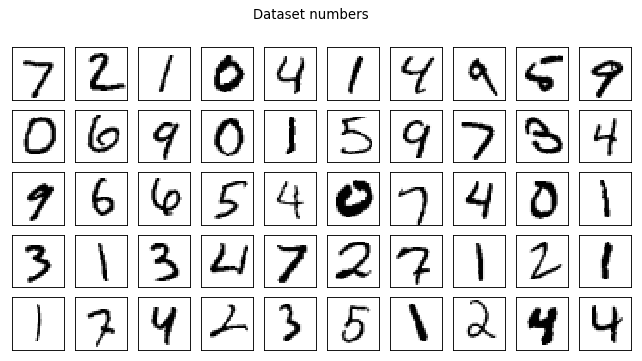

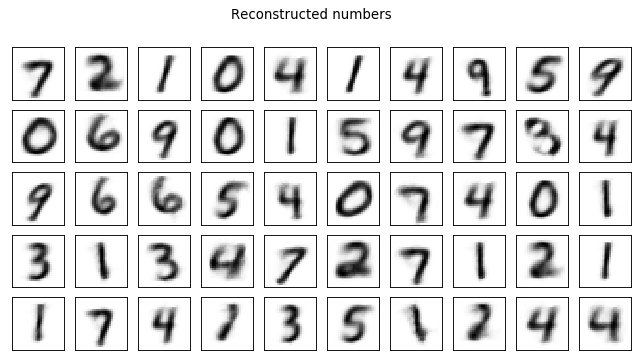

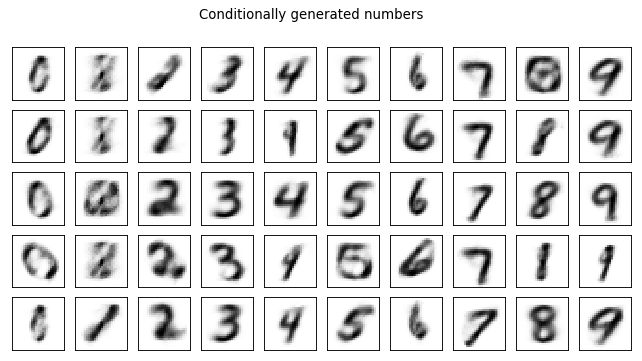

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 4 [0/50000 (0%)]	Losses E: 0.6791, AE: 0.1512, D: 0.6932
Train Epoch: 4 [25000/50000 (50%)]	Losses E: 0.6876, AE: 0.1477, D: 0.6932
Train Epoch: 4 [50000/50000 (100%)]	Losses E: 0.6886, AE: 0.1588, D: 0.6932


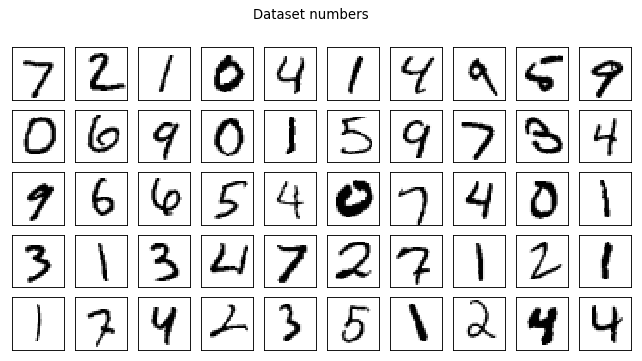

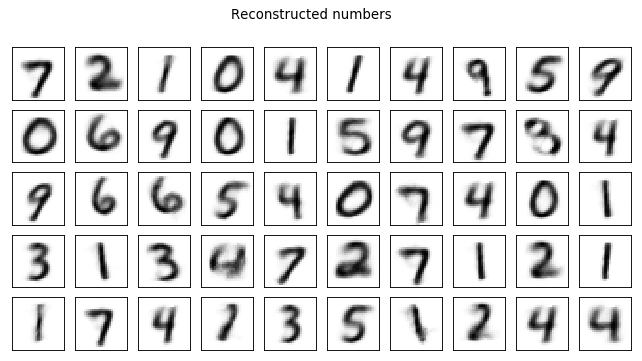

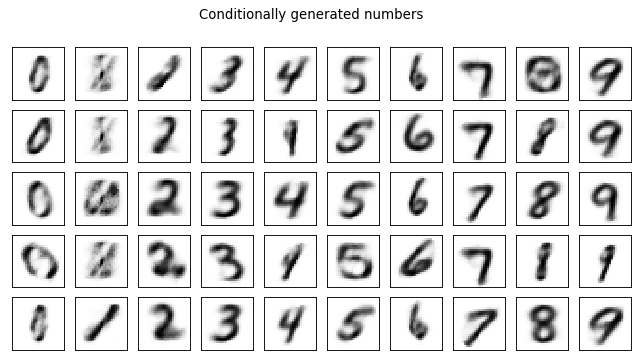

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 5 [0/50000 (0%)]	Losses E: 0.6885, AE: 0.1537, D: 0.6935
Train Epoch: 5 [25000/50000 (50%)]	Losses E: 0.6880, AE: 0.1377, D: 0.6931
Train Epoch: 5 [50000/50000 (100%)]	Losses E: 0.6884, AE: 0.1338, D: 0.6931


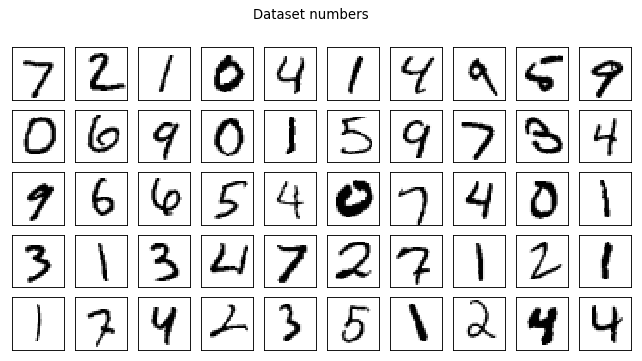

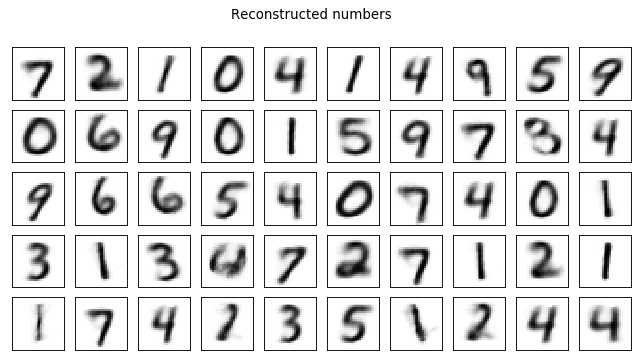

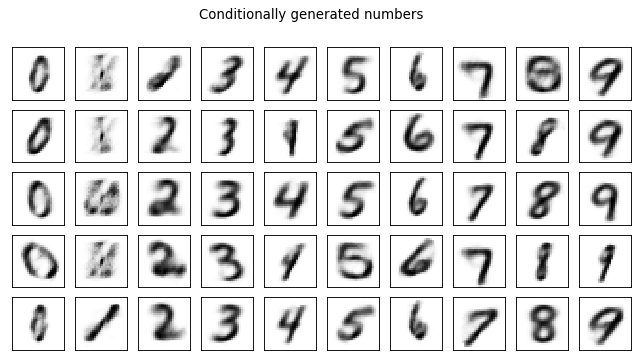

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 6 [0/50000 (0%)]	Losses E: 0.6883, AE: 0.1460, D: 0.6932
Train Epoch: 6 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1304, D: 0.6930
Train Epoch: 6 [50000/50000 (100%)]	Losses E: 0.6893, AE: 0.1341, D: 0.6933


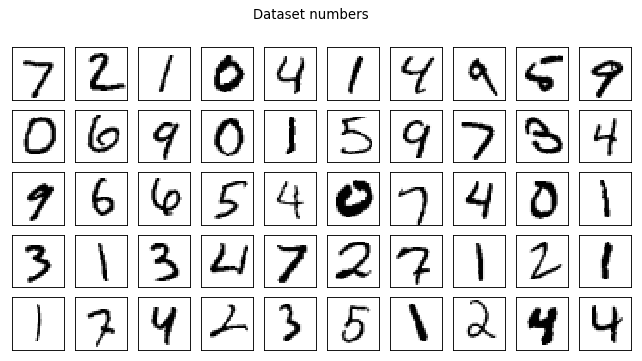

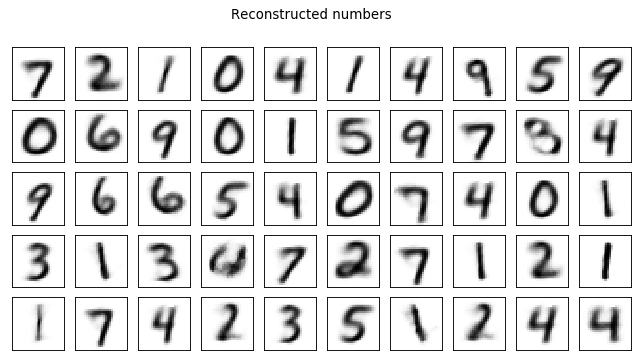

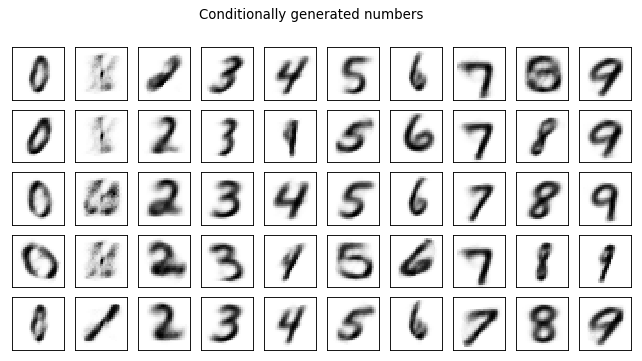

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 7 [0/50000 (0%)]	Losses E: 0.6897, AE: 0.1297, D: 0.6929
Train Epoch: 7 [25000/50000 (50%)]	Losses E: 0.6894, AE: 0.1412, D: 0.6931
Train Epoch: 7 [50000/50000 (100%)]	Losses E: 0.6888, AE: 0.1183, D: 0.6932


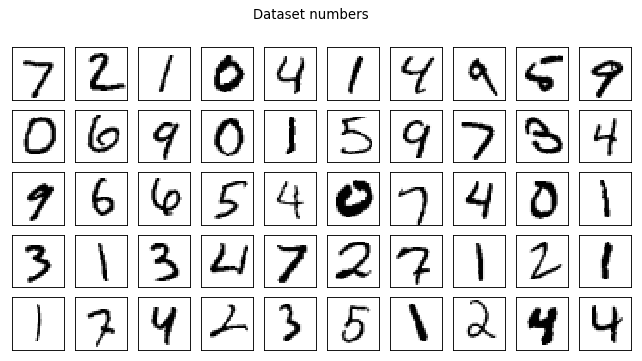

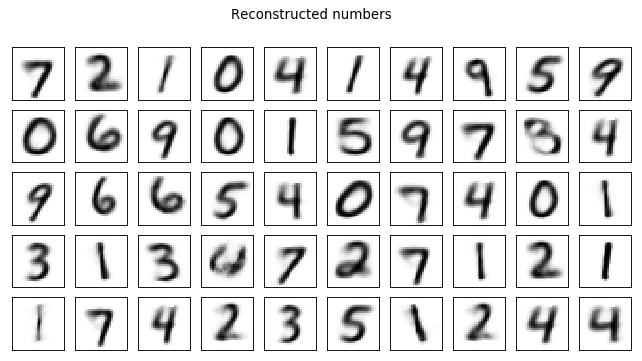

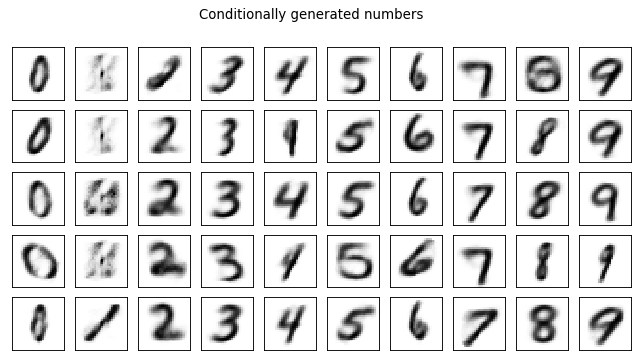

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 8 [0/50000 (0%)]	Losses E: 0.6890, AE: 0.1281, D: 0.6931
Train Epoch: 8 [25000/50000 (50%)]	Losses E: 0.6898, AE: 0.1432, D: 0.6929
Train Epoch: 8 [50000/50000 (100%)]	Losses E: 0.6884, AE: 0.1373, D: 0.6931


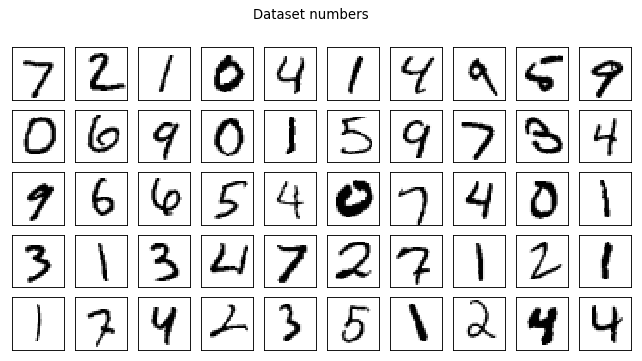

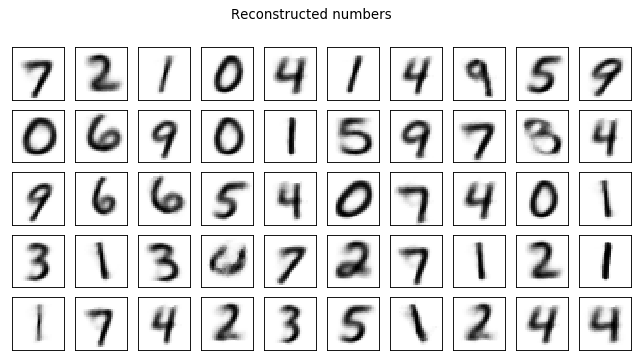

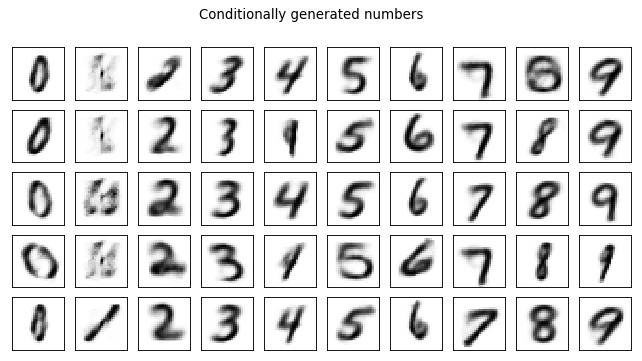

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 9 [0/50000 (0%)]	Losses E: 0.6887, AE: 0.1284, D: 0.6930
Train Epoch: 9 [25000/50000 (50%)]	Losses E: 0.6888, AE: 0.1226, D: 0.6931
Train Epoch: 9 [50000/50000 (100%)]	Losses E: 0.6903, AE: 0.1314, D: 0.6931


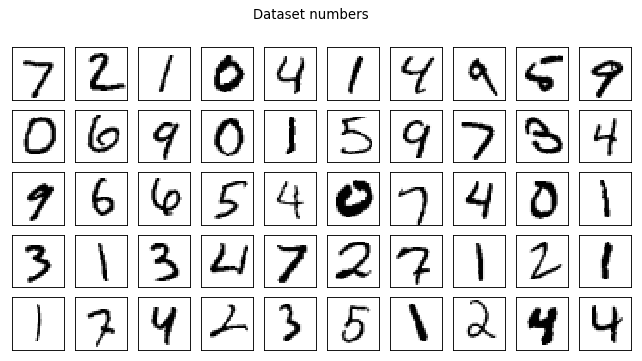

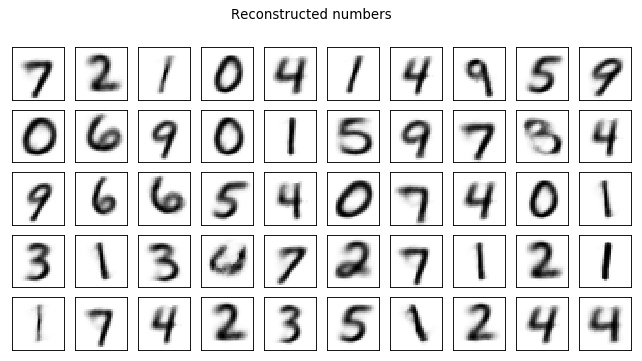

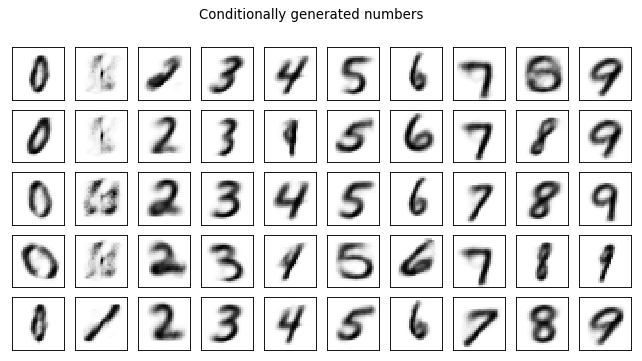

Test losses. E: 0.0035, AE: 0.0007, D: 0.0035
Train Epoch: 10 [0/50000 (0%)]	Losses E: 0.6904, AE: 0.1318, D: 0.6932
Train Epoch: 10 [25000/50000 (50%)]	Losses E: 0.6893, AE: 0.1330, D: 0.6931
Train Epoch: 10 [50000/50000 (100%)]	Losses E: 0.6911, AE: 0.1470, D: 0.6931


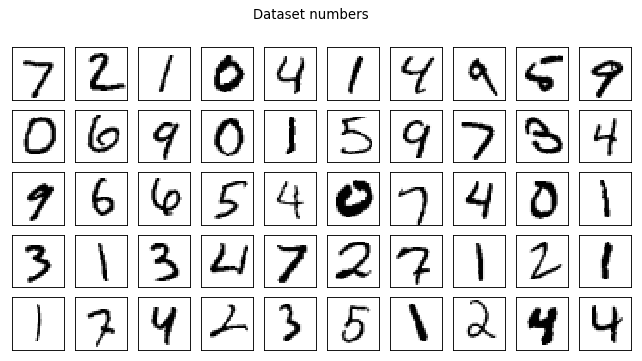

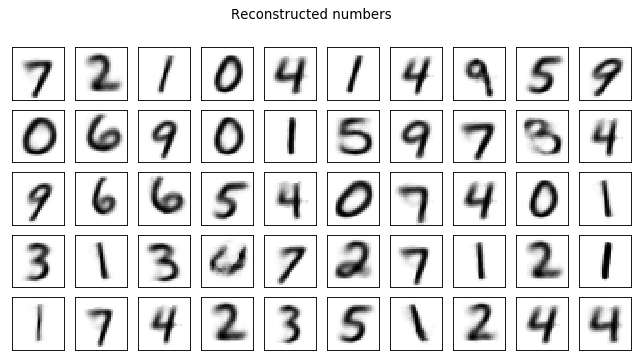

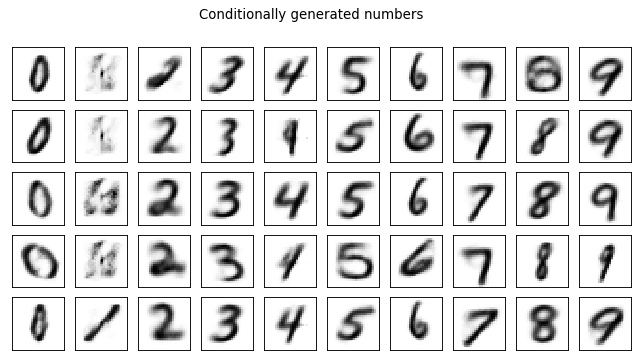

Test losses. E: 0.0035, AE: 0.0007, D: 0.0035
Train Epoch: 11 [0/50000 (0%)]	Losses E: 0.6910, AE: 0.1407, D: 0.6931
Train Epoch: 11 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1354, D: 0.6933
Train Epoch: 11 [50000/50000 (100%)]	Losses E: 0.6868, AE: 0.1441, D: 0.6931


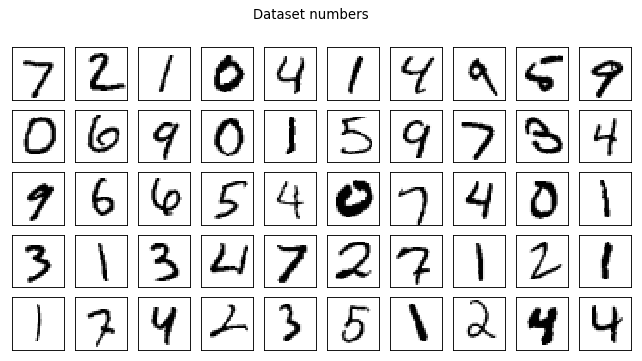

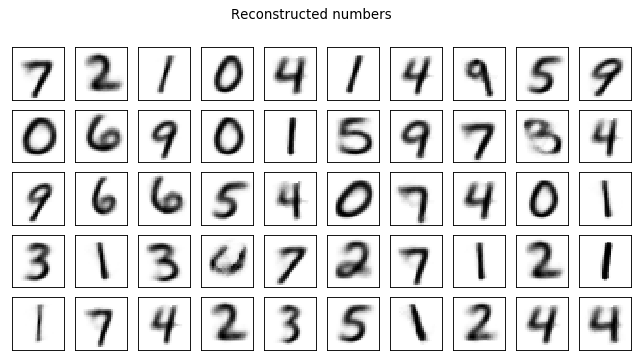

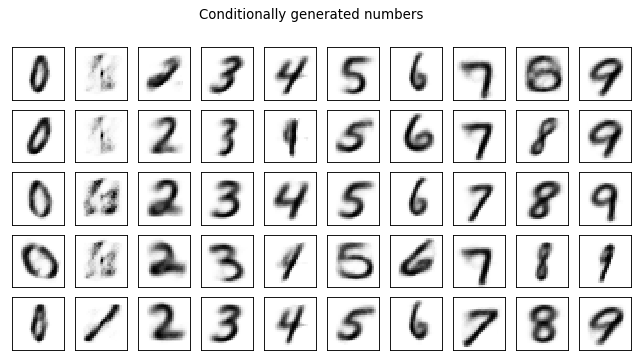

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 12 [0/50000 (0%)]	Losses E: 0.6864, AE: 0.1395, D: 0.6932
Train Epoch: 12 [25000/50000 (50%)]	Losses E: 0.6896, AE: 0.1246, D: 0.6932
Train Epoch: 12 [50000/50000 (100%)]	Losses E: 0.6878, AE: 0.1485, D: 0.6933


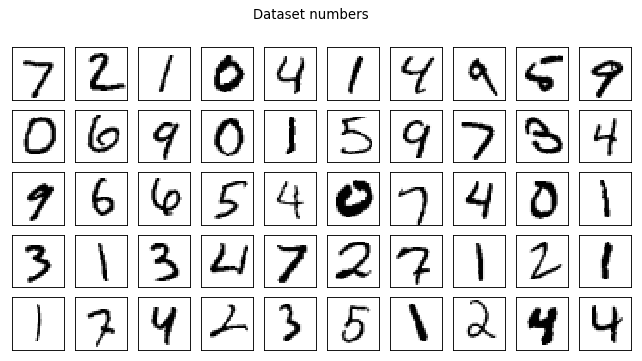

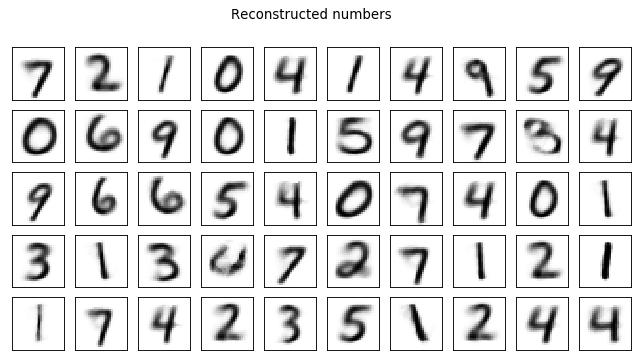

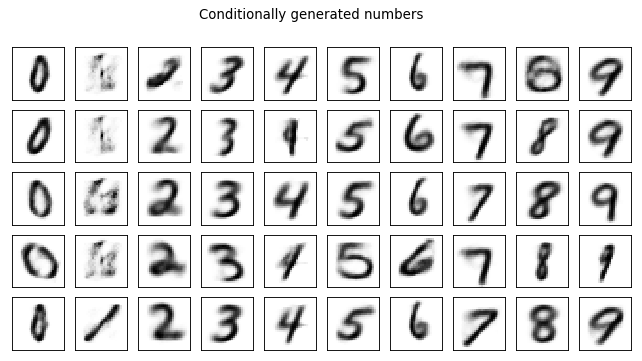

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 13 [0/50000 (0%)]	Losses E: 0.6879, AE: 0.1425, D: 0.6935
Train Epoch: 13 [25000/50000 (50%)]	Losses E: 0.6903, AE: 0.1386, D: 0.6931
Train Epoch: 13 [50000/50000 (100%)]	Losses E: 0.6870, AE: 0.1289, D: 0.6928


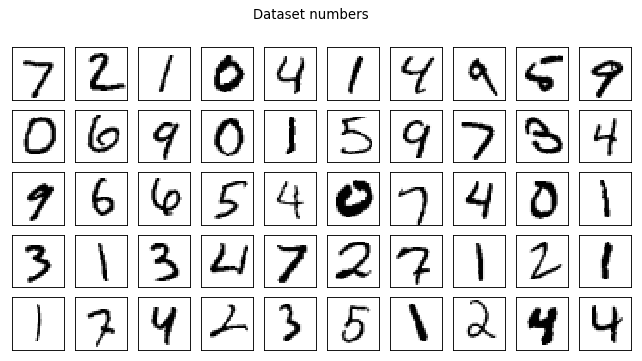

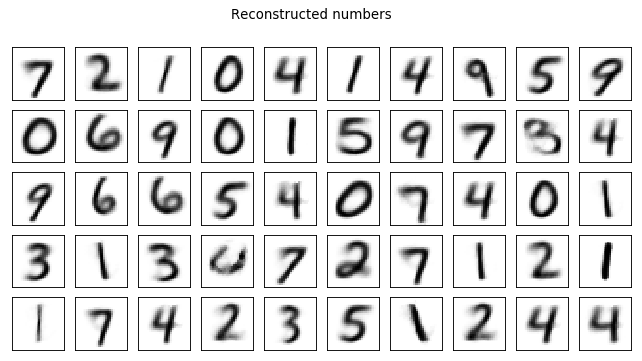

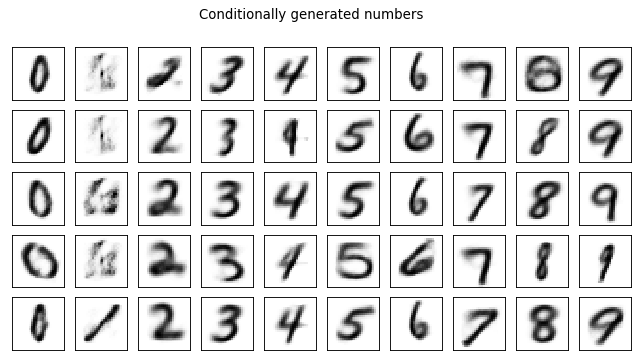

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 14 [0/50000 (0%)]	Losses E: 0.6866, AE: 0.1346, D: 0.6932
Train Epoch: 14 [25000/50000 (50%)]	Losses E: 0.6893, AE: 0.1332, D: 0.6931
Train Epoch: 14 [50000/50000 (100%)]	Losses E: 0.6887, AE: 0.1274, D: 0.6932


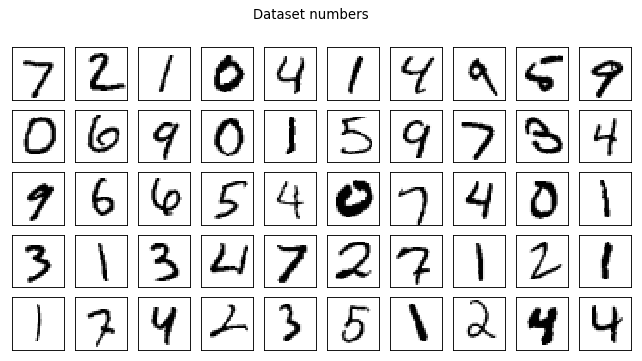

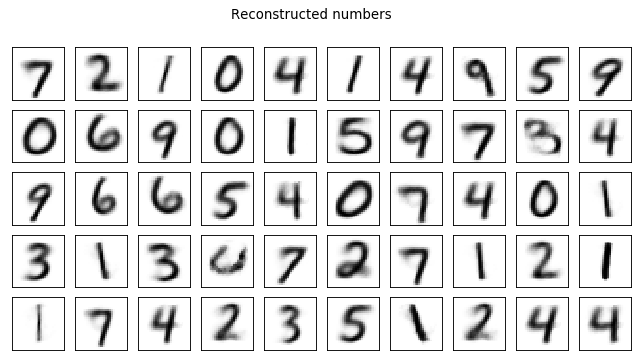

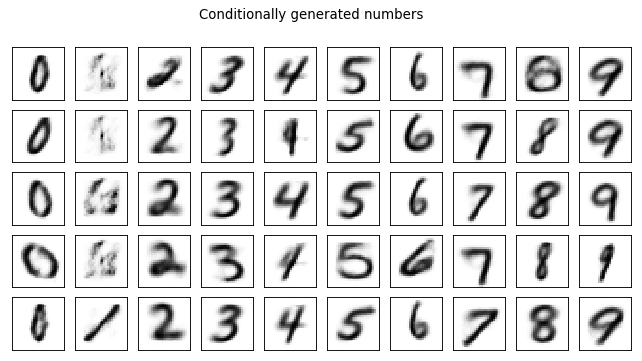

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 15 [0/50000 (0%)]	Losses E: 0.6884, AE: 0.1213, D: 0.6934
Train Epoch: 15 [25000/50000 (50%)]	Losses E: 0.6889, AE: 0.1398, D: 0.6930
Train Epoch: 15 [50000/50000 (100%)]	Losses E: 0.6886, AE: 0.1264, D: 0.6929


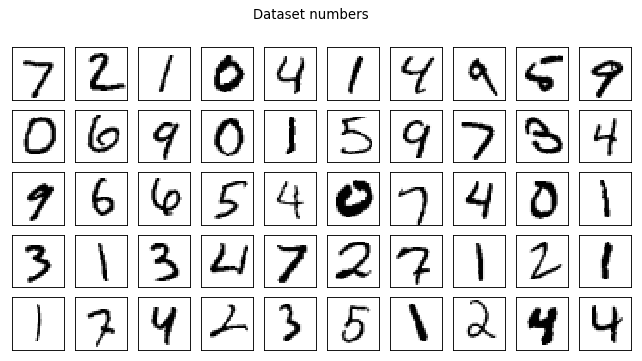

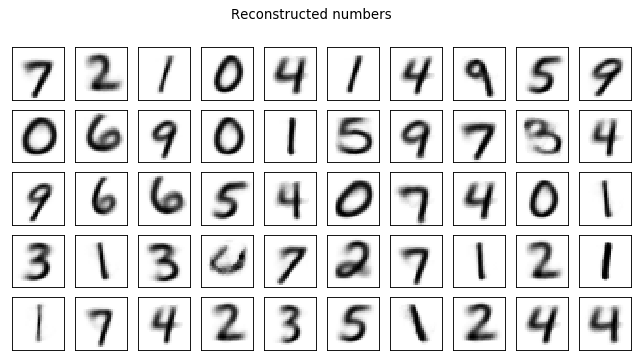

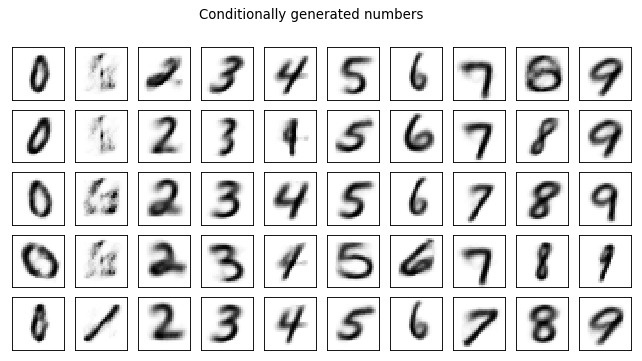

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 16 [0/50000 (0%)]	Losses E: 0.6883, AE: 0.1423, D: 0.6930
Train Epoch: 16 [25000/50000 (50%)]	Losses E: 0.6880, AE: 0.1227, D: 0.6931
Train Epoch: 16 [50000/50000 (100%)]	Losses E: 0.6867, AE: 0.1256, D: 0.6933


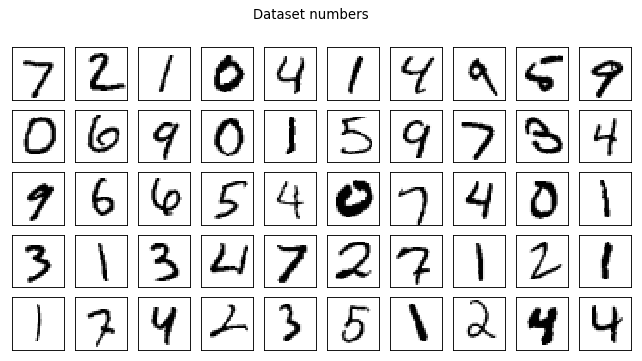

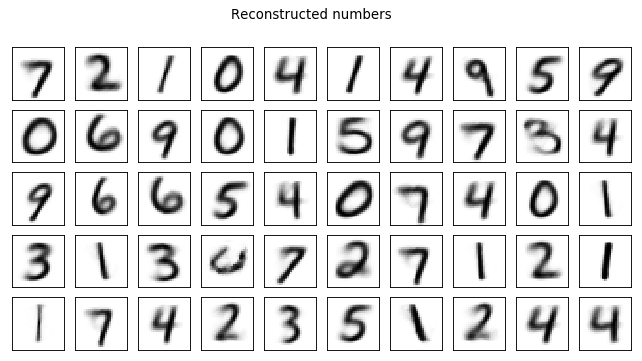

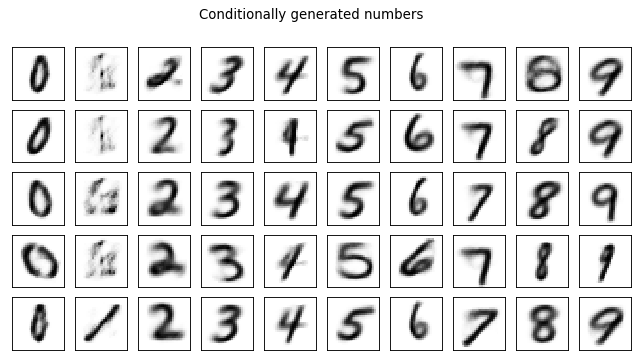

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 17 [0/50000 (0%)]	Losses E: 0.6865, AE: 0.1519, D: 0.6933
Train Epoch: 17 [25000/50000 (50%)]	Losses E: 0.6895, AE: 0.1266, D: 0.6932
Train Epoch: 17 [50000/50000 (100%)]	Losses E: 0.6890, AE: 0.1371, D: 0.6931


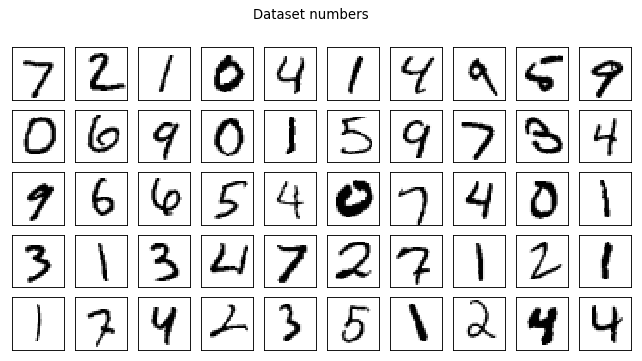

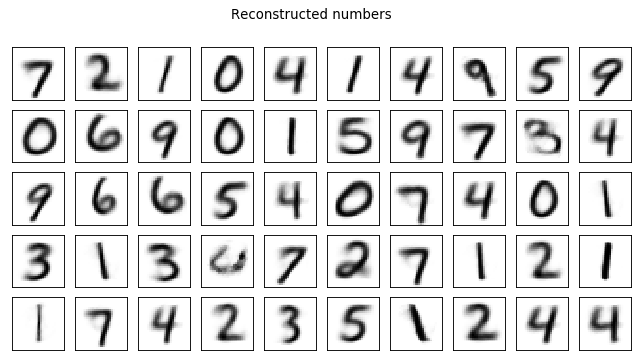

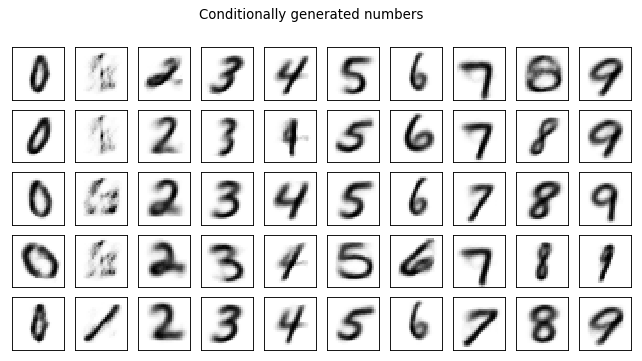

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 18 [0/50000 (0%)]	Losses E: 0.6891, AE: 0.1222, D: 0.6931
Train Epoch: 18 [25000/50000 (50%)]	Losses E: 0.6889, AE: 0.1212, D: 0.6930
Train Epoch: 18 [50000/50000 (100%)]	Losses E: 0.6895, AE: 0.1242, D: 0.6933


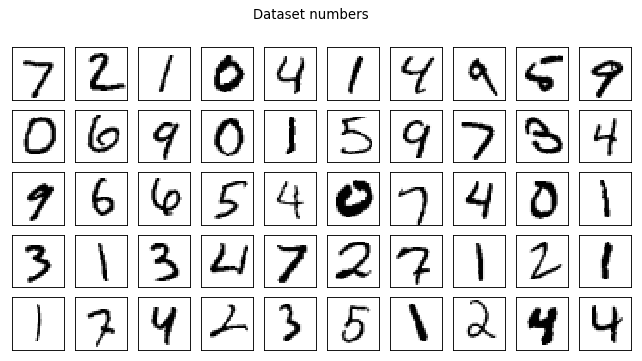

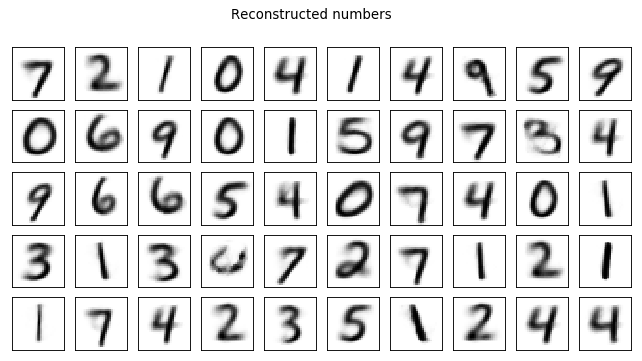

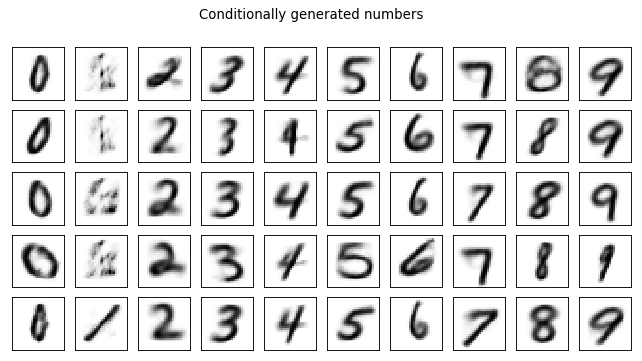

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 19 [0/50000 (0%)]	Losses E: 0.6899, AE: 0.1369, D: 0.6932
Train Epoch: 19 [25000/50000 (50%)]	Losses E: 0.6891, AE: 0.1251, D: 0.6932
Train Epoch: 19 [50000/50000 (100%)]	Losses E: 0.6888, AE: 0.1406, D: 0.6932


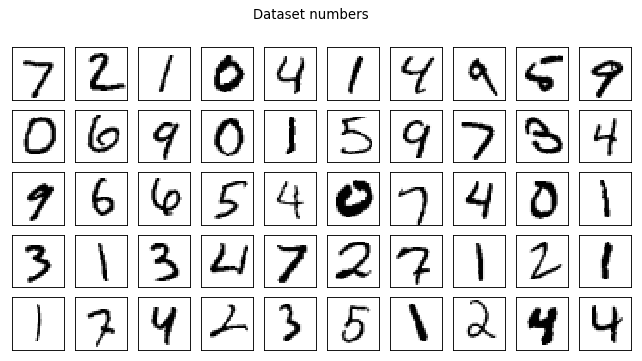

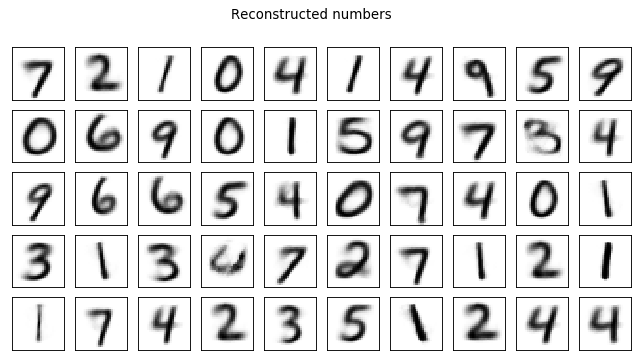

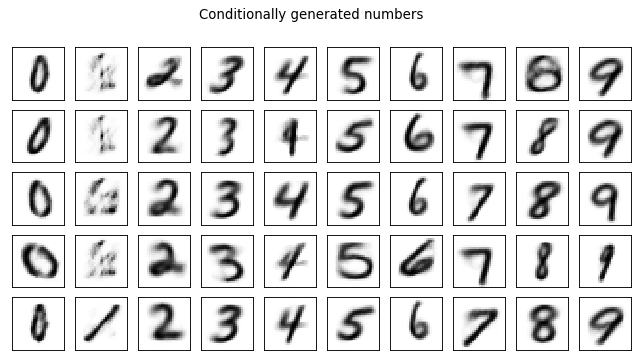

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 20 [0/50000 (0%)]	Losses E: 0.6890, AE: 0.1366, D: 0.6933
Train Epoch: 20 [25000/50000 (50%)]	Losses E: 0.6889, AE: 0.1213, D: 0.6933
Train Epoch: 20 [50000/50000 (100%)]	Losses E: 0.6885, AE: 0.1201, D: 0.6931


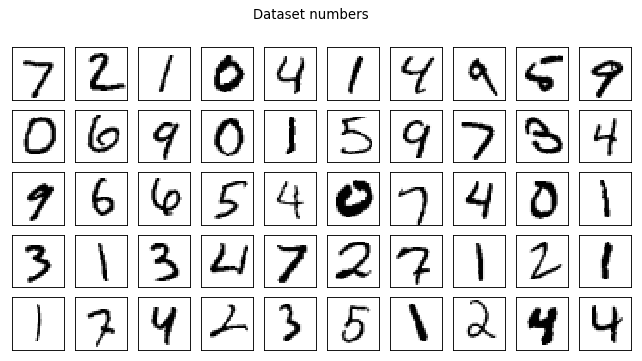

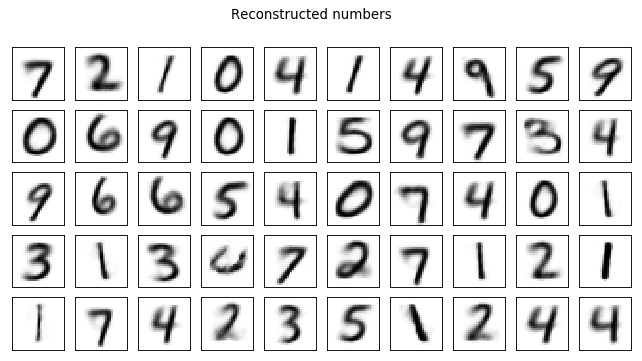

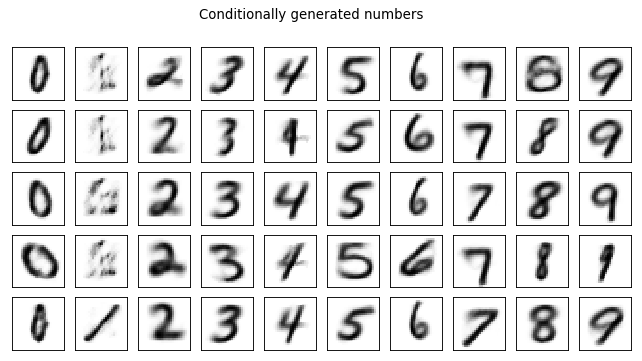

Test losses. E: 0.0034, AE: 0.0005, D: 0.0035
Train Epoch: 21 [0/50000 (0%)]	Losses E: 0.6884, AE: 0.1285, D: 0.6931
Train Epoch: 21 [25000/50000 (50%)]	Losses E: 0.6905, AE: 0.1203, D: 0.6931
Train Epoch: 21 [50000/50000 (100%)]	Losses E: 0.6878, AE: 0.1233, D: 0.6932


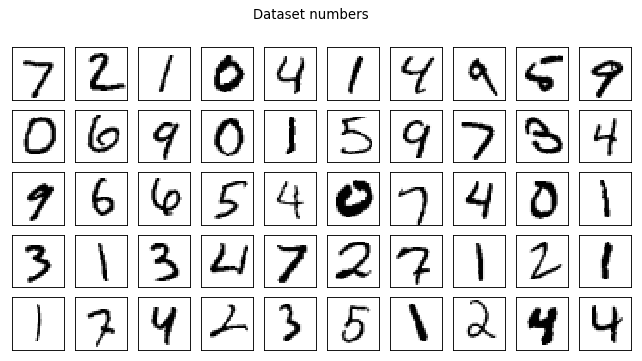

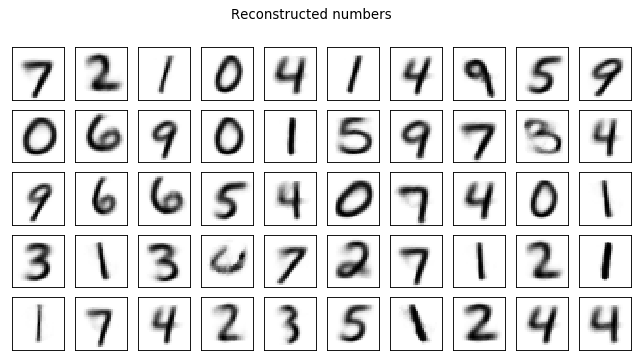

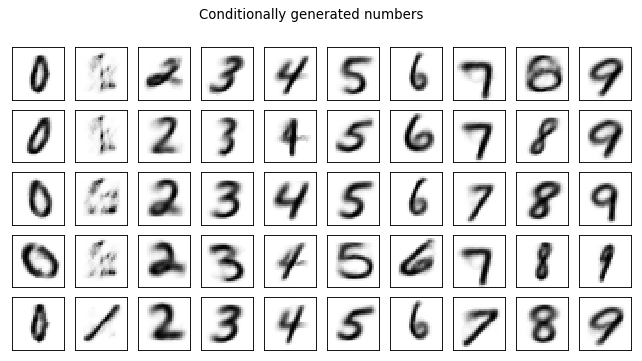

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 22 [0/50000 (0%)]	Losses E: 0.6880, AE: 0.1239, D: 0.6931
Train Epoch: 22 [25000/50000 (50%)]	Losses E: 0.6851, AE: 0.1335, D: 0.6927
Train Epoch: 22 [50000/50000 (100%)]	Losses E: 0.6887, AE: 0.1241, D: 0.6930


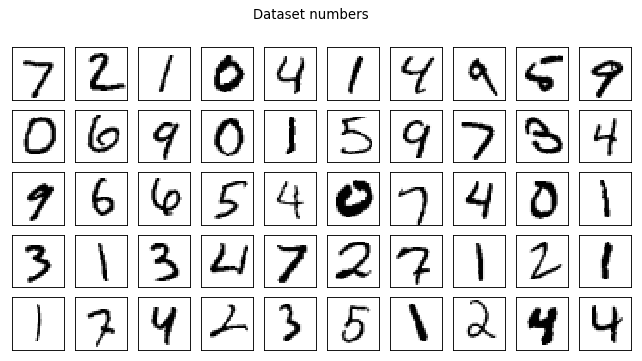

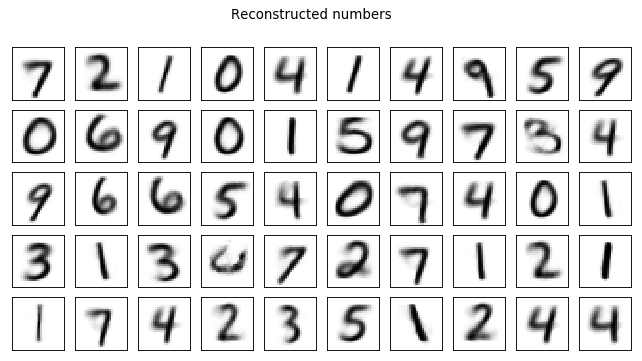

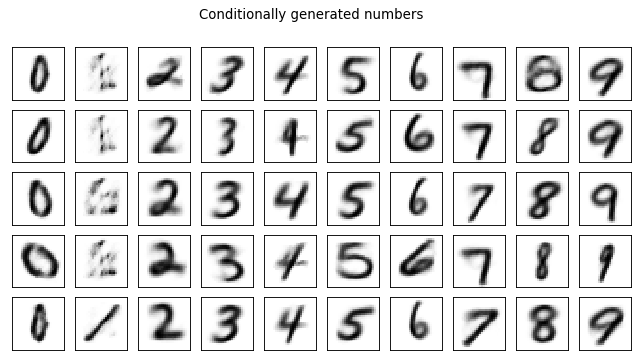

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 23 [0/50000 (0%)]	Losses E: 0.6890, AE: 0.1385, D: 0.6930
Train Epoch: 23 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1246, D: 0.6929
Train Epoch: 23 [50000/50000 (100%)]	Losses E: 0.6874, AE: 0.1370, D: 0.6931


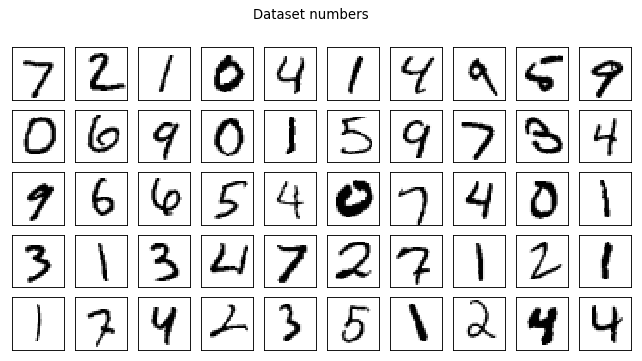

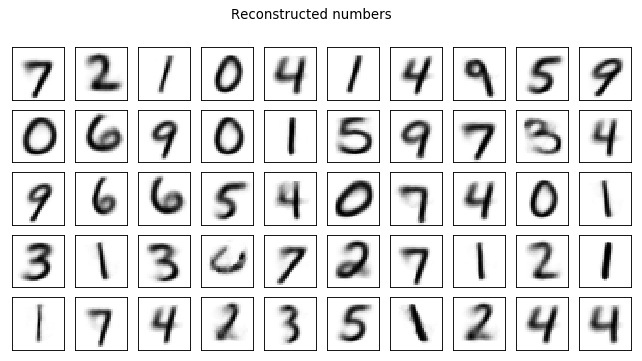

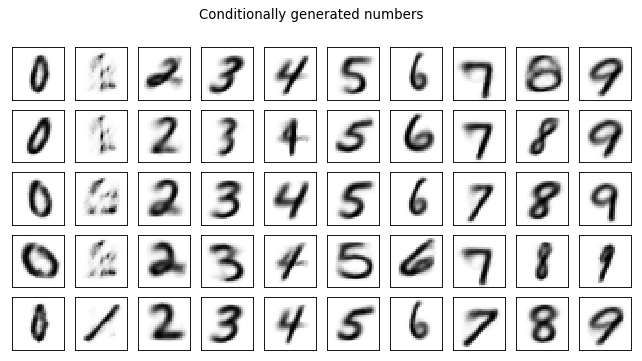

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 24 [0/50000 (0%)]	Losses E: 0.6876, AE: 0.1457, D: 0.6933
Train Epoch: 24 [25000/50000 (50%)]	Losses E: 0.6881, AE: 0.1206, D: 0.6935
Train Epoch: 24 [50000/50000 (100%)]	Losses E: 0.6890, AE: 0.1401, D: 0.6932


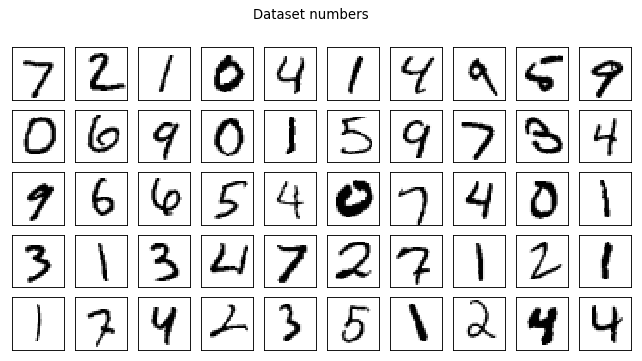

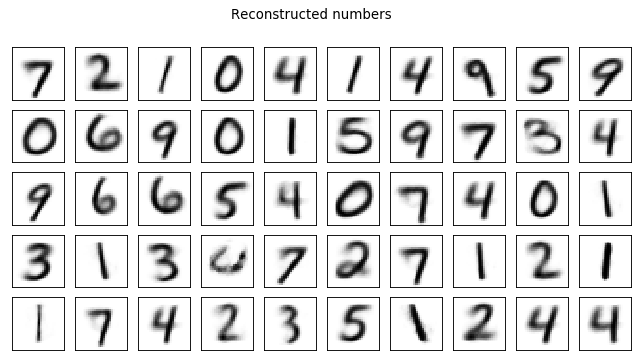

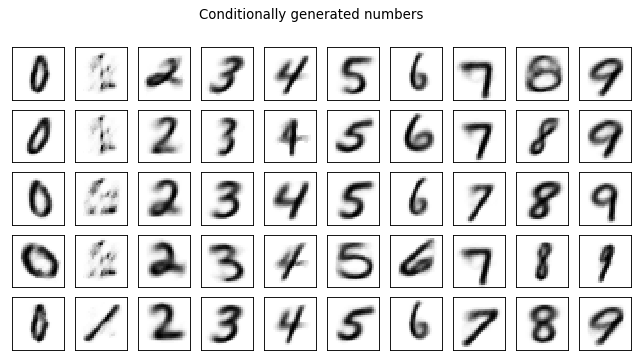

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 25 [0/50000 (0%)]	Losses E: 0.6888, AE: 0.1291, D: 0.6932
Train Epoch: 25 [25000/50000 (50%)]	Losses E: 0.6869, AE: 0.1248, D: 0.6929
Train Epoch: 25 [50000/50000 (100%)]	Losses E: 0.6877, AE: 0.1223, D: 0.6934


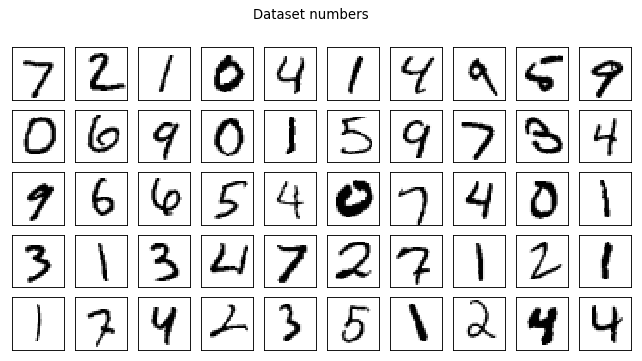

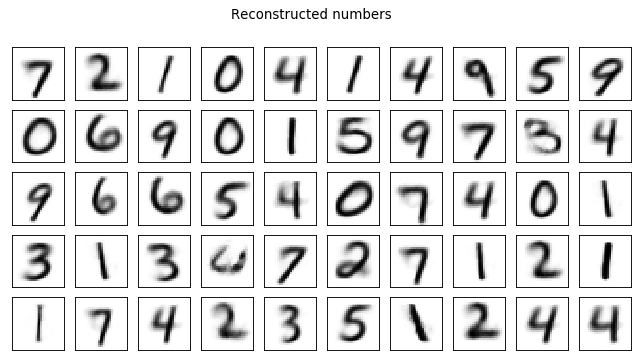

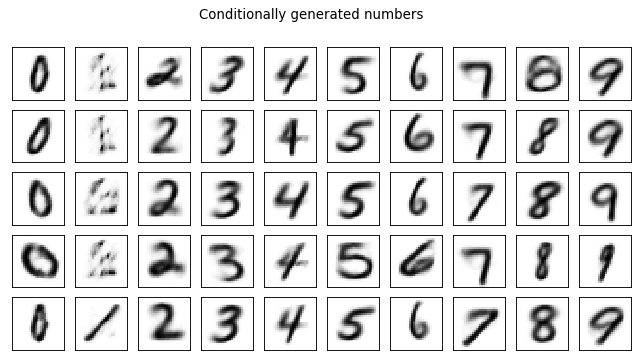

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 26 [0/50000 (0%)]	Losses E: 0.6873, AE: 0.1171, D: 0.6931
Train Epoch: 26 [25000/50000 (50%)]	Losses E: 0.6877, AE: 0.1260, D: 0.6932
Train Epoch: 26 [50000/50000 (100%)]	Losses E: 0.6871, AE: 0.1484, D: 0.6933


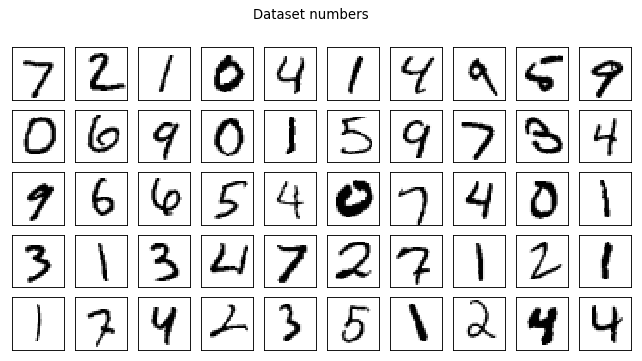

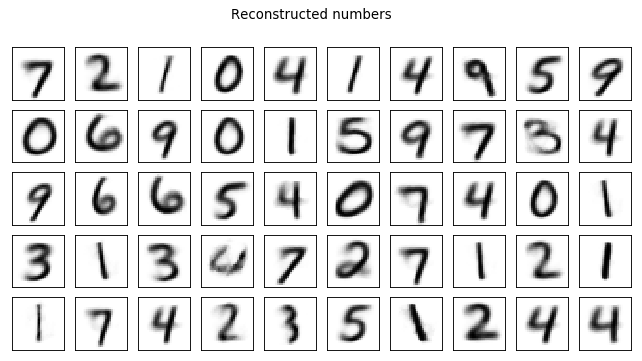

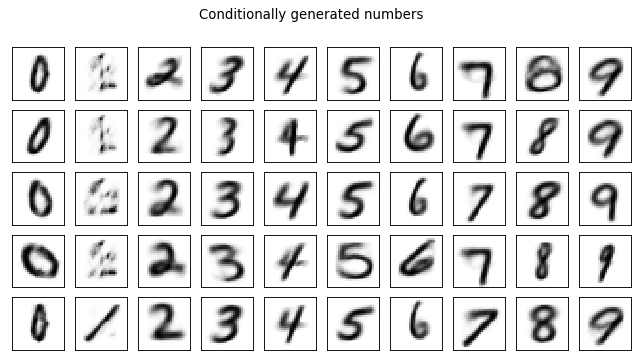

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 27 [0/50000 (0%)]	Losses E: 0.6874, AE: 0.1193, D: 0.6934
Train Epoch: 27 [25000/50000 (50%)]	Losses E: 0.6887, AE: 0.1399, D: 0.6929
Train Epoch: 27 [50000/50000 (100%)]	Losses E: 0.6884, AE: 0.1254, D: 0.6932


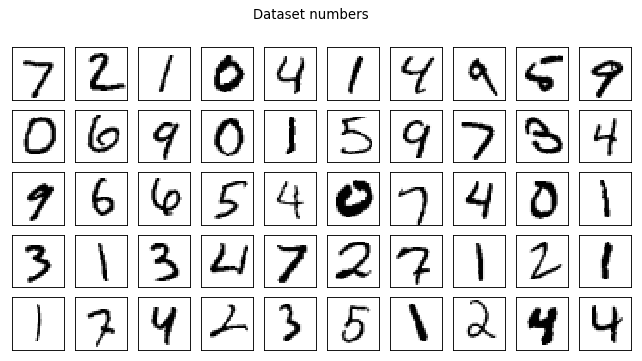

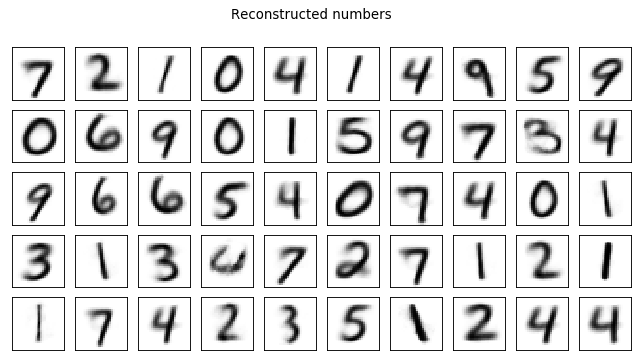

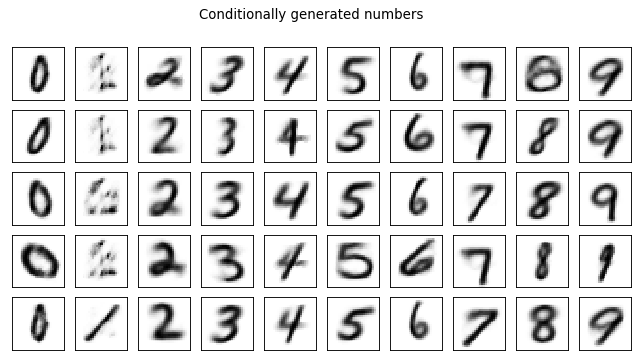

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 28 [0/50000 (0%)]	Losses E: 0.6888, AE: 0.1360, D: 0.6933
Train Epoch: 28 [25000/50000 (50%)]	Losses E: 0.6876, AE: 0.1333, D: 0.6932
Train Epoch: 28 [50000/50000 (100%)]	Losses E: 0.6894, AE: 0.1341, D: 0.6931


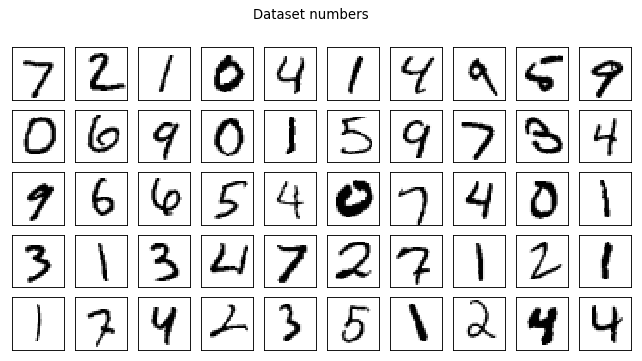

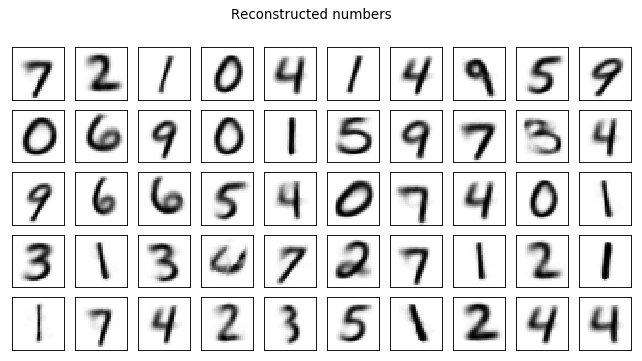

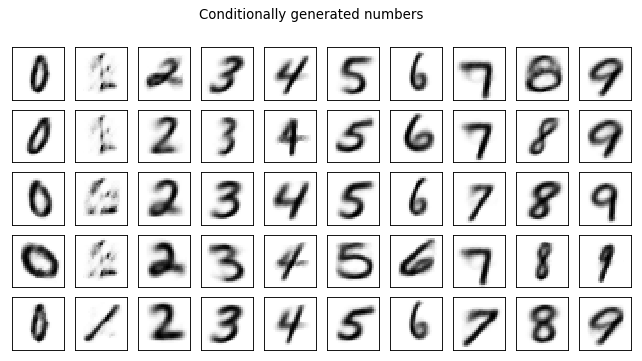

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 29 [0/50000 (0%)]	Losses E: 0.6888, AE: 0.1137, D: 0.6934
Train Epoch: 29 [25000/50000 (50%)]	Losses E: 0.6902, AE: 0.1119, D: 0.6931
Train Epoch: 29 [50000/50000 (100%)]	Losses E: 0.6867, AE: 0.1215, D: 0.6932


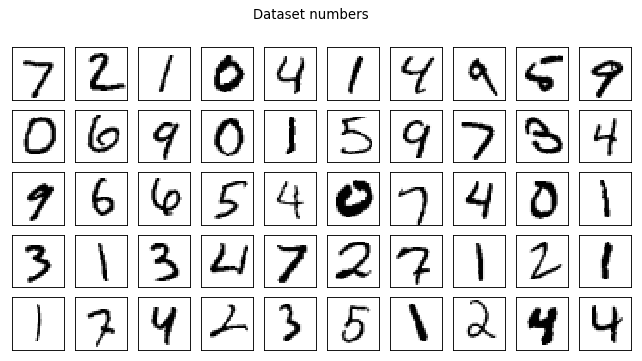

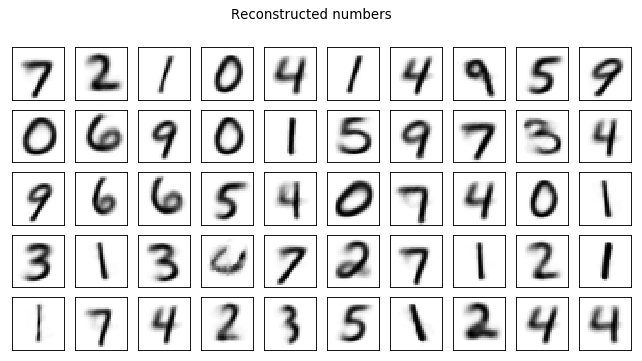

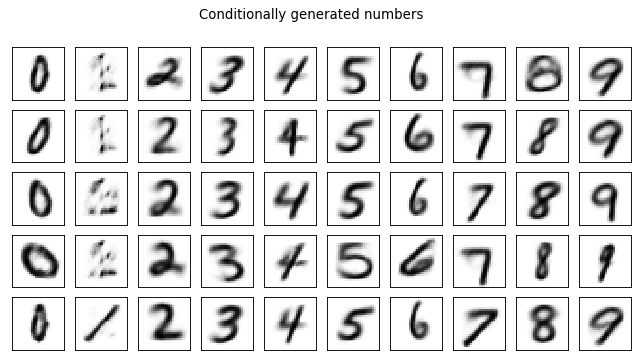

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 30 [0/50000 (0%)]	Losses E: 0.6849, AE: 0.1373, D: 0.6936
Train Epoch: 30 [25000/50000 (50%)]	Losses E: 0.6880, AE: 0.1166, D: 0.6932
Train Epoch: 30 [50000/50000 (100%)]	Losses E: 0.6915, AE: 0.1397, D: 0.6931


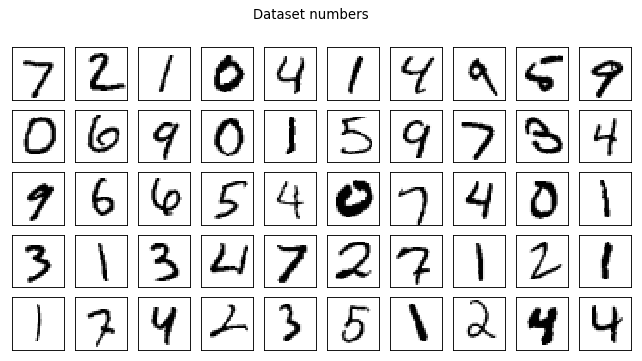

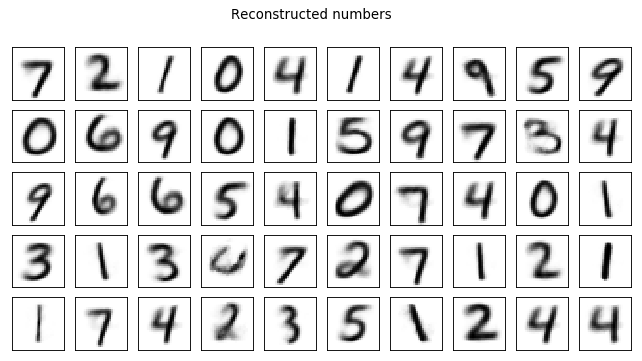

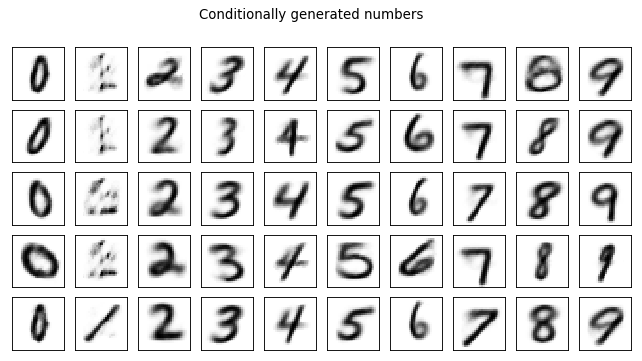

Test losses. E: 0.0035, AE: 0.0007, D: 0.0035
Train Epoch: 31 [0/50000 (0%)]	Losses E: 0.6915, AE: 0.1218, D: 0.6930
Train Epoch: 31 [25000/50000 (50%)]	Losses E: 0.6898, AE: 0.1360, D: 0.6932
Train Epoch: 31 [50000/50000 (100%)]	Losses E: 0.6902, AE: 0.1313, D: 0.6930


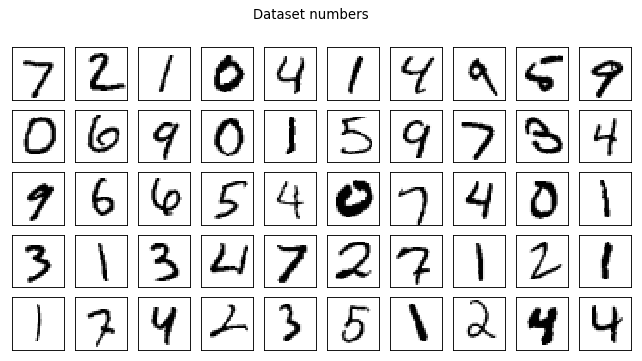

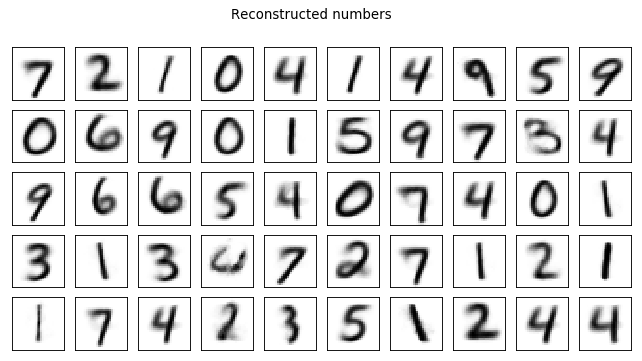

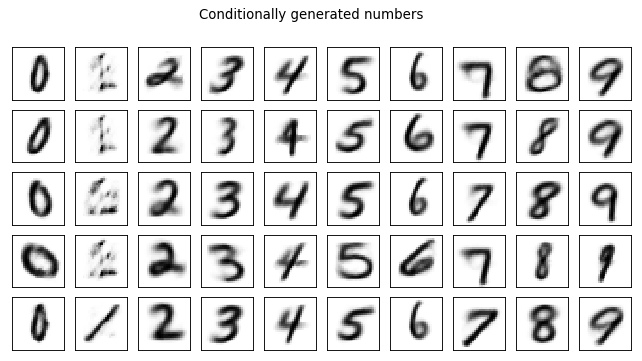

Test losses. E: 0.0035, AE: 0.0006, D: 0.0035
Train Epoch: 32 [0/50000 (0%)]	Losses E: 0.6901, AE: 0.1292, D: 0.6932
Train Epoch: 32 [25000/50000 (50%)]	Losses E: 0.6895, AE: 0.1273, D: 0.6931
Train Epoch: 32 [50000/50000 (100%)]	Losses E: 0.6878, AE: 0.1273, D: 0.6931


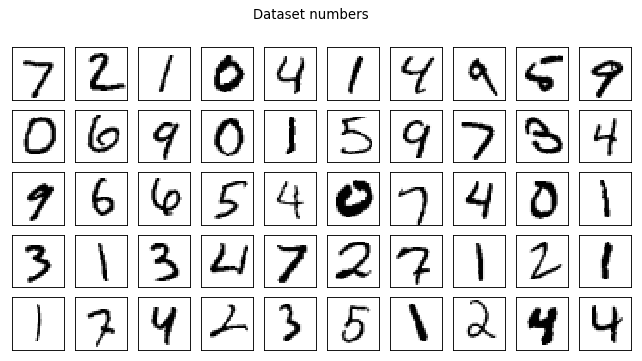

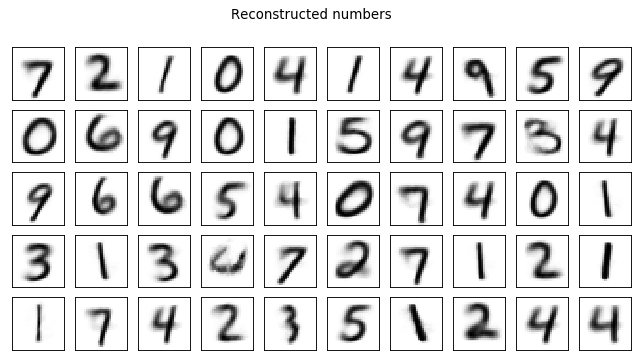

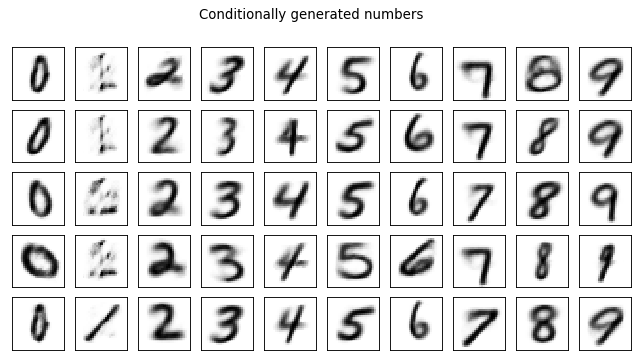

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 33 [0/50000 (0%)]	Losses E: 0.6879, AE: 0.1307, D: 0.6933
Train Epoch: 33 [25000/50000 (50%)]	Losses E: 0.6892, AE: 0.1289, D: 0.6931
Train Epoch: 33 [50000/50000 (100%)]	Losses E: 0.6898, AE: 0.1259, D: 0.6932


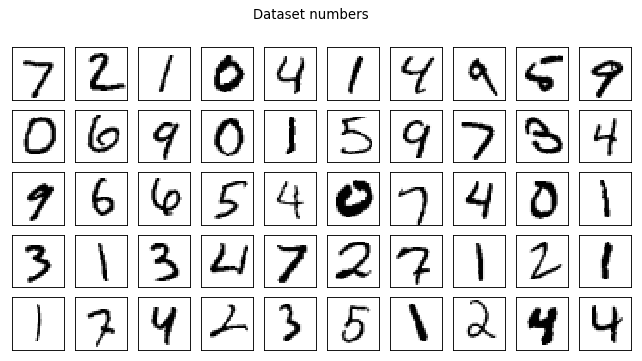

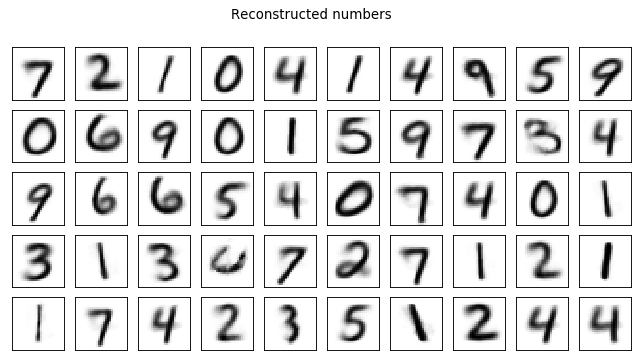

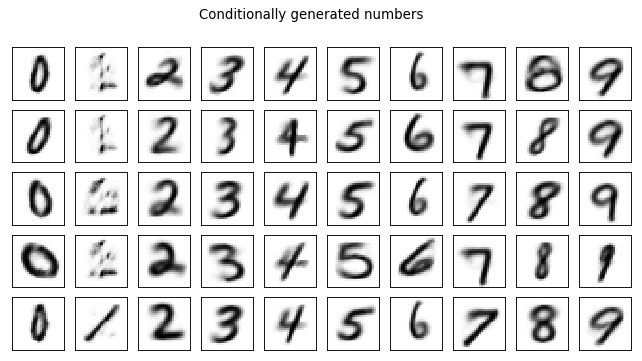

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 34 [0/50000 (0%)]	Losses E: 0.6898, AE: 0.1241, D: 0.6932
Train Epoch: 34 [25000/50000 (50%)]	Losses E: 0.6858, AE: 0.1233, D: 0.6933
Train Epoch: 34 [50000/50000 (100%)]	Losses E: 0.6884, AE: 0.1120, D: 0.6933


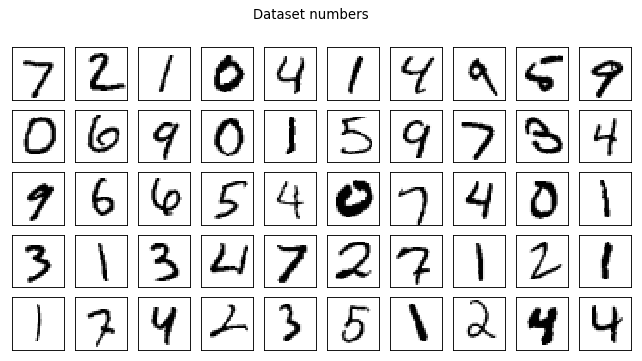

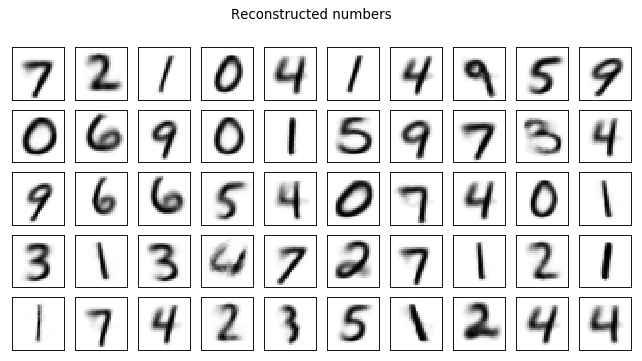

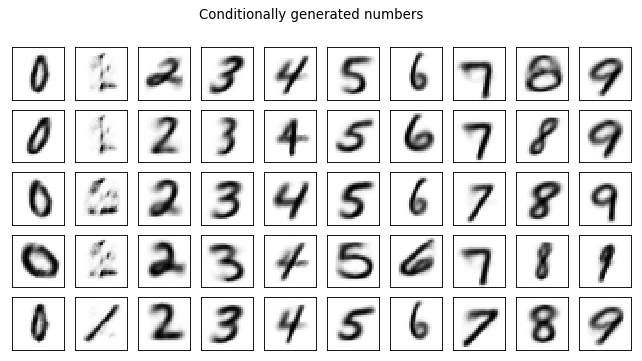

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 35 [0/50000 (0%)]	Losses E: 0.6890, AE: 0.1250, D: 0.6930
Train Epoch: 35 [25000/50000 (50%)]	Losses E: 0.6875, AE: 0.1293, D: 0.6925
Train Epoch: 35 [50000/50000 (100%)]	Losses E: 0.6865, AE: 0.1320, D: 0.6930


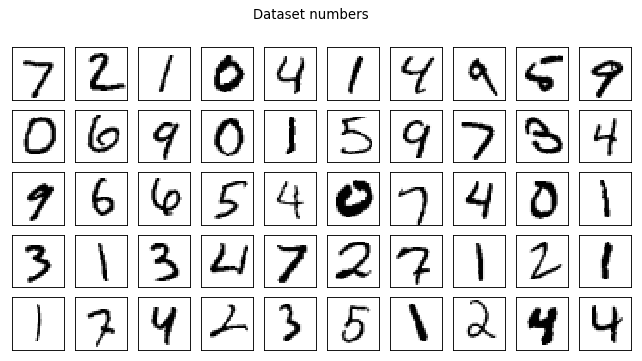

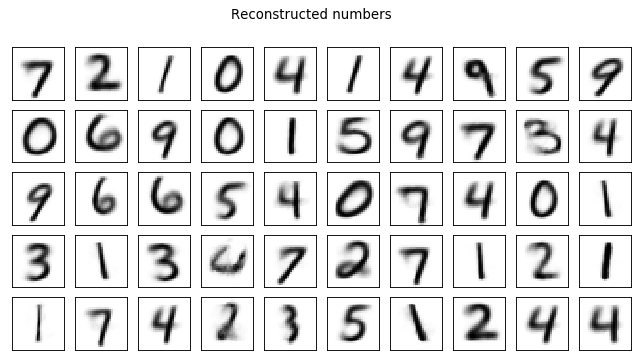

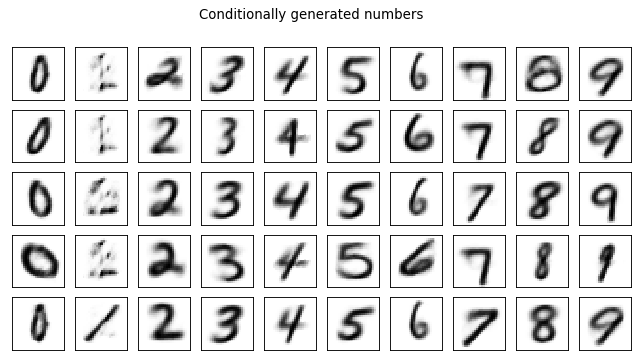

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 36 [0/50000 (0%)]	Losses E: 0.6855, AE: 0.1301, D: 0.6935
Train Epoch: 36 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1284, D: 0.6932
Train Epoch: 36 [50000/50000 (100%)]	Losses E: 0.6877, AE: 0.1220, D: 0.6931


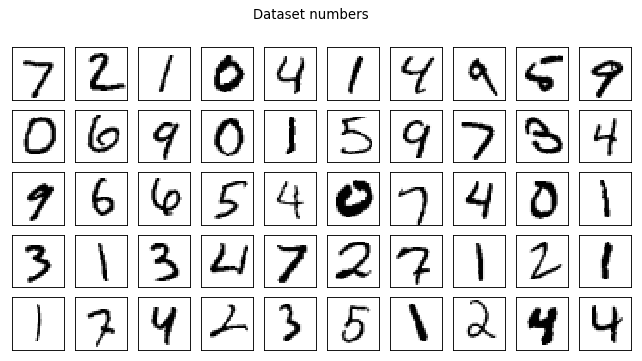

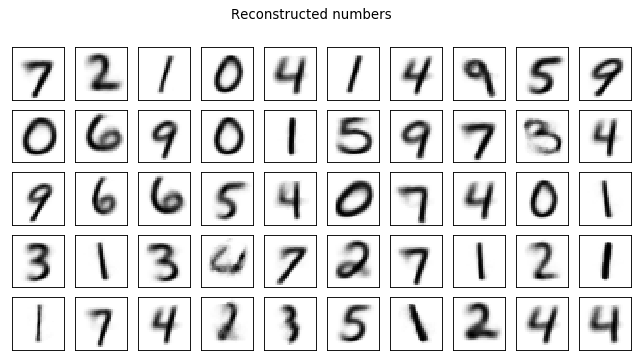

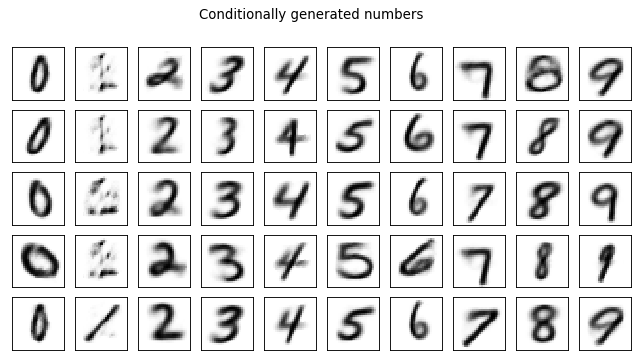

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 37 [0/50000 (0%)]	Losses E: 0.6871, AE: 0.1281, D: 0.6931
Train Epoch: 37 [25000/50000 (50%)]	Losses E: 0.6871, AE: 0.1344, D: 0.6932
Train Epoch: 37 [50000/50000 (100%)]	Losses E: 0.6887, AE: 0.1277, D: 0.6932


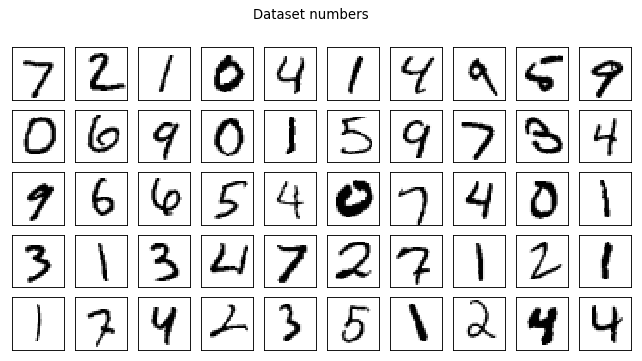

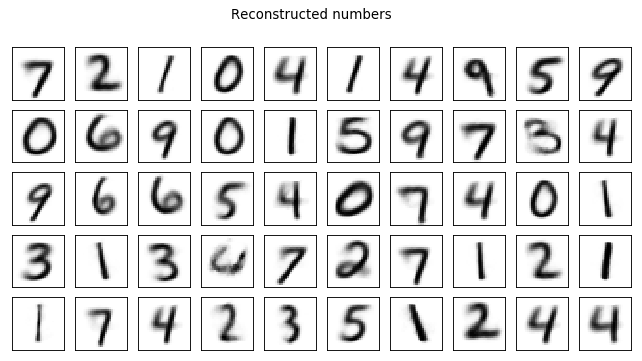

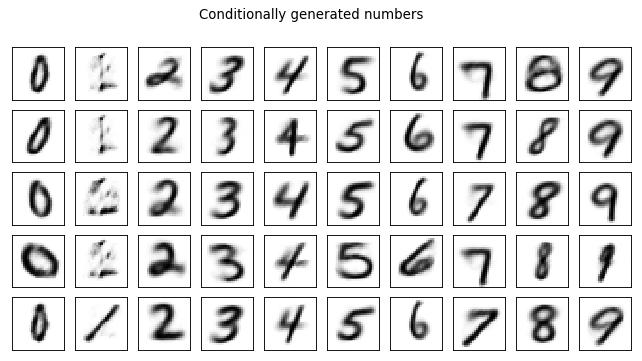

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 38 [0/50000 (0%)]	Losses E: 0.6889, AE: 0.1318, D: 0.6930
Train Epoch: 38 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1217, D: 0.6932
Train Epoch: 38 [50000/50000 (100%)]	Losses E: 0.6896, AE: 0.1381, D: 0.6931


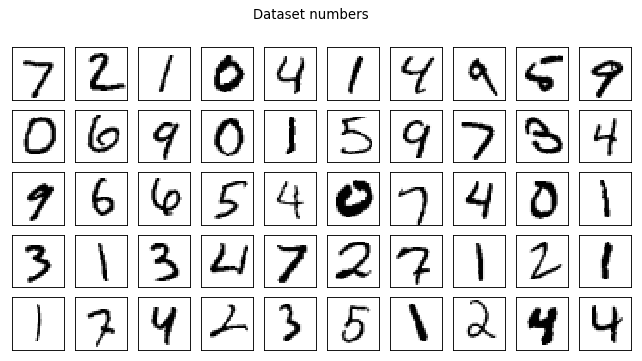

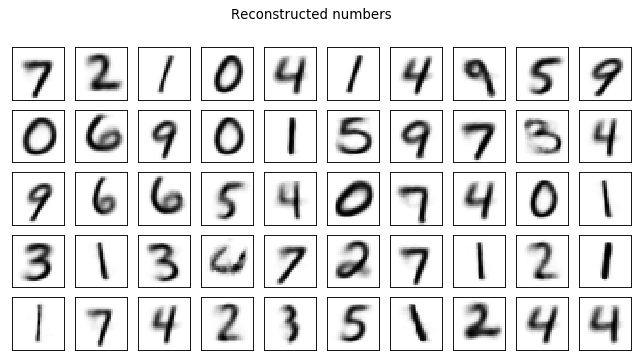

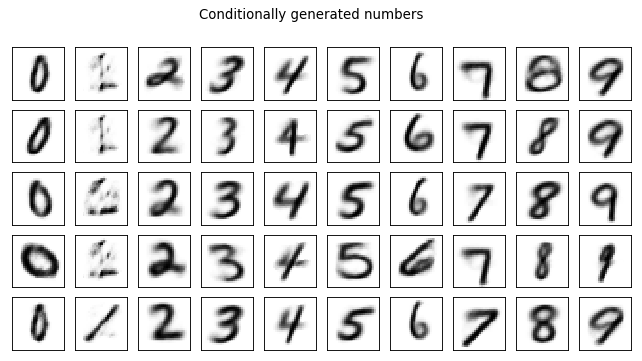

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 39 [0/50000 (0%)]	Losses E: 0.6894, AE: 0.1448, D: 0.6932
Train Epoch: 39 [25000/50000 (50%)]	Losses E: 0.6845, AE: 0.1137, D: 0.6932
Train Epoch: 39 [50000/50000 (100%)]	Losses E: 0.6886, AE: 0.1230, D: 0.6932


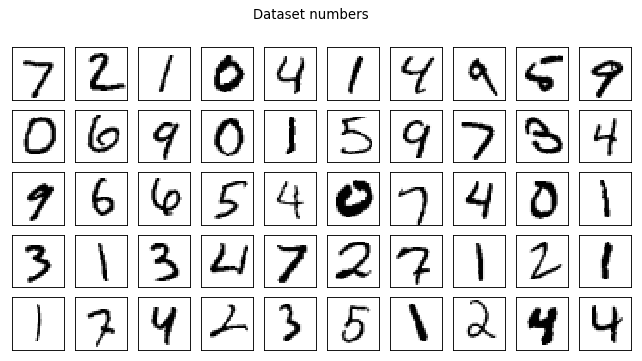

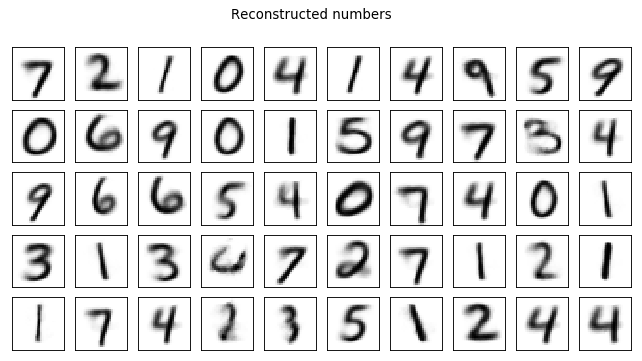

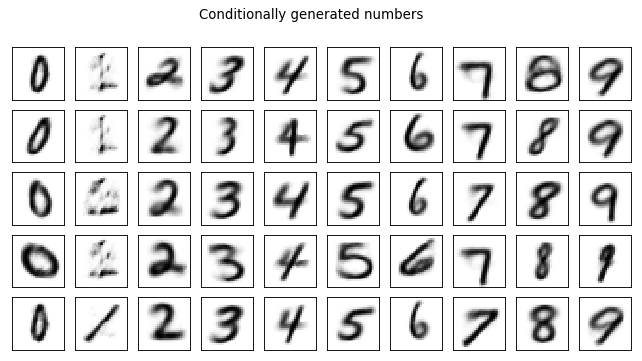

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 40 [0/50000 (0%)]	Losses E: 0.6880, AE: 0.1189, D: 0.6932
Train Epoch: 40 [25000/50000 (50%)]	Losses E: 0.6866, AE: 0.1315, D: 0.6935
Train Epoch: 40 [50000/50000 (100%)]	Losses E: 0.6900, AE: 0.1334, D: 0.6932


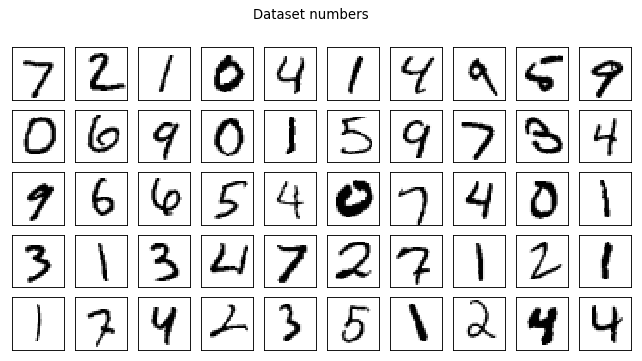

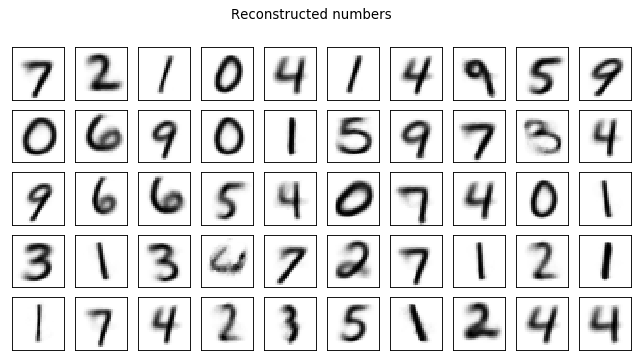

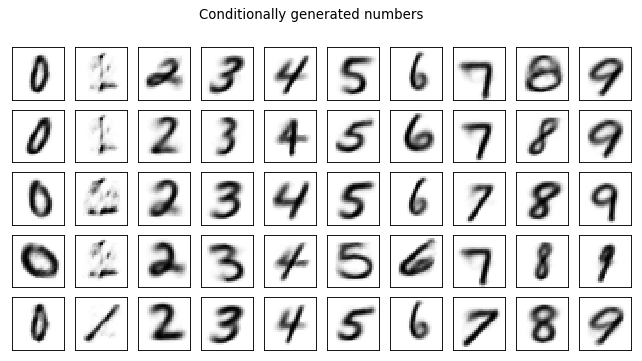

Test losses. E: 0.0035, AE: 0.0007, D: 0.0035
Train Epoch: 41 [0/50000 (0%)]	Losses E: 0.6903, AE: 0.1284, D: 0.6931
Train Epoch: 41 [25000/50000 (50%)]	Losses E: 0.6881, AE: 0.1168, D: 0.6935
Train Epoch: 41 [50000/50000 (100%)]	Losses E: 0.6900, AE: 0.1363, D: 0.6931


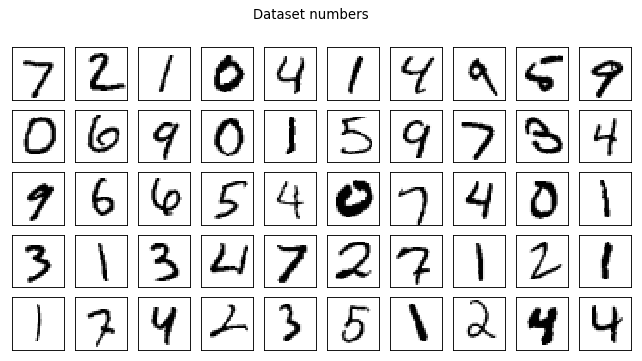

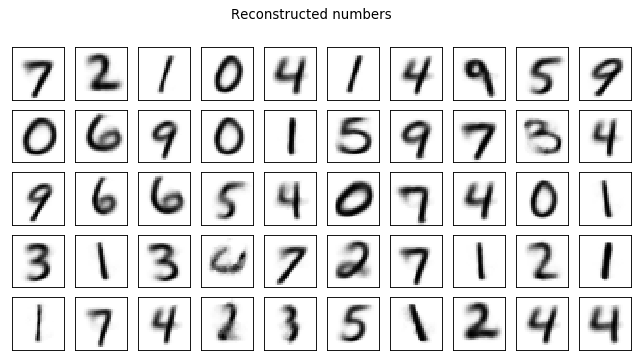

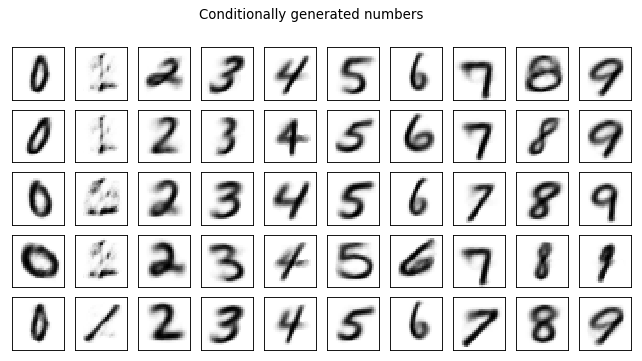

Test losses. E: 0.0035, AE: 0.0006, D: 0.0035
Train Epoch: 42 [0/50000 (0%)]	Losses E: 0.6899, AE: 0.1214, D: 0.6932
Train Epoch: 42 [25000/50000 (50%)]	Losses E: 0.6899, AE: 0.1207, D: 0.6932
Train Epoch: 42 [50000/50000 (100%)]	Losses E: 0.6886, AE: 0.1186, D: 0.6930


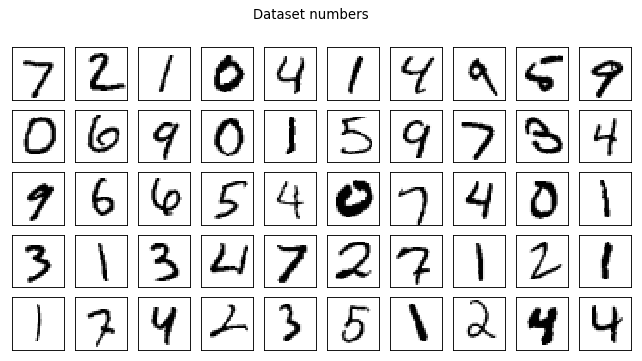

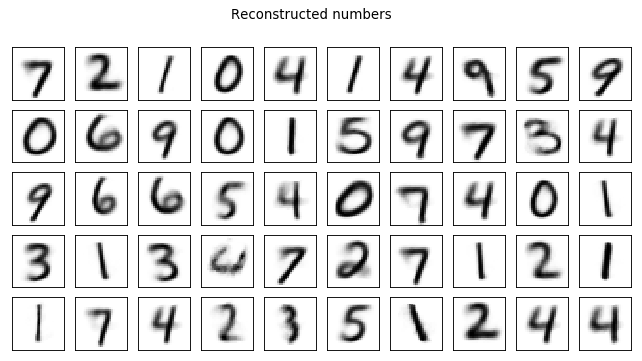

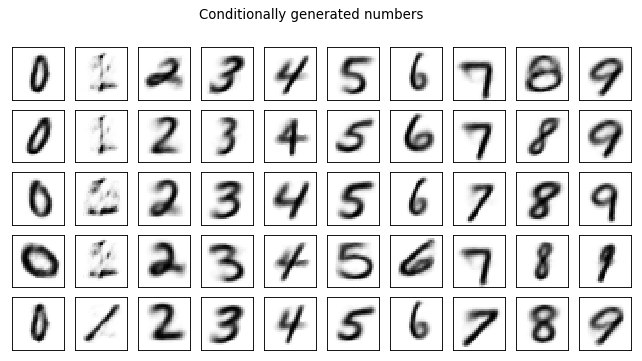

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 43 [0/50000 (0%)]	Losses E: 0.6888, AE: 0.1390, D: 0.6930
Train Epoch: 43 [25000/50000 (50%)]	Losses E: 0.6902, AE: 0.1276, D: 0.6931
Train Epoch: 43 [50000/50000 (100%)]	Losses E: 0.6885, AE: 0.1179, D: 0.6933


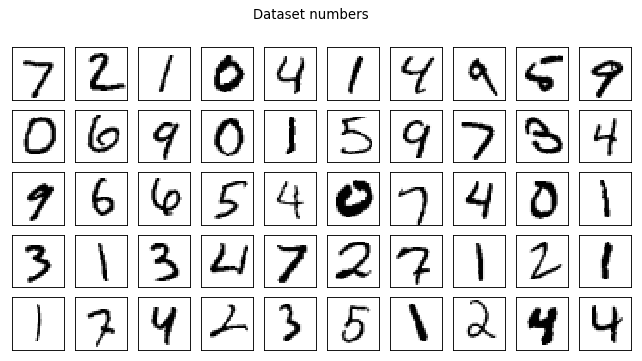

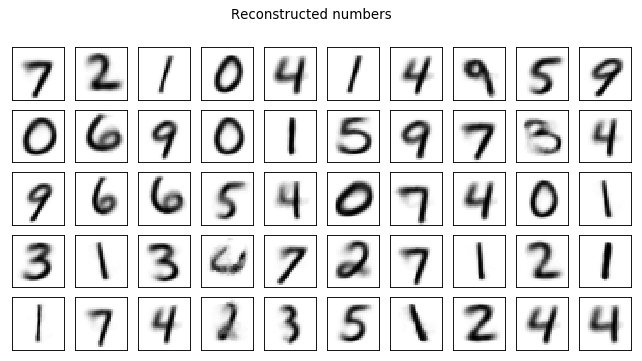

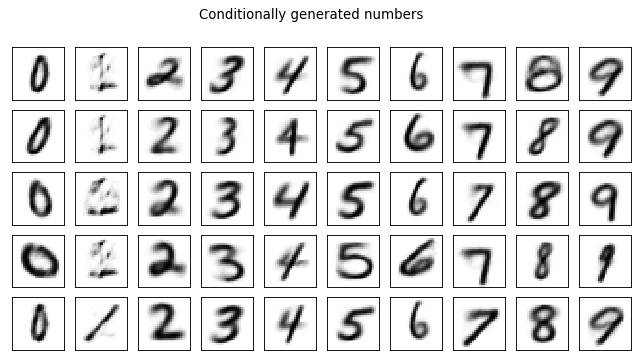

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 44 [0/50000 (0%)]	Losses E: 0.6889, AE: 0.1232, D: 0.6932
Train Epoch: 44 [25000/50000 (50%)]	Losses E: 0.6887, AE: 0.1428, D: 0.6934
Train Epoch: 44 [50000/50000 (100%)]	Losses E: 0.6897, AE: 0.1054, D: 0.6932


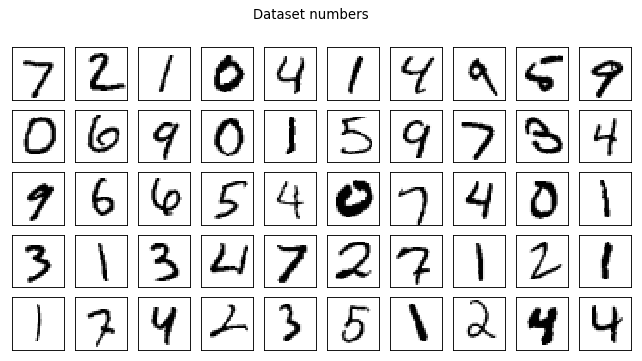

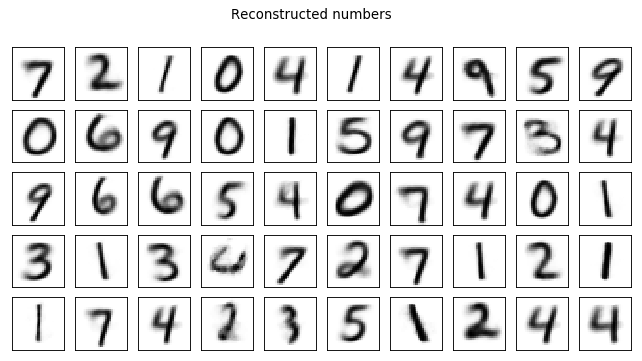

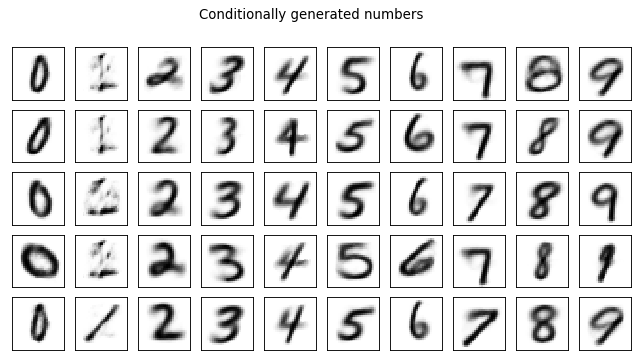

Test losses. E: 0.0034, AE: 0.0007, D: 0.0035
Train Epoch: 45 [0/50000 (0%)]	Losses E: 0.6896, AE: 0.1266, D: 0.6932
Train Epoch: 45 [25000/50000 (50%)]	Losses E: 0.6899, AE: 0.1395, D: 0.6931
Train Epoch: 45 [50000/50000 (100%)]	Losses E: 0.6915, AE: 0.1176, D: 0.6931


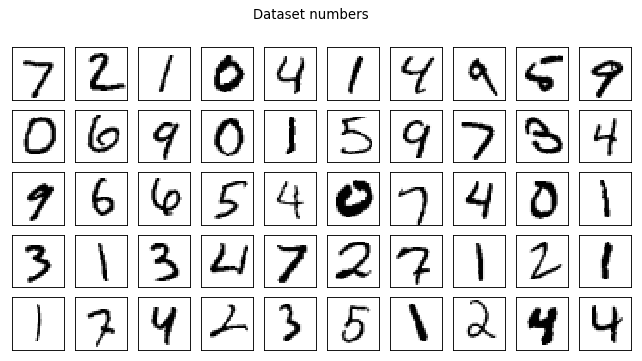

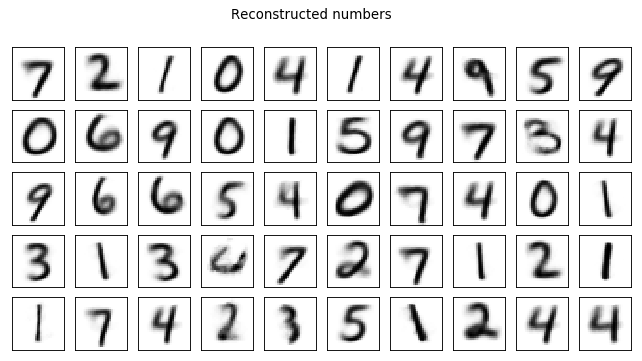

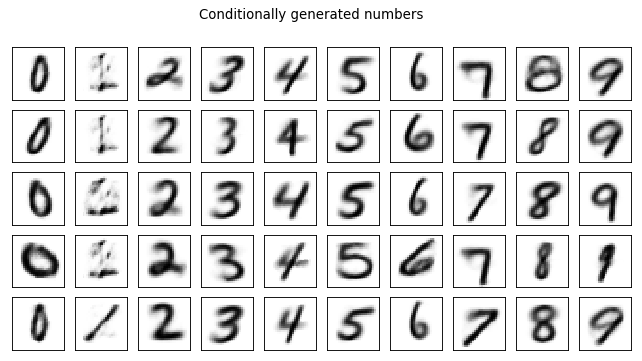

Test losses. E: 0.0035, AE: 0.0006, D: 0.0035
Train Epoch: 46 [0/50000 (0%)]	Losses E: 0.6914, AE: 0.1087, D: 0.6931
Train Epoch: 46 [25000/50000 (50%)]	Losses E: 0.6901, AE: 0.1309, D: 0.6931
Train Epoch: 46 [50000/50000 (100%)]	Losses E: 0.6901, AE: 0.1283, D: 0.6932


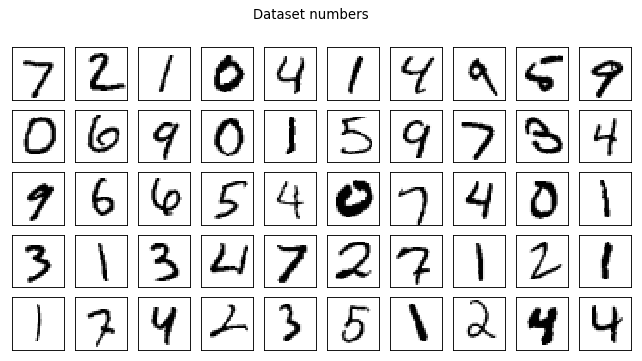

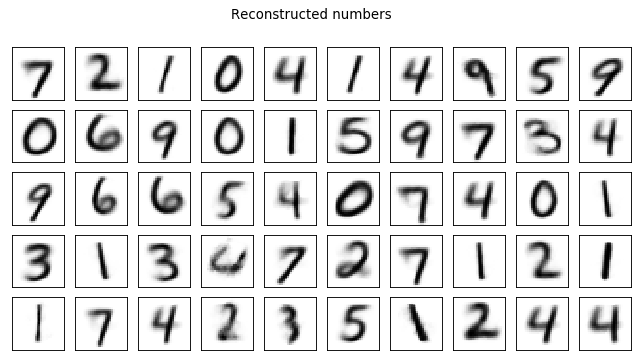

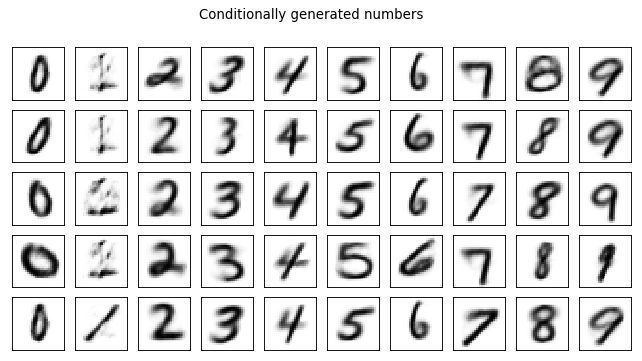

Test losses. E: 0.0035, AE: 0.0006, D: 0.0035
Train Epoch: 47 [0/50000 (0%)]	Losses E: 0.6901, AE: 0.1238, D: 0.6932
Train Epoch: 47 [25000/50000 (50%)]	Losses E: 0.6890, AE: 0.1225, D: 0.6934
Train Epoch: 47 [50000/50000 (100%)]	Losses E: 0.6900, AE: 0.1163, D: 0.6932


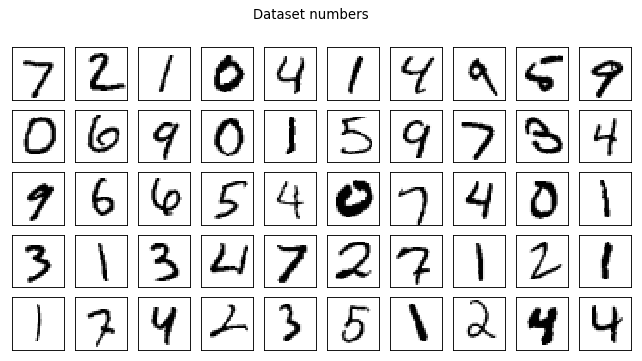

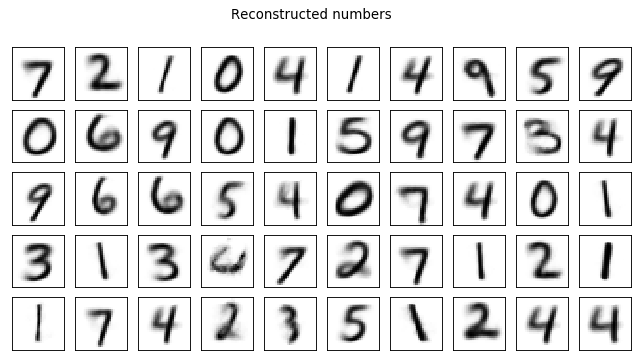

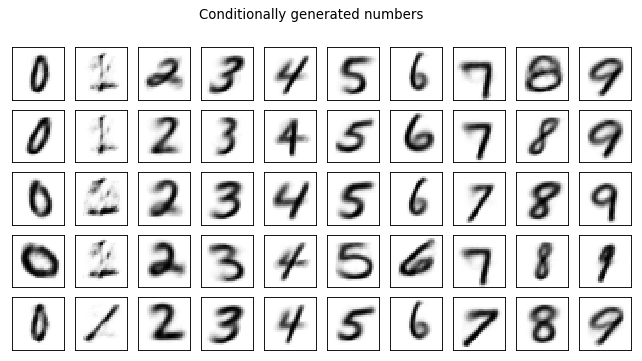

Test losses. E: 0.0035, AE: 0.0006, D: 0.0035
Train Epoch: 48 [0/50000 (0%)]	Losses E: 0.6899, AE: 0.1054, D: 0.6933
Train Epoch: 48 [25000/50000 (50%)]	Losses E: 0.6885, AE: 0.1269, D: 0.6932
Train Epoch: 48 [50000/50000 (100%)]	Losses E: 0.6893, AE: 0.1264, D: 0.6930


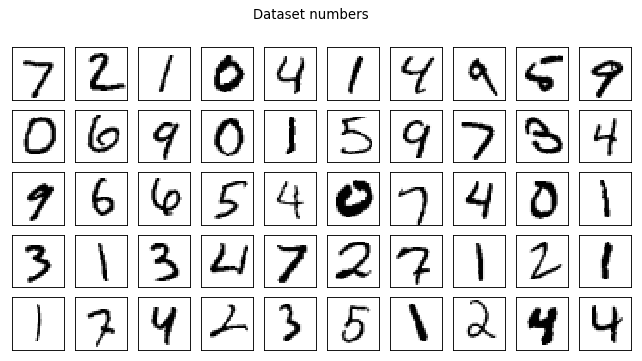

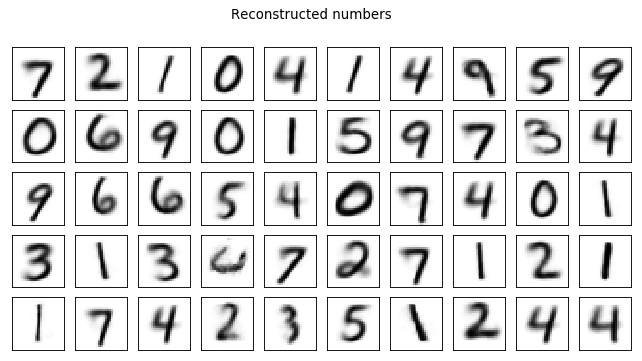

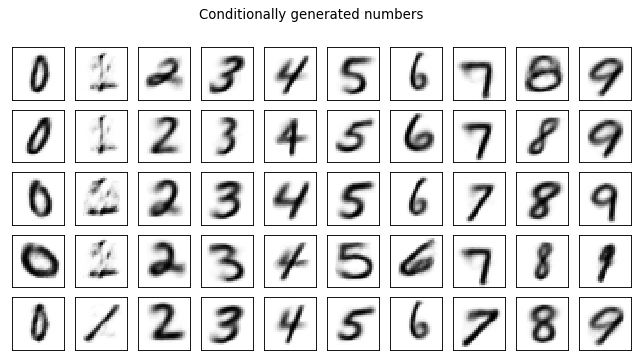

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 49 [0/50000 (0%)]	Losses E: 0.6890, AE: 0.1339, D: 0.6933
Train Epoch: 49 [25000/50000 (50%)]	Losses E: 0.6897, AE: 0.1296, D: 0.6933
Train Epoch: 49 [50000/50000 (100%)]	Losses E: 0.6898, AE: 0.1160, D: 0.6929


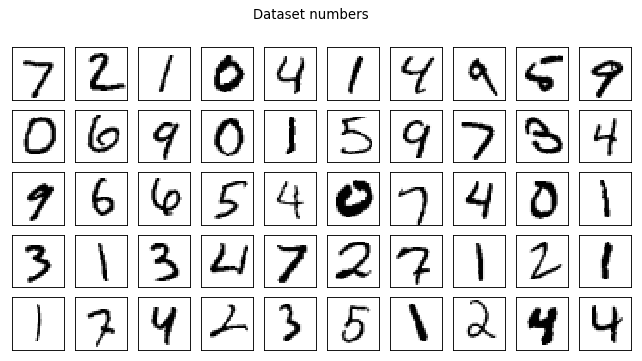

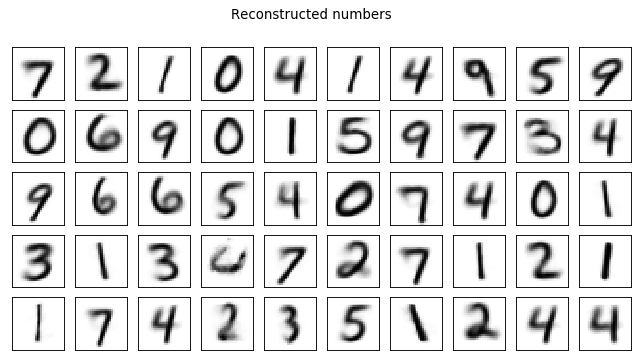

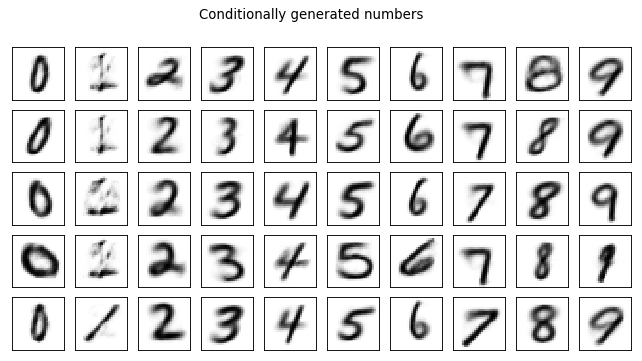

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035
Train Epoch: 50 [0/50000 (0%)]	Losses E: 0.6897, AE: 0.1307, D: 0.6932
Train Epoch: 50 [25000/50000 (50%)]	Losses E: 0.6881, AE: 0.1089, D: 0.6933
Train Epoch: 50 [50000/50000 (100%)]	Losses E: 0.6894, AE: 0.1222, D: 0.6930


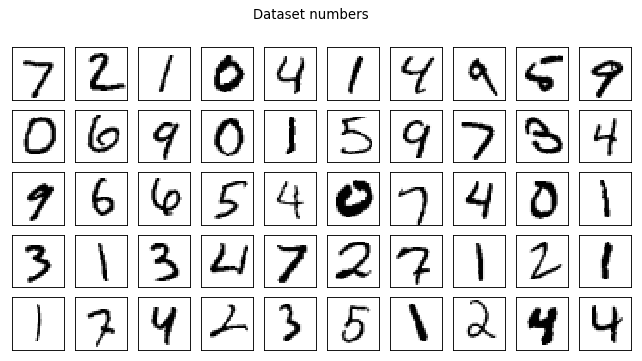

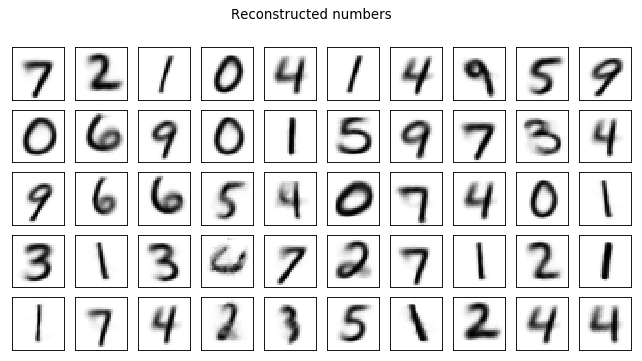

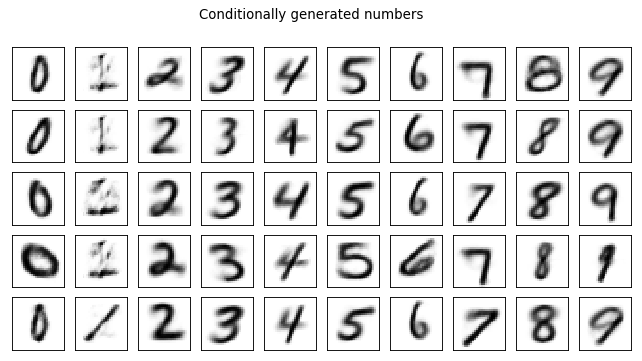

Test losses. E: 0.0034, AE: 0.0006, D: 0.0035


In [23]:
with torch.cuda.device(0):
    for epoch in range(1, 51):
        enc_unf.train()
        dec_unf.train()
        disc_unf.train()
        train(epoch, enc_unf, dec_unf, disc_unf, train_log)
        enc_unf.eval()
        dec_unf.eval()
        disc_unf.eval()
        test(enc_unf, dec_unf, disc_unf, valid_loader, epoch, test_log)

### MNIST classifier

In [148]:
class Net(nn.Module):
    
    def __init__(self, name, encoded=False, lr=0.001):
        super(Net, self).__init__()
        self.encoded = encoded
        
        if self.encoded:
            self.fc1 = nn.Linear(z_dim, 64)
            self.bn1 = nn.BatchNorm1d(64)
            self.fc2 = nn.Linear(64, 128)
            self.bn2 = nn.BatchNorm1d(128)
            self.fc3 = nn.Linear(128, 10)
        else:
            self.pool = nn.MaxPool2d(2, 2)
            self.conv1 = nn.Conv2d(1, 8, 5)
            self.bn1 = nn.BatchNorm2d(8)
            self.conv2 = nn.Conv2d(8, 16, 3)
            self.bn2 = nn.BatchNorm2d(16)
            self.conv3 = nn.Conv2d(16, 32, 3)
            self.bn3 = nn.BatchNorm2d(32)
            self.fc1 = nn.Linear(32 * 4 * 4, 128)
            self.bn4 = nn.BatchNorm1d(128)
            self.fc2 = nn.Linear(128, num_classes)
        
        self.name = name
        
        self.optim = optim.Adam(self.parameters(), lr=lr)
    
    def forward(self, x):
        if self.encoded:
            x = self.bn1(F.relu(self.fc1(x)))
            x = self.bn2(F.relu(self.fc2(x)))
            x = F.relu(self.fc3(x))
        else:
            x = self.pool(self.bn1(F.relu(self.conv1(x))))
            x = self.bn2(F.relu(self.conv2(x)))
            x = self.pool(self.bn3(F.relu(self.conv3(x))))
            x = x.view(-1, 32 * 4 * 4)
            x = self.bn4(F.relu(self.fc1(x)))
            x = F.relu(self.fc2(x))

        x = F.log_softmax(x, dim=1)
        
        return x
    
    def loss(self, output, target, **kwargs):
        self._loss = F.nll_loss(output, target, **kwargs)
        
        return self._loss

In [149]:
def train(epoch, model, encoder=None):
    
    print('Training epoch: {}'.format(epoch))
    
    with torch.cuda.device(0):
        for data, target in train_loader:
            model.optim.zero_grad()
            
            if model.encoded:
                data = encoder(data.view(-1, 28 * 28))
            output = model(data)
            loss = model.loss(output, target)
            loss.backward()
            model.optim.step()

In [150]:
def test(model, loader, encoder=None):
    
    with torch.cuda.device(0):
        test_size = len(loader.sampler)

        test_loss = 0
        correct = 0

        with torch.no_grad():
            for data, target in loader:
                
                if model.encoded:
                    data = encoder(data.view(-1, 28 * 28))
                output = model(data)
                test_loss += model.loss(output, target, size_average=False).item() 
                pred = output.data.max(1, keepdim=True)[1]
                correct += pred.eq(target.data.view_as(pred)).cpu().sum().item()

        test_loss /= test_size
        acc = correct / test_size

        test_losses.append(test_loss)
        test_acc.append(acc)
    
    print(f'Test loss {test_loss}\tTest accuracy {acc:.4f}\n')

In [151]:
with torch.cuda.device(0):
    acc_and_losses = defaultdict(dict)
    names = ['mnist', 'enc', 'enc_unf']
    for name, encoder in zip(names, [None, enc, enc_unf]):
        print('Training model "{}"\n'.format(name))
        
        model = Net(name, name in names[1:])

        test_losses = []
        test_acc = []

        for epoch in range(1, 26):
            model.train()
            train(epoch, model, encoder)
            model.eval()
            test(model, test_loader, encoder)

        acc_and_losses[model.name]['acc'] = test_acc
        acc_and_losses[model.name]['loss'] = test_losses

Training model "mnist"

Training epoch: 1
Test loss 0.04666830251142383	Test accuracy 0.9859

Training epoch: 2
Test loss 0.038934540977235886	Test accuracy 0.9881

Training epoch: 3
Test loss 0.033964068434177895	Test accuracy 0.9884

Training epoch: 4
Test loss 0.0331819048530655	Test accuracy 0.9892

Training epoch: 5
Test loss 0.03173106382475235	Test accuracy 0.9902

Training epoch: 6
Test loss 0.03230303767163423	Test accuracy 0.9902

Training epoch: 7
Test loss 0.036070512420186426	Test accuracy 0.9897

Training epoch: 8
Test loss 0.02520739724773739	Test accuracy 0.9915

Training epoch: 9
Test loss 0.03253997608477366	Test accuracy 0.9898

Training epoch: 10
Test loss 0.03197293467383133	Test accuracy 0.9908

Training epoch: 11
Test loss 0.028212826274453255	Test accuracy 0.9923

Training epoch: 12
Test loss 0.03109647307046398	Test accuracy 0.9913

Training epoch: 13
Test loss 0.037961063473589456	Test accuracy 0.9907

Training epoch: 14
Test loss 0.035833225940666305	Test acc

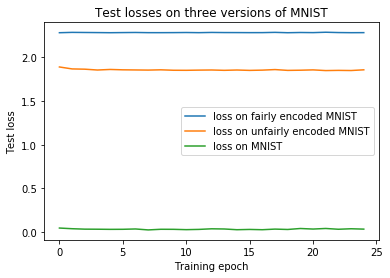

In [153]:
# plotting the test loss

epochs = range(len(test_acc))

plt.plot(epochs, acc_and_losses['enc']['loss'], label='loss on fairly encoded MNIST')
plt.plot(epochs, acc_and_losses['enc_unf']['loss'], label='loss on unfairly encoded MNIST')
plt.plot(epochs, acc_and_losses['mnist']['loss'], label='loss on MNIST')
plt.xlabel('Training epoch')
plt.ylabel('Test loss')
plt.title('Test losses on three versions of MNIST')
plt.legend();

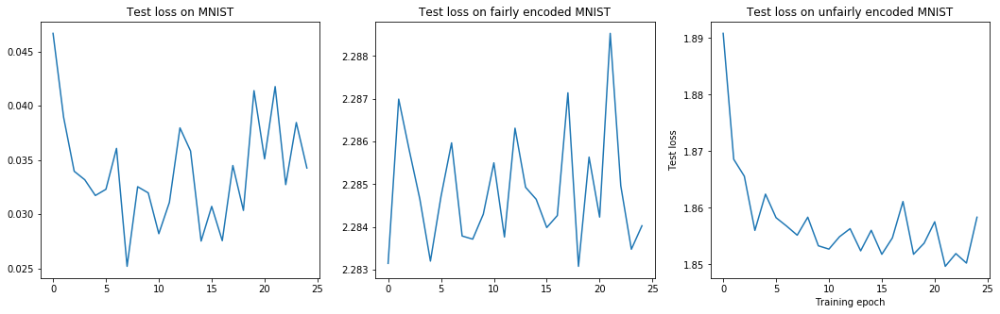

In [154]:
# more granular look at the test loss

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True)
fig.set_size_inches(18, 5)
plt.xlabel('Training epoch')
plt.ylabel('Test loss')
ax1.plot(epochs, acc_and_losses['mnist']['loss'])
ax1.set_title('Test loss on MNIST')
ax2.plot(epochs, acc_and_losses['enc']['loss'])
ax2.set_title('Test loss on fairly encoded MNIST')
ax3.plot(epochs, acc_and_losses['enc_unf']['loss'])
ax3.set_title('Test loss on unfairly encoded MNIST');

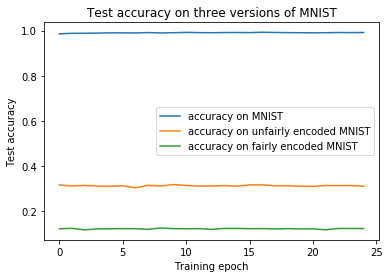

In [155]:
# plotting the test accuracy

plt.plot(epochs, acc_and_losses['mnist']['acc'], label='accuracy on MNIST')
plt.plot(epochs, acc_and_losses['enc_unf']['acc'], label='accuracy on unfairly encoded MNIST')
plt.plot(epochs, acc_and_losses['enc']['acc'], label='accuracy on fairly encoded MNIST')
plt.xlabel('Training epoch')
plt.ylabel('Test accuracy')
plt.title('Test accuracy on three versions of MNIST')
plt.legend();

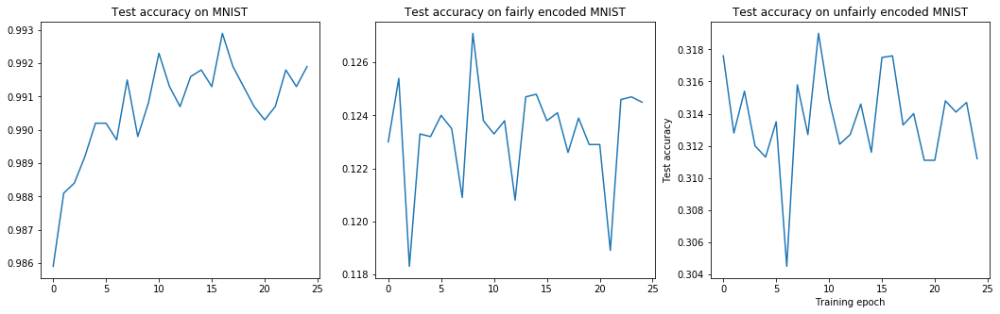

In [156]:
# more granular look at the test accuracy

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True)
fig.set_size_inches(18, 5)
plt.xlabel('Training epoch')
plt.ylabel('Test accuracy')
ax1.plot(epochs, acc_and_losses['mnist']['acc'])
ax1.set_title('Test accuracy on MNIST')
ax2.plot(epochs, acc_and_losses['enc']['acc'])
ax2.set_title('Test accuracy on fairly encoded MNIST')
ax3.plot(epochs, acc_and_losses['enc_unf']['acc'])
ax3.set_title('Test accuracy on unfairly encoded MNIST');

## Задание 2 (необязательное). Сделать перенос стиля с одной цифры на другие с помощью "честного" CAAE.

In [292]:
data, labels = next(iter(valid_loader))

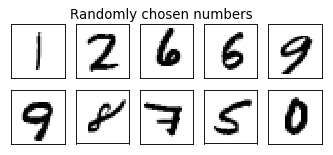

In [335]:
random_nums = data[np.random.choice(batch_size, num_classes, replace=False)]
plot_mnist(random_nums, (2, 5), 'Randomly chosen numbers')

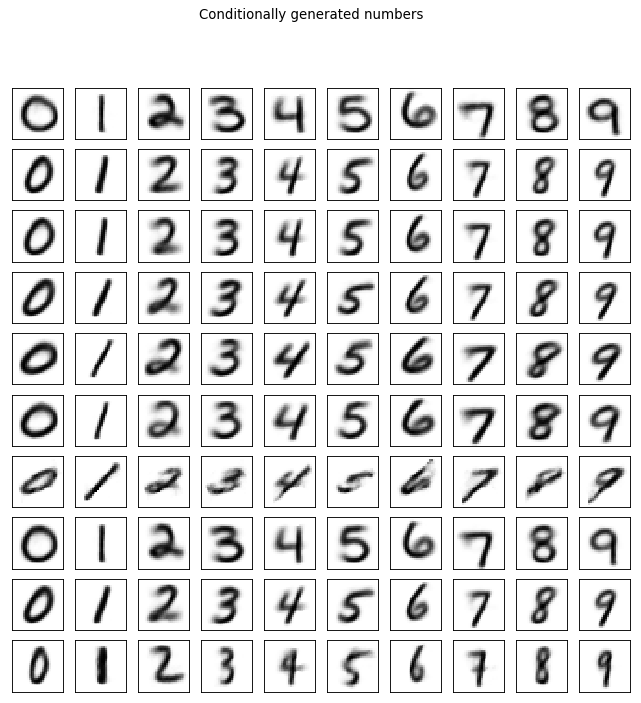

In [336]:
# testing conditional generation

encoded_nums = enc(random_nums.view(-1, 28 * 28))
classes = torch.eye(num_classes)

to_plot = []

for idx in range(encoded_nums.shape[0]):
    decoded = dec(encoded_nums[idx].repeat((num_classes)).view(-1, 2), classes).data.numpy()
    to_plot.append(decoded)

to_plot = np.array(to_plot).reshape(-1, 1, 28, 28)
plot_mnist(to_plot, (num_classes, num_classes), 'Conditionally generated numbers')